In [1]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [3]:
import seaborn as sns
import pandas as pd
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
import pickle as pkl
import matplotlib.pyplot as plt
from circuit_toolkit.Optimizers import CholeskyCMAES_torch
from tqdm.auto import trange

### Define invertible layers


In [4]:
import torch
import torch.nn as nn
import torch.nn.functional as F

class RealNVP2D(nn.Module):
    """
    A single RealNVP-like coupling layer in 2D, splitting x into (x1, x2):
        x1' = x1
        x2' = x2 * exp(s(x1)) + t(x1)
    with a small MLP to learn s and t.
    """
    def __init__(self, hidden_dim=16):
        super().__init__()
        # We create a small neural network that takes x1 as input (1D)
        # and outputs scale and shift (each 1D).
        # For simplicity, we do a 2-layer MLP: 1 -> hidden_dim -> 2
        # The output dimension is 2 => (s, t)
        
        self.net = nn.Sequential(
            nn.Linear(1, hidden_dim),
            nn.SiLU(),
            nn.Linear(hidden_dim, hidden_dim),
            nn.SiLU(),
            nn.Linear(hidden_dim, 2)  # final layer outputs [s, t]

        )
        
    def forward(self, x, reverse=False, ):
        """
        Forward or inverse pass.
        

        Args:
            x: Tensor of shape (batch, 2).
            reverse: bool. If False, apply forward transform x -> x'.
                     If True, apply inverse transform x' -> x.
        
        Returns:
            x_out: transformed tensor (batch, 2).
            log_det: log determinant of the Jacobian of the transform, 
                     shape (batch,).
        """
        x1 = x[:, 0:1]  # shape (batch, 1)
        x2 = x[:, 1:2]  # shape (batch, 1)
        
        # Compute scale and shift from x1
        st = self.net(x1)  # shape (batch, 2)
        s = st[:, 0:1]      # scale
        t = st[:, 1:2]      # shift
        
        if not reverse:
            # forward: x2' = x2 * exp(s) + t
            x2_out = x2 * torch.exp(s) + t
            x_out = torch.cat([x1, x2_out], dim=1)
            
            # log determinant = sum of log|scale| for each dimension of x2
            # here it's just 1D, so log_det = s
            log_det = s.squeeze(dim=1)  # shape (batch,)
            
        else:
            # inverse: x2 = (x2' - t) * exp(-s)
            x2_out = (x2 - t) * torch.exp(-s)
            x_out = torch.cat([x1, x2_out], dim=1)
            
            # For inverse, the log_det is -s (since determinant is inverse scale)
            log_det = -s.squeeze(dim=1)
        
        return x_out, log_det

import torch
import torch.nn as nn

class RealNVP2DStabilized(nn.Module):
    """
    A RealNVP-like coupling layer in 2D with a stabilization trick,
    splitting x into (x1, x2):
        x1' = x1
        x2' = x2 * exp(s) + t
    where s is scaled/stabilized.
    """
    def __init__(self, hidden_dim=16):
        super().__init__()
        
        # Small neural network that takes x1 as input (1D)
        # and outputs [s, t] (each 1D).
        self.net = nn.Sequential(
            nn.Linear(1, hidden_dim),
            nn.SiLU(),
            nn.Linear(hidden_dim, hidden_dim),
            nn.SiLU(),
            nn.Linear(hidden_dim, 2)  # final layer outputs [s, t]
        )

        # A trainable scaling factor to stabilize the learned s
        # Start with zero => s_fac = e^0 = 1.0 initially
        self.scaling_factor = nn.Parameter(torch.zeros(1))

    def forward(self, x, reverse=False):
        """
        Forward or inverse pass.
        
        Args:
            x: Tensor of shape (batch, 2).
            reverse: bool. If False, apply forward transform x -> x'. 
                     If True, apply inverse transform x' -> x.
        
        Returns:
            x_out: transformed tensor (batch, 2).
            log_det: log determinant of the Jacobian of the transform, 
                     shape (batch,).
        """
        x1 = x[:, 0:1]  # shape (batch, 1)
        x2 = x[:, 1:2]  # shape (batch, 1)
        
        # Compute scale and shift from x1
        st = self.net(x1)      # shape (batch, 2)
        s = st[:, 0:1]         # scale (raw)
        t = st[:, 1:2]         # shift

        # Stabilize the scale parameter s
        # 1) Exponentiate scaling_factor => s_fac
        # 2) Scale raw s by 1/s_fac, squash with tanh,
        # 3) multiply back by s_fac
        s_fac = self.scaling_factor.exp()  # shape: () scalar
        s = torch.tanh(s / s_fac) * s_fac

        if not reverse:
            # forward: x2' = x2 * exp(s) + t
            x2_out = x2 * torch.exp(s) + t
            x_out = torch.cat([x1, x2_out], dim=1)

            # log determinant = sum of log|scale| for each dimension (1D)
            log_det = s.squeeze(dim=1)
        else:
            # inverse: x2 = (x2' - t) * exp(-s)
            x2_out = (x2 - t) * torch.exp(-s)
            x_out = torch.cat([x1, x2_out], dim=1)

            # for inverse, log_det = -s
            log_det = -s.squeeze(dim=1)

        return x_out, log_det



In [5]:
import torch
import torch.nn as nn
import torch.nn.functional as F

class RealNVPND(nn.Module):
    """
    A single RealNVP-like coupling layer in N dimensions (N must be even),
    splitting x into (x1, x2) each of dimension N/2:
        x1' = x1
        x2' = x2 * exp(s(x1)) + t(x1)
    with a small MLP to learn s and t.
    """
    def __init__(self, dim, hidden_dim=16):
        super().__init__()
        assert dim % 2 == 0, "Input dimension must be even"
        self.dim = dim
        self.split_dim = dim // 2
        
        # Neural network that takes x1 as input (N/2 dim)
        # and outputs scale and shift (each N/2 dim)
        self.net = nn.Sequential(
            nn.Linear(self.split_dim, hidden_dim),
            nn.SiLU(),
            nn.Linear(hidden_dim, hidden_dim),
            nn.SiLU(),
            nn.Linear(hidden_dim, self.split_dim * 2)  # outputs [s, t] each N/2 dim
        )
        
    def forward(self, x, reverse=False):
        """
        Forward or inverse pass.
        
        Args:
            x: Tensor of shape (batch, N).
            reverse: bool. If False, apply forward transform x -> x'.
                     If True, apply inverse transform x' -> x.
        
        Returns:
            x_out: transformed tensor (batch, N).
            log_det: log determinant of the Jacobian of the transform, 
                     shape (batch,).
        """
        x1 = x[:, :self.split_dim]  # shape (batch, N/2)
        x2 = x[:, self.split_dim:]  # shape (batch, N/2)
        
        # Compute scale and shift from x1
        st = self.net(x1)  # shape (batch, N)
        s = st[:, :self.split_dim]      # scale
        t = st[:, self.split_dim:]      # shift
        
        if not reverse:
            # forward: x2' = x2 * exp(s) + t
            x2_out = x2 * torch.exp(s) + t
            x_out = torch.cat([x1, x2_out], dim=1)
            
            # log determinant = sum of log|scale| for each dimension of x2
            log_det = s.sum(dim=1)  # shape (batch,)
            
        else:
            # inverse: x2 = (x2' - t) * exp(-s)
            x2_out = (x2 - t) * torch.exp(-s)
            x_out = torch.cat([x1, x2_out], dim=1)
            
            # For inverse, the log_det is -sum(s)
            log_det = -s.sum(dim=1)
        
        return x_out, log_det

class RealNVPNDStabilized(nn.Module):
    """
    A RealNVP-like coupling layer in N dimensions (N must be even) with a stabilization trick,
    splitting x into (x1, x2) each of dimension N/2:
        x1' = x1
        x2' = x2 * exp(s) + t
    where s is scaled/stabilized.
    """
    def __init__(self, dim, hidden_dim=16):
        super().__init__()
        assert dim % 2 == 0, "Input dimension must be even"
        self.dim = dim
        self.split_dim = dim // 2
        
        # Neural network that takes x1 as input (N/2 dim)
        # and outputs scale and shift (each N/2 dim)
        self.net = nn.Sequential(
            nn.Linear(self.split_dim, hidden_dim),
            nn.SiLU(),
            nn.Linear(hidden_dim, hidden_dim),
            nn.SiLU(),
            nn.Linear(hidden_dim, self.split_dim * 2)  # outputs [s, t] each N/2 dim
        )

        # A trainable scaling factor to stabilize the learned s
        # Start with zero => s_fac = e^0 = 1.0 initially
        self.scaling_factor = nn.Parameter(torch.zeros(1))

    def forward(self, x, reverse=False):
        """
        Forward or inverse pass.
        
        Args:
            x: Tensor of shape (batch, N).
            reverse: bool. If False, apply forward transform x -> x'. 
                     If True, apply inverse transform x' -> x.
        
        Returns:
            x_out: transformed tensor (batch, N).
            log_det: log determinant of the Jacobian of the transform, 
                     shape (batch,).
        """
        x1 = x[:, :self.split_dim]  # shape (batch, N/2)
        x2 = x[:, self.split_dim:]  # shape (batch, N/2)
        
        # Compute scale and shift from x1
        st = self.net(x1)      # shape (batch, N)
        s = st[:, :self.split_dim]         # scale (raw)
        t = st[:, self.split_dim:]         # shift

        # Stabilize the scale parameter s
        # 1) Exponentiate scaling_factor => s_fac
        # 2) Scale raw s by 1/s_fac, squash with tanh,
        # 3) multiply back by s_fac
        s_fac = self.scaling_factor.exp()  # shape: () scalar
        s = torch.tanh(s / s_fac) * s_fac

        if not reverse:
            # forward: x2' = x2 * exp(s) + t
            x2_out = x2 * torch.exp(s) + t
            x_out = torch.cat([x1, x2_out], dim=1)

            # log determinant = sum of log|scale| for each dimension
            log_det = s.sum(dim=1)
        else:
            # inverse: x2 = (x2' - t) * exp(-s)
            x2_out = (x2 - t) * torch.exp(-s)
            x_out = torch.cat([x1, x2_out], dim=1)

            # for inverse, log_det = -sum(s)
            log_det = -s.sum(dim=1)

        return x_out, log_det


In [6]:

import torch
import torch.nn as nn

class InvertibleLinear2D(nn.Module):
    """
    A learnable 2x2 invertible linear transform:
        z = x @ W
      log|det J| = log|det(W)|
    Inverse:
        x = z @ W^-1
      log|det J| = -log|det(W)|
    """
    def __init__(self):
        super().__init__()
        # Create a 2x2 parameter
        # Initialize with something invertible
        W_init = torch.randn(2, 2) * 0.1
        if torch.det(W_init).abs() < 1e-5:
            # re-init or add identity for safety
            W_init = W_init + 0.5 * torch.eye(2)
        
        self.W = nn.Parameter(W_init)  # shape (2, 2)

    def forward(self, x, reverse=False):
        """
        x: (batch, 2) or (N,2)
        reverse: bool, if True apply inverse transform
        Returns: x_out, log_det (batch,) 
        """
        # shape (2,2)
        W_mat = self.W
        
        # Pre-compute log-det|W|
        # We do it once per forward call; it’s a constant w.r.t. batch dimension
        det_val = torch.det(W_mat)
        if det_val.abs() < 1e-12:
            # (Optional) In real code, might clamp or reparam to avoid singularities
            # For demonstration, we just proceed. 
            pass
        log_abs_det = torch.log(torch.abs(det_val) + 1e-12)
        
        if not reverse:
            # Forward: z = x * W
            x_out = x @ W_mat  # shape (batch,2)
            log_det = log_abs_det.repeat(x.size(0))  # replicate for each sample
        else:
            # Inverse: x = z * W^-1
            W_inv = torch.inverse(W_mat)
            x_out = x @ W_inv
            # log-det of the inverse is the negative of log-det(W)
            log_det = -log_abs_det.repeat(x.size(0))
        
        return x_out, log_det


class Orthogonal2D(nn.Module):
    """
    A 2D orthogonal transform M in O(2):
      - A learnable angle 'theta' for rotation.
      - A fixed boolean 'reflection' that, if True, multiplies by diag(1, -1).
    The determinant is either +1 (rotation only) or -1 (with reflection), and
    |det(M)| = 1 => log|det(M)| = 0.
    
    Forward pass (reverse=False):   z = x @ M
    Inverse pass (reverse=True):    x = z @ M^T
    """
    def __init__(self, reflection=False, random_init=False, shift=False):
        """
        Args:
          reflection: bool, whether to apply reflection as well.

        """
        super().__init__()
        # We'll learn a single angle theta. Initialize at 0 => identity transform.
        self.theta = nn.Parameter(torch.zeros(1))
        if random_init:
            self.theta.data = torch.rand(1) * 2 * torch.pi
        self.reflection = reflection
        self.shift = shift
        if shift:
            self.offset = nn.Parameter(torch.zeros(2))
            if random_init:
                self.offset.data = torch.randn(2)
        else:
            self.offset = None


    def forward(self, x, reverse=False):
        """
        x: Tensor of shape (batch, 2).
        reverse: bool => if True, apply the inverse transform (i.e. multiply by M^T).
        Returns: (x_out, log_abs_det), 
                 x_out = x*M or x*M^T, 
                 log_abs_det = 0 for all samples.
        """
        # Compute rotation matrix from theta
        cos_theta = torch.cos(self.theta)
        sin_theta = torch.sin(self.theta)
        # Construct R(\theta)
        # shape: (2,2)
        R = torch.stack([
            torch.cat([cos_theta, -sin_theta], dim=0),
            torch.cat([sin_theta,  cos_theta], dim=0)
        ], dim=0)  # Overall shape (2,2)

        # If reflection=True, multiply by diag(1, -1) => determinant = -1
        if self.reflection:
            # D = [[1, 0], [0, -1]]
            D = torch.diag(torch.tensor([1., -1.], device=x.device, dtype=x.dtype))
            M = D @ R   # shape (2,2), det(M) = -1
        else:
            M = R       # shape (2,2), det(M) = +1

        if not reverse:
            # Forward pass => z = x @ M
            x_out = x @ M
            if self.shift:
                x_out += self.offset
        else:
            # Inverse pass => x = z @ M^T = z @ inverse(M), 

            # but for orthonormal M, inverse(M) = M^T
            if self.shift:
                x -= self.offset
            x_out = x @ M.t()

        # For orthonormal M, |det(M)|=1 => log|det(M)|=0
        log_abs_det = torch.zeros(x.size(0), device=x.device)
        return x_out, log_abs_det



# create a model composed of 4 coupling layers, alternating between x1 and x2, interleaving a layer swapping x1 and x2

# class RealNVP_stack(nn.Module):
#     def __init__(self, hidden_dim=16, stack_size=4):
#         super().__init__()
#         self.coupling_layers = nn.ModuleList([RealNVP2D(hidden_dim) for _ in range(stack_size)])
#         # Create a permutation matrix that swaps x1 and x2
#         self.swap_layer = nn.Linear(2, 2, bias=False)
#         self.swap_layer.weight.data = torch.tensor([[0., 1.], [1., 0.]])  # Permutation matrix to swap dimensions

#     def forward(self, x, reverse=False):
#         log_det_total = 0.0
#         if not reverse:
#             for i, layer in enumerate(self.coupling_layers):
#                 x, log_det = layer(x, False)
#                 log_det_total += log_det
#                 x, log_det = self.swap_layer(x), 0.0
#                 log_det_total += log_det
#         else:
#             for i, layer in enumerate(self.coupling_layers[::-1]):
#                 x, log_det = self.swap_layer(x), 0.0
#                 log_det_total += log_det
#                 x, log_det = layer(x, True)
#                 log_det_total += log_det

#         return x, log_det_total
    
    


In [7]:
import torch
import torch.nn as nn

class InvertibleLinearND(nn.Module):
    """
    An N-dimensional invertible linear transform:
        z = x @ W
      log|det J| = log|det(W)|
    Inverse:
        x = z @ W^-1
      log|det J| = -log|det(W)|
    """
    def __init__(self, dim, dtype=torch.float):
        super().__init__()
        self.dim = dim
        # Create a dim x dim parameter
        # Initialize with something invertible
        W_init = torch.randn(dim, dim, dtype=dtype) * 0.1
        if torch.det(W_init).abs() < 1e-5:
            # re-init or add identity for safety
            W_init = W_init + 0.5 * torch.eye(dim, dtype=dtype)
        
        self.W = nn.Parameter(W_init)  # shape (dim, dim)
        #TODO: compute inverse prehand

    def forward(self, x, reverse=False):
        """
        x: (batch, dim) or (N,dim)
        reverse: bool, if True apply inverse transform
        Returns: x_out, log_det (batch,) 
        """
        # shape (dim,dim)
        W_mat = self.W
        
        # Pre-compute log-det|W|
        det_val = torch.det(W_mat)
        if det_val.abs() < 1e-12:
            pass
        log_abs_det = torch.log(torch.abs(det_val) + 1e-12)
        
        if not reverse:
            # Forward: z = x * W
            x_out = x @ W_mat  # shape (batch,dim)
            log_det = log_abs_det.repeat(x.size(0))  # replicate for each sample
        else:
            # Inverse: x = z * W^-1
            W_inv = torch.inverse(W_mat)
            x_out = x @ W_inv
            log_det = -log_abs_det.repeat(x.size(0))
        
        return x_out, log_det

class OrthogonalND(nn.Module):
    """
    An N-dimensional orthogonal transform using a random orthogonal matrix.
    The determinant is ±1 so log|det(M)| = 0.
    """
    def __init__(self, dim, random_init=True, shift=False, allow_reflect=False, dtype=torch.float):
        """
        Args:
          dim: int, dimension of the transform
          random_init: bool, whether to randomly initialize the matrix
          shift: bool, whether to add a learnable shift
        """
        super().__init__()
        self.dim = dim
        
        # Initialize random orthogonal matrix using QR decomposition
        if random_init:
            A = torch.randn(dim, dim, dtype=dtype)
            Q, R = torch.linalg.qr(A)
            # Make Q have determinant 1
            if not allow_reflect:
                d = torch.diag(R).sign()
                Q *= d.unsqueeze(0)
        else:
            Q = torch.eye(dim, dtype=dtype)
            
        self.M = nn.Parameter(Q)
        
        self.shift = shift
        if shift:
            self.offset = nn.Parameter(torch.zeros(dim, dtype=dtype))
            if random_init:
                self.offset.data = torch.randn(dim, dtype=dtype)
        else:
            self.offset = None

    def forward(self, x, reverse=False):
        """
        x: Tensor of shape (batch, dim)
        reverse: bool => if True, apply inverse transform
        Returns: (x_out, log_abs_det)
        """
        if not reverse:
            x_out = x @ self.M
            if self.shift:
                x_out += self.offset
        else:
            if self.shift:
                x = x - self.offset
            x_out = x @ self.M.t()  # M^T = M^{-1} for orthogonal matrices

        # For orthogonal M, |det(M)|=1 => log|det(M)|=0
        log_abs_det = torch.zeros(x.size(0), device=x.device)
        return x_out, log_abs_det


In [8]:

class RealNVP_stack(nn.Module):
    """
    A stack of RealNVP2D coupling layers, each followed by
    its own invertible linear transform in 2D.
    """
    def __init__(self, hidden_dim=16, stack_size=4, linear_type="general", stabilized=False):
        super().__init__()
        # Create coupling layers.
        # We'll alternate the 'mask_first' so that different dims
        # are the "active" dimension across layers.
        self.coupling_layers = nn.ModuleList([
            RealNVP2DStabilized(hidden_dim, ) if stabilized else RealNVP2D(hidden_dim)
            for i in range(stack_size)
        ])

        # Create an invertible linear transform after each coupling layer
        if linear_type == "general":
            self.linear_layers = nn.ModuleList([
                InvertibleLinear2D() for _ in range(stack_size)
            ])
        elif linear_type == "orthogonal_shift":
            self.linear_layers = nn.ModuleList([
                Orthogonal2D(reflection=True if i % 2 == 0 else False, random_init=True, shift=True) for i in range(stack_size)
            ])
        elif linear_type == "orthogonal":

            self.linear_layers = nn.ModuleList([
                Orthogonal2D(reflection=True if i % 2 == 0 else False, random_init=True, shift=False) for i in range(stack_size)
            ])
        elif linear_type == "special_orthogonal":
            self.linear_layers = nn.ModuleList([
                Orthogonal2D(reflection=False, random_init=True, shift=False) for _ in range(stack_size)
            ])
        else:
            raise ValueError(f"Invalid linear_type: {linear_type}")

        self.stack_size = stack_size

    def forward(self, x, reverse=False):
        """
        x: (batch, 2)
        reverse: whether to apply the inverse pass
        Returns: (x_out, total_log_det)
        """
        log_det_total = torch.zeros(x.size(0), device=x.device)
        
        if not reverse:
            # Forward pass
            # For i in [0..stack_size-1]:
            #   x, ld_coup = coupling_layers[i](x, False)
            #   x, ld_lin  = linear_layers[i](x, False)
            #   accumulate log_det
            for i in range(self.stack_size):
                x, ld_coup = self.coupling_layers[i](x, reverse=False)
                log_det_total += ld_coup
                x, ld_lin = self.linear_layers[i](x, reverse=False)
                log_det_total += ld_lin
        else:
            # Inverse pass
            # We go in reverse order:
            #   x, ld_lin  = linear_layers[i]  (x, True)
            #   x, ld_coup = coupling_layers[i](x, True)
            for i in reversed(range(self.stack_size)):
                x, ld_lin = self.linear_layers[i](x, reverse=True)
                log_det_total += ld_lin
                x, ld_coup = self.coupling_layers[i](x, reverse=True)
                log_det_total += ld_coup

        return x, log_det_total

In [9]:

class RealNVPND_stack(nn.Module):
    """
    A stack of RealNVP2D coupling layers, each followed by
    its own invertible linear transform in 2D.
    """
    def __init__(self, dim, hidden_dim=16, stack_size=4, linear_type="general", stabilized=False, dtype=torch.float32):
        super().__init__()
        # Create coupling layers.
        # We'll alternate the 'mask_first' so that different dims
        # are the "active" dimension across layers.
        self.coupling_layers = nn.ModuleList([
            RealNVPNDStabilized(dim, hidden_dim) if stabilized else RealNVPND(dim, hidden_dim)
            for i in range(stack_size)
        ])
        self.coupling_layers = self.coupling_layers.to(dtype)

        # Create an invertible linear transform after each coupling layer
        if linear_type == "general":
            self.linear_layers = nn.ModuleList([
                InvertibleLinearND(dim, dtype=dtype) for _ in range(stack_size)
            ])
        elif linear_type == "orthogonal_shift":
            self.linear_layers = nn.ModuleList([
                OrthogonalND(dim, random_init=True, shift=True, dtype=dtype) for i in range(stack_size)
            ])
        elif linear_type == "orthogonal":

            self.linear_layers = nn.ModuleList([
                OrthogonalND(dim, random_init=True, shift=False, dtype=dtype) for i in range(stack_size)
            ])
        else:
            raise ValueError(f"Invalid linear_type: {linear_type}")

        self.stack_size = stack_size

    def forward(self, x, reverse=False, early_stop_layer=None):
        """
        x: (batch, dim)
        reverse: whether to apply the inverse pass
        Returns: (x_out, total_log_det)
        """
        log_det_total = torch.zeros(x.size(0), device=x.device)
        if early_stop_layer is None:
            early_stop_layer = self.stack_size
        if not reverse:
            # Forward pass
            # For i in [0..stack_size-1]:
            #   x, ld_coup = coupling_layers[i](x, False)
            #   x, ld_lin  = linear_layers[i](x, False)
            #   accumulate log_det
            for i in range(min(self.stack_size, early_stop_layer)):
                x, ld_coup = self.coupling_layers[i](x, reverse=False)
                log_det_total += ld_coup
                x, ld_lin = self.linear_layers[i](x, reverse=False)
                log_det_total += ld_lin
        else:
            # Inverse pass
            # We go in reverse order:
            #   x, ld_lin  = linear_layers[i]  (x, True)
            #   x, ld_coup = coupling_layers[i](x, True)
            for i in reversed(range(min(self.stack_size, early_stop_layer))):
                x, ld_lin = self.linear_layers[i](x, reverse=True)
                log_det_total += ld_lin
                x, ld_coup = self.coupling_layers[i](x, reverse=True)
                log_det_total += ld_coup

        return x, log_det_total

### Visualize 2d transform

In [11]:
torch.manual_seed(43)
dim = 2
# Instantiate a single coupling layer
realnvp = RealNVPND_stack(dim=dim, hidden_dim=32, stack_size=20, linear_type="orthogonal_shift", stabilized=True, dtype=torch.float64)
# Create a regular 2D grid
x_min, x_max = -5, 5
n_points = 30
x1 = torch.linspace(x_min, x_max, n_points)
x2 = torch.linspace(x_min, x_max, n_points)
X1, X2 = torch.meshgrid(x1, x2, indexing='ij')
x = torch.stack([X1.flatten(), X2.flatten()], dim=1).to(torch.float64)
# print("Grid shape:", x.shape, "\n")
# x = torch.randn(1000, dim).to(torch.float64)
# Forward pass
with torch.no_grad():
    x_forward, log_det_fwd = realnvp(x, reverse=False)
print("Forward transformed shape:", x_forward.shape)
print("log_det_fwd shape:", log_det_fwd.shape, "\n")

# Inverse pass to verify invertibility
with torch.no_grad():
    x_inverted, log_det_inv = realnvp(x_forward, reverse=True)
print("Max reconstruction error:", torch.max(torch.abs(x - x_inverted)).item())

# Reshape results back to grid for visualization
X1_transformed = x_forward[:, 0].reshape(n_points, n_points).detach().numpy()
X2_transformed = x_forward[:, 1].reshape(n_points, n_points).detach().numpy()

Forward transformed shape: torch.Size([900, 2])
log_det_fwd shape: torch.Size([900]) 

Max reconstruction error: 1.270095140171179e-13


#### Show the Gaussian in transformed space

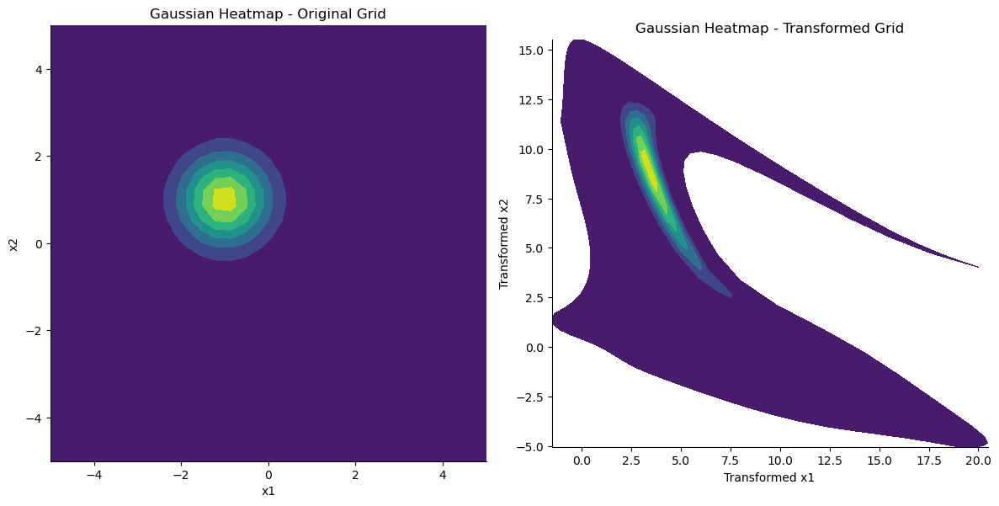

In [19]:
# Combine heatmaps into a two-panel single figure
plt.figure(figsize=(12, 6.5))

# Heatmap of Gaussian function on original grid
plt.subplot(1, 2, 1)
gaussian_original = np.exp(-((X1+1)**2 + (X2-1)**2))
contour1 = plt.contourf(X1, X2, gaussian_original, cmap='viridis')
# plt.colorbar(contour1, label='Gaussian value (Original)')
plt.title('Gaussian Heatmap - Original Grid')
plt.xlabel('x1')
plt.ylabel('x2')
plt.axis("image")

# Heatmap of Gaussian function on transformed grid
plt.subplot(1, 2, 2)
# gaussian_transformed = np.exp(-(X1_transformed**2 + X2_transformed**2))
contour2 = plt.contourf(X1_transformed, X2_transformed, gaussian_original, cmap='viridis')
# plt.colorbar(contour2, label='Gaussian value (Transformed)')
plt.title('Gaussian Heatmap - Transformed Grid')
plt.xlabel('Transformed x1')
plt.ylabel('Transformed x2')
plt.axis("image")

plt.tight_layout()
plt.show()

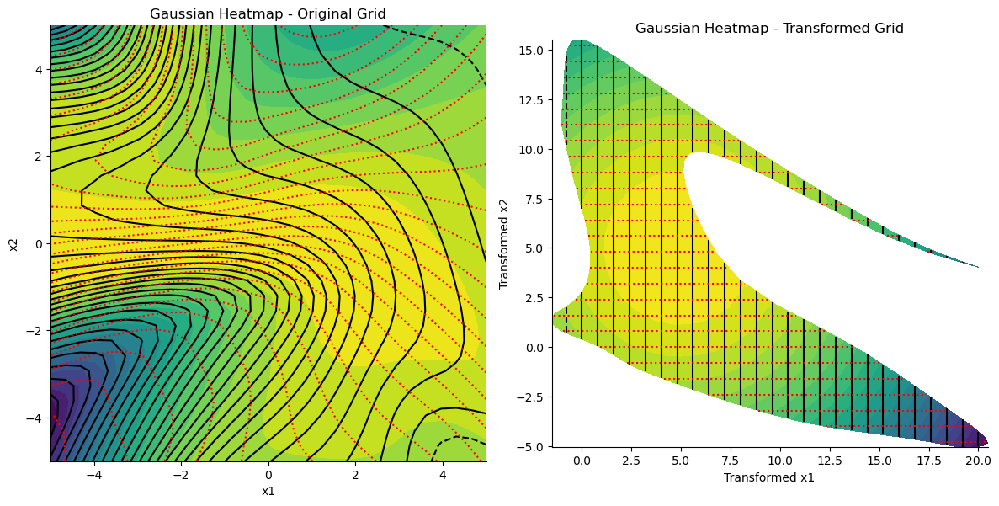

In [31]:
# Combine heatmaps into a two-panel single figure
plt.figure(figsize=(12, 6.5))

# Heatmap of Gaussian function on original grid
plt.subplot(1, 2, 1)
gaussian_transformed = (-((X1_transformed - 5)**2 + (X2_transformed - 5)**2)) # log scale of exp function 
# gaussian_original = np.exp(-((X1+1)**2 + (X2-1)**2))
contour1 = plt.contourf(X1, X2, gaussian_transformed, cmap='viridis', levels=20)
# add contour of the grid 
coord_grid = plt.contour(X1, X2, X1_transformed, levels=30, colors="k")
coord_grid = plt.contour(X1, X2, X2_transformed, levels=30, colors="r", linestyles=":")
# plt.colorbar(contour1, label='Gaussian value (Original)')
plt.title('Gaussian Heatmap - Original Grid')
plt.xlabel('x1')
plt.ylabel('x2')
plt.axis("image")

# Heatmap of Gaussian function on transformed grid
plt.subplot(1, 2, 2)
contour2 = plt.contourf(X1_transformed, X2_transformed, gaussian_transformed, cmap='viridis', levels=30)
coord_grid = plt.contour(X1_transformed, X2_transformed, X1_transformed, levels=30, colors="k")
coord_grid = plt.contour(X1_transformed, X2_transformed, X2_transformed, levels=30, colors="r", linestyles=":")
# plt.colorbar(contour2, label='Gaussian value (Transformed)')
plt.title('Gaussian Heatmap - Transformed Grid')
plt.xlabel('Transformed x1')
plt.ylabel('Transformed x2')
plt.axis("image")

plt.tight_layout()
plt.show()

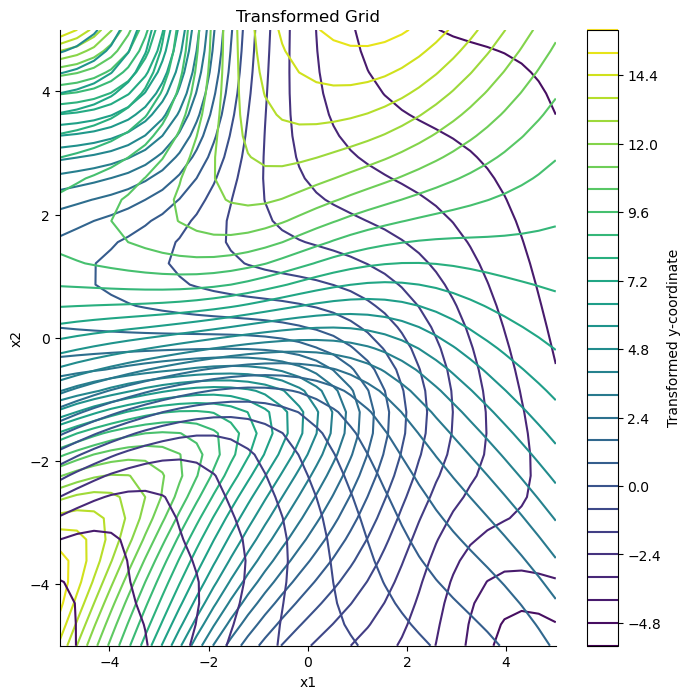

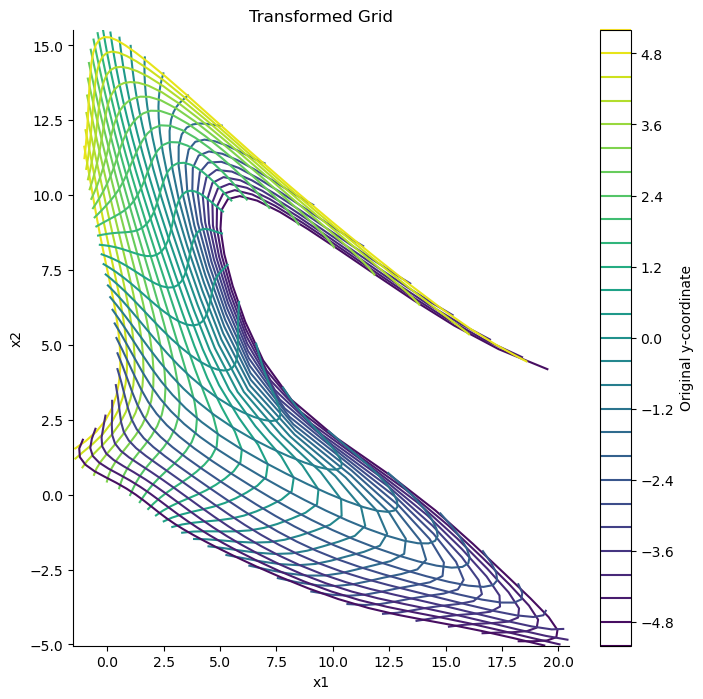

In [12]:
# show the transformed grid
plt.figure(figsize=(8, 8))
plt.contour(X1, X2, X1_transformed, levels=30, cmap='viridis')
plt.contour(X1, X2, X2_transformed, levels=30, cmap='viridis')
plt.colorbar(label='Transformed y-coordinate')
plt.title('Transformed Grid')
plt.xlabel('x1')
plt.ylabel('x2')
plt.show()

plt.figure(figsize=(8, 8))
plt.contour(X1_transformed, X2_transformed, X1, levels=30, cmap='viridis')
plt.contour(X1_transformed, X2_transformed, X2, levels=30, cmap='viridis')
plt.colorbar(label='Original y-coordinate')
plt.title('Transformed Grid')
plt.xlabel('x1')
plt.ylabel('x2')
plt.show()

In [91]:
torch.manual_seed(39) # 43
dim = 2
# Instantiate a single coupling layer
realnvp = RealNVPND_stack(dim=dim, hidden_dim=24, stack_size=16, linear_type="orthogonal", stabilized=True, dtype=torch.float64) # _shift
# Create a regular 2D grid
x_min, x_max = -5, 5
n_points = 30
x1 = torch.linspace(x_min, x_max, n_points)
x2 = torch.linspace(x_min, x_max, n_points)
X1, X2 = torch.meshgrid(x1, x2, indexing='ij')
x = torch.stack([X1.flatten(), X2.flatten()], dim=1).to(torch.float64)
# Forward pass
with torch.no_grad():
    x_inverted, log_det_inv = realnvp(x, reverse=True)
print("Forward transformed shape:", x_inverted.shape)
print("log_det_fwd shape:", log_det_inv.shape, "\n")

# Inverse pass to verify invertibility
with torch.no_grad():
    x_forward, log_det_fwd = realnvp(x_inverted, reverse=False)
print("Max reconstruction error:", torch.max(torch.abs(x - x_forward)).item())

# Reshape results back to grid for visualization
X1_transformed = x_inverted[:, 0].reshape(n_points, n_points).detach().numpy()
X2_transformed = x_inverted[:, 1].reshape(n_points, n_points).detach().numpy()

Forward transformed shape: torch.Size([900, 2])
log_det_fwd shape: torch.Size([900]) 

Max reconstruction error: 2.1671553440683056e-13


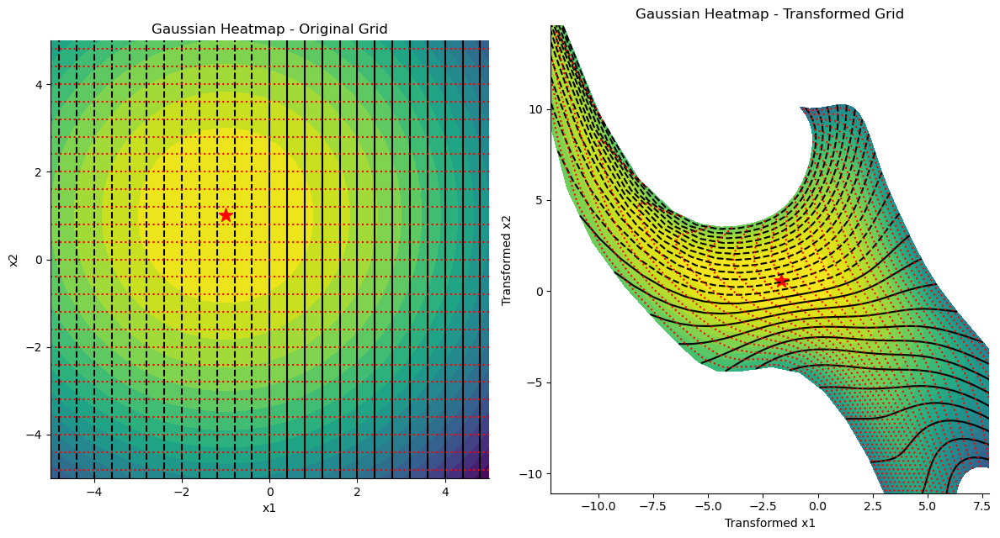

In [94]:
# Combine heatmaps into a two-panel single figure
plt.figure(figsize=(12, 6.5))
# Heatmap of Gaussian function on original grid
plt.subplot(1, 2, 1)
gaussian_original = (-((X1+1)**2 + (X2-1)**2)) # np.exp
contour1 = plt.contourf(X1, X2, gaussian_original, cmap='viridis', levels=20)
# add contour of the grid 1
coord_grid = plt.contour(X1, X2, X1, levels=30, colors="k")
coord_grid = plt.contour(X1, X2, X2, levels=30, colors="r", linestyles=":")
# Mark the optimum with a star
plt.scatter(-1, 1, color='red', marker='*', s=150, label='Optimum')
plt.title('Gaussian Heatmap - Original Grid')
plt.xlabel('x1')
plt.ylabel('x2')
plt.axis("image")

# Heatmap of Gaussian function on transformed grid
plt.subplot(1, 2, 2)
contour2 = plt.contourf(X1_transformed, X2_transformed, gaussian_original, cmap='viridis', levels=30)
coord_grid = plt.contour(X1_transformed, X2_transformed, X1, levels=30, colors="k")
coord_grid = plt.contour(X1_transformed, X2_transformed, X2, levels=30, colors="r", linestyles=":")
# Mark the transformed optimum with a star
transformed_optimum_x = X1_transformed.flatten()[np.argmax(gaussian_original)]
transformed_optimum_y = X2_transformed.flatten()[np.argmax(gaussian_original)]
plt.scatter(transformed_optimum_x, transformed_optimum_y, color='red', marker='*', s=150, label='Transformed Optimum')
# set xlim by quantile
XLIM = np.quantile(X1_transformed.flatten(), [0.05,0.95])
YLIM = np.quantile(X2_transformed.flatten(), [0.05,0.95])
plt.xlim(XLIM)
plt.ylim(YLIM)
plt.title('Gaussian Heatmap - Transformed Grid')
plt.xlabel('Transformed x1')
plt.ylabel('Transformed x2')
plt.tight_layout()
plt.show()

In [62]:
np.quantile(X2_transformed.flatten(), [0.05,0.95])

array([-105.38941912,    4.10258307])

### Plot the Gaussian transformed through layers

Forward transformed shape: torch.Size([900, 2])
log_det_fwd shape: torch.Size([900])
max log det 0.0 min log det 0.0 

Max reconstruction error: 0.0


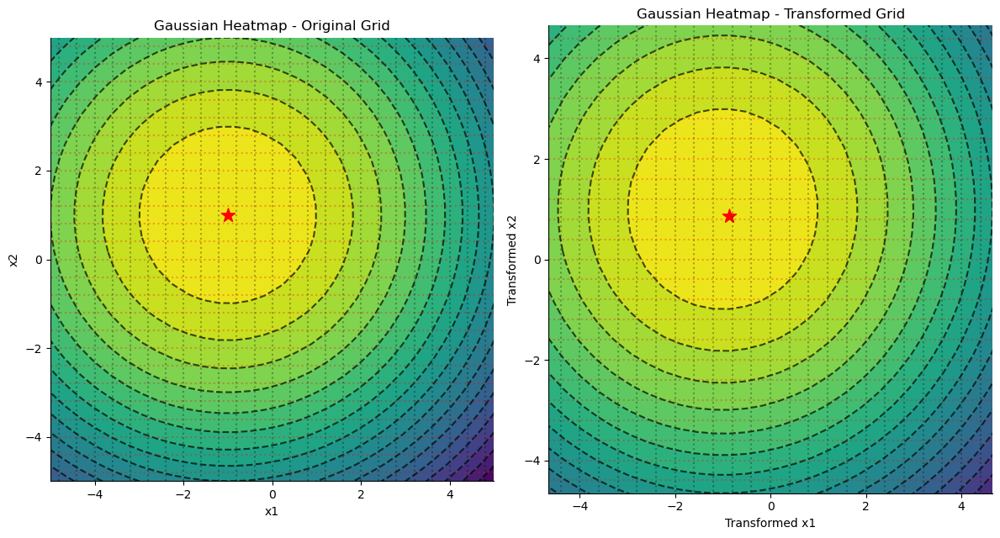

Forward transformed shape: torch.Size([900, 2])
log_det_fwd shape: torch.Size([900])
max log det 1.2818068265914917 min log det -0.7166450023651123 

Max reconstruction error: 1.1546319456101628e-14


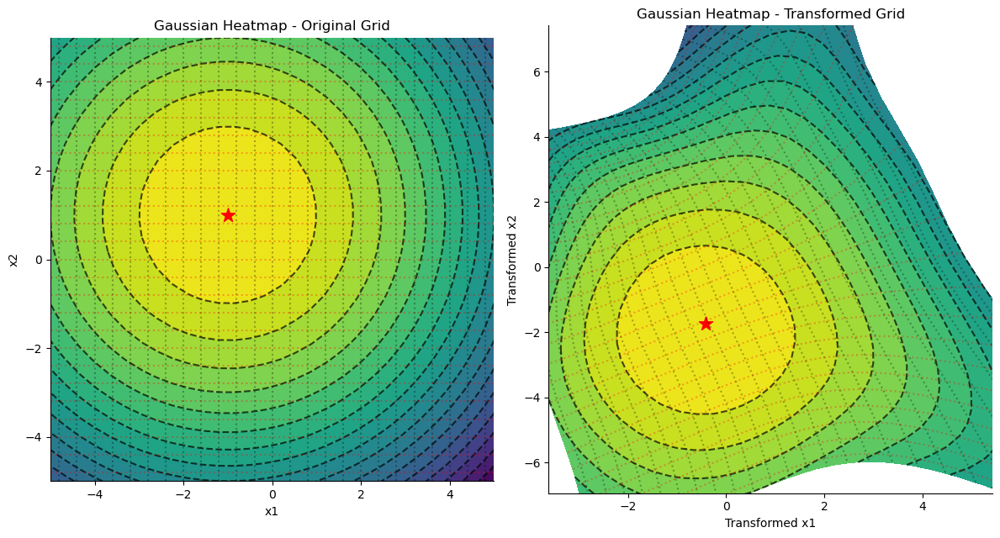

Forward transformed shape: torch.Size([900, 2])
log_det_fwd shape: torch.Size([900])
max log det 2.4311254024505615 min log det -0.8454126119613647 

Max reconstruction error: 2.398081733190338e-14


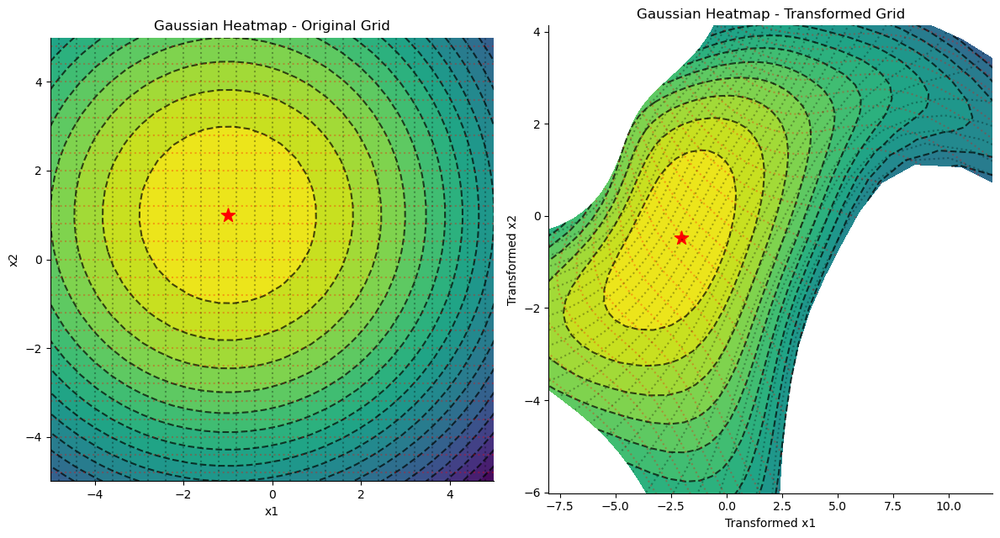

Forward transformed shape: torch.Size([900, 2])
log_det_fwd shape: torch.Size([900])
max log det 1.7761527299880981 min log det -0.8603321313858032 

Max reconstruction error: 1.7852386235972517e-13


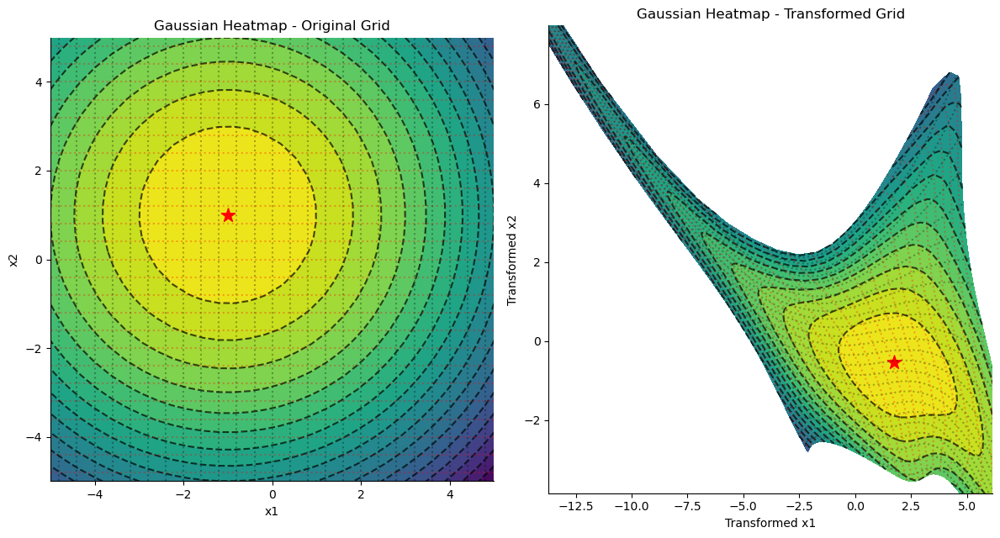

Forward transformed shape: torch.Size([900, 2])
log_det_fwd shape: torch.Size([900])
max log det 1.0090914964675903 min log det -1.3871850967407227 

Max reconstruction error: 1.5010215292932116e-13


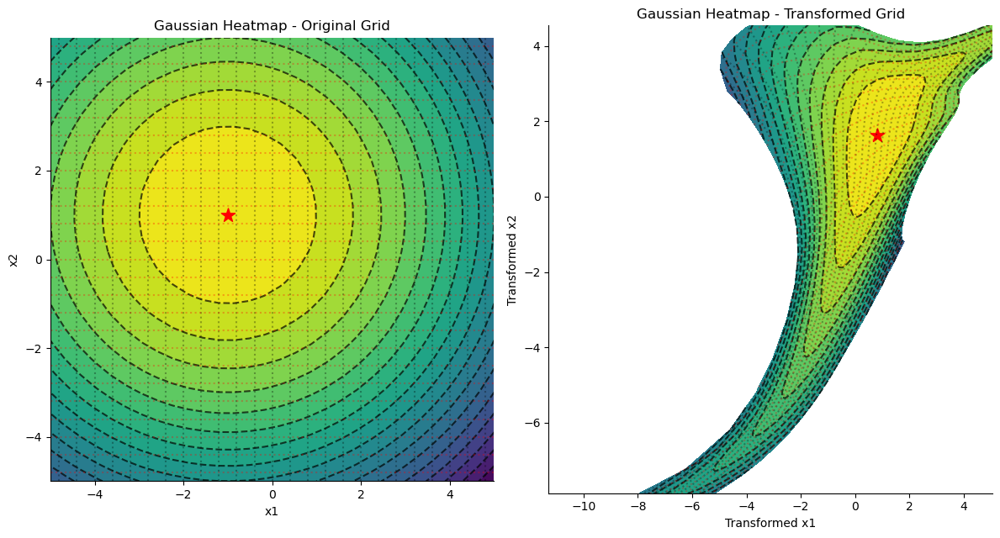

Forward transformed shape: torch.Size([900, 2])
log_det_fwd shape: torch.Size([900])
max log det 0.16807802021503448 min log det -3.4701926708221436 

Max reconstruction error: 4.627409566637652e-13


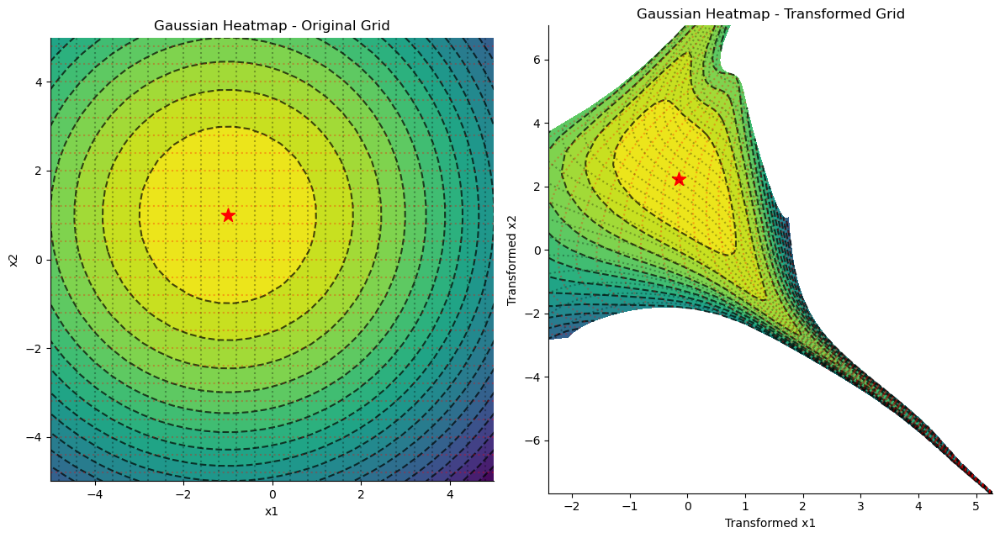

Forward transformed shape: torch.Size([900, 2])
log_det_fwd shape: torch.Size([900])
max log det 0.3666251301765442 min log det -2.905653476715088 

Max reconstruction error: 4.289901767151605e-13


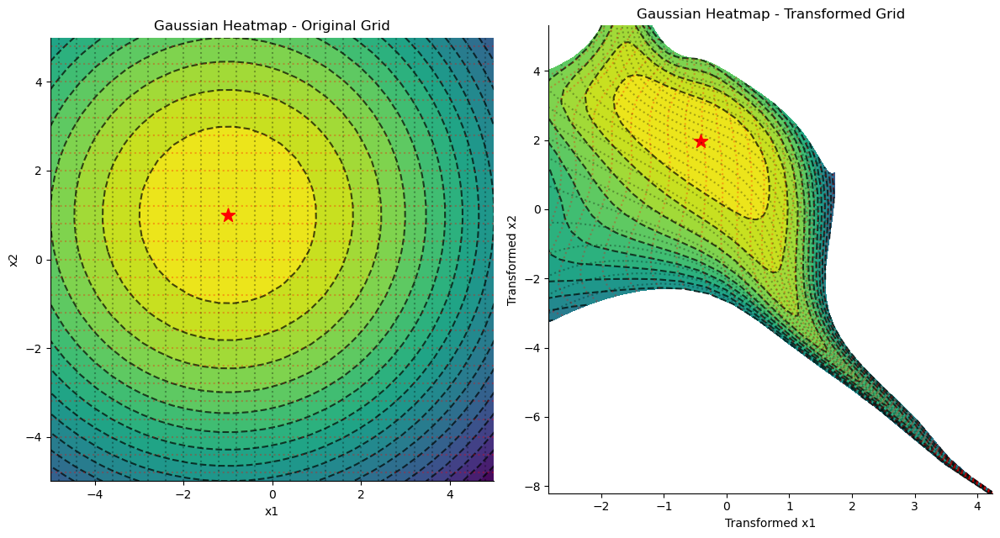

Forward transformed shape: torch.Size([900, 2])
log_det_fwd shape: torch.Size([900])
max log det 0.27965080738067627 min log det -3.9780123233795166 

Max reconstruction error: 5.719869022868806e-13


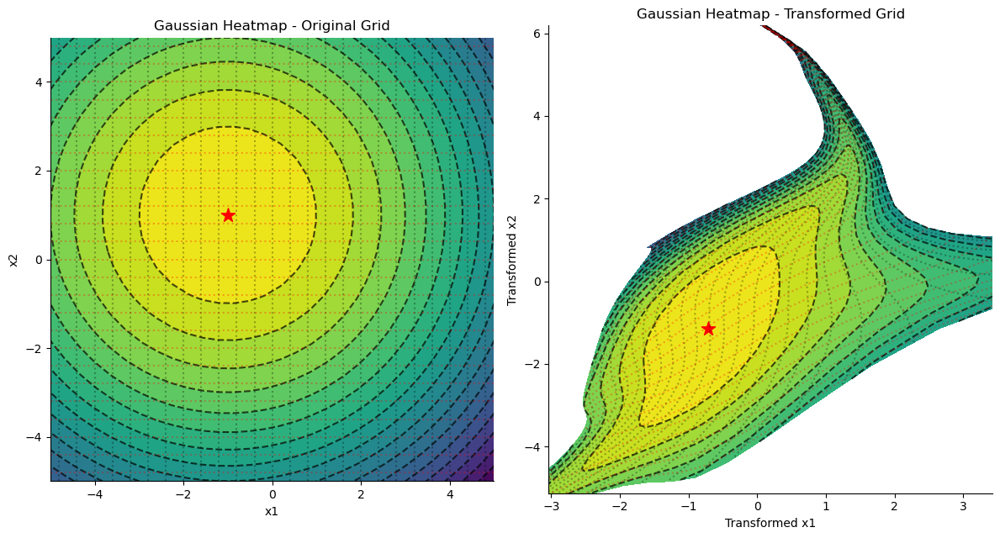

Forward transformed shape: torch.Size([900, 2])
log_det_fwd shape: torch.Size([900])
max log det 0.6804558634757996 min log det -4.8592119216918945 

Max reconstruction error: 5.266898028821743e-13


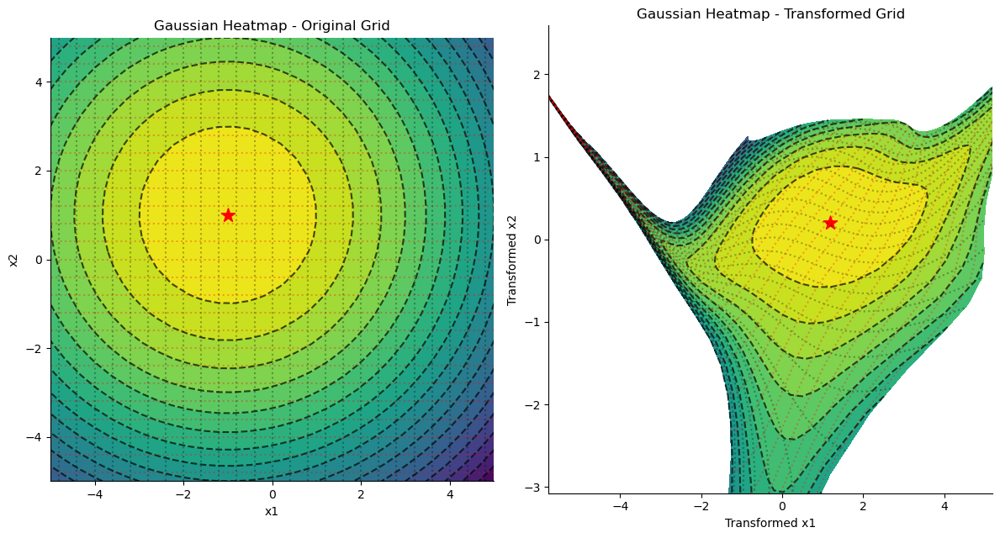

In [107]:
dim = 2
# Instantiate a single coupling layer
torch.manual_seed(42)
# realnvp = RealNVPND_stack(dim=dim, hidden_dim=12, stack_size=24, linear_type="orthogonal", stabilized=True, dtype=torch.float64)
realnvp = RealNVPND_stack(dim=dim, hidden_dim=24, stack_size=32, linear_type="orthogonal", stabilized=True, dtype=torch.float64)

x_min, x_max = -5, 5
n_points = 30
x1 = torch.linspace(x_min, x_max, n_points)
x2 = torch.linspace(x_min, x_max, n_points)
X1, X2 = torch.meshgrid(x1, x2, indexing='ij')
x = torch.stack([X1.flatten(), X2.flatten()], dim=1).to(torch.float64)

for stop_layer in range(0, 32+1, 4):
    with torch.no_grad():
        x_forward, log_det_fwd = realnvp(x, reverse=False, early_stop_layer=stop_layer)
    print("Forward transformed shape:", x_forward.shape)
    print("log_det_fwd shape:", log_det_fwd.shape,)
    print("max log det", log_det_fwd.max().item(), "min log det", log_det_fwd.min().item(), "\n")

    # Inverse pass to verify invertibility
    with torch.no_grad():
        x_inverted, log_det_inv = realnvp(x_forward, reverse=True, early_stop_layer=stop_layer)
    print("Max reconstruction error:", torch.max(torch.abs(x - x_inverted)).item())

    # Reshape results back to grid for visualization
    X1_transformed = x_forward[:, 0].reshape(n_points, n_points).detach().numpy()
    X2_transformed = x_forward[:, 1].reshape(n_points, n_points).detach().numpy()

    # Combine heatmaps into a two-panel single figure
    plt.figure(figsize=(12, 6.5))
    # Heatmap of Gaussian function on original grid
    plt.subplot(1, 2, 1)
    gaussian_original = (-((X1+1)**2 + (X2-1)**2))#.exp() # np.exp
    contour1 = plt.contourf(X1, X2, gaussian_original, cmap='viridis', levels=20)
    contour_lines = plt.contour(X1, X2, gaussian_original, colors="k", levels=20, alpha=0.7)
    # add contour of the grid 1
    coord_grid = plt.contour(X1, X2, X1, levels=30, colors="k", linestyles=":", alpha=0.3)
    coord_grid = plt.contour(X1, X2, X2, levels=30, colors="r", linestyles=":", alpha=0.3)
    # Mark the optimum with a star
    plt.scatter(-1, 1, color='red', marker='*', s=150, label='Optimum')
    plt.title('Gaussian Heatmap - Original Grid')
    plt.xlabel('x1')
    plt.ylabel('x2')
    plt.axis("image")

    # Heatmap of Gaussian function on transformed grid
    plt.subplot(1, 2, 2)
    contour2 = plt.contourf(X1_transformed, X2_transformed, gaussian_original, cmap='viridis', levels=20)
    contour_lines = plt.contour(X1_transformed, X2_transformed, gaussian_original, colors='black', levels=20, alpha=0.7)
    # plt.clabel(contour_lines, inline=True, fontsize=8)
    coord_grid = plt.contour(X1_transformed, X2_transformed, X1, levels=30, colors="k", linestyles=":", alpha=0.3)
    coord_grid = plt.contour(X1_transformed, X2_transformed, X2, levels=30, colors="r", linestyles=":", alpha=0.3)
    # Mark the transformed optimum with a star
    transformed_optimum_x = X1_transformed.flatten()[np.argmax(gaussian_original)]
    transformed_optimum_y = X2_transformed.flatten()[np.argmax(gaussian_original)]
    plt.scatter(transformed_optimum_x, transformed_optimum_y, color='red', marker='*', s=150, label='Transformed Optimum')
    # set xlim by quantile
    XLIM = np.quantile(X1_transformed.flatten(), [0.05,0.95])
    YLIM = np.quantile(X2_transformed.flatten(), [0.05,0.95])
    plt.xlim(XLIM)
    plt.ylim(YLIM)
    plt.title('Gaussian Heatmap - Transformed Grid')
    plt.xlabel('Transformed x1')
    plt.ylabel('Transformed x2')
    plt.tight_layout()
    plt.show()

In [108]:
from circuit_toolkit.plot_utils import saveallforms

Forward transformed shape: torch.Size([900, 2])
log_det_fwd shape: torch.Size([900])
max log det 0.0 min log det 0.0 

Max reconstruction error: 0.0


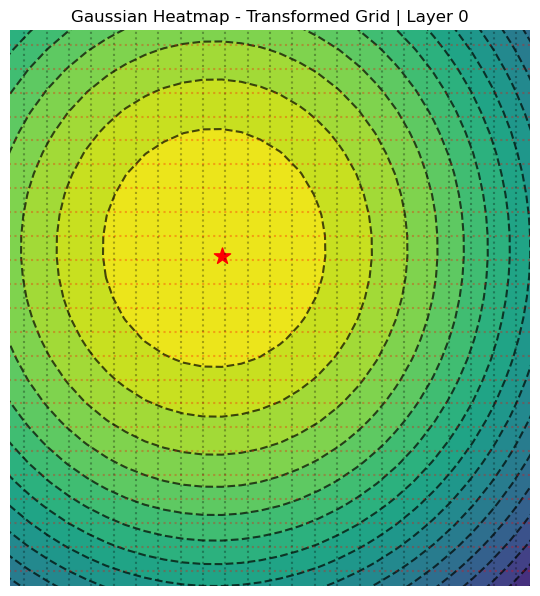

Forward transformed shape: torch.Size([900, 2])
log_det_fwd shape: torch.Size([900])
max log det 1.2818068265914917 min log det -0.7166450023651123 

Max reconstruction error: 1.1546319456101628e-14


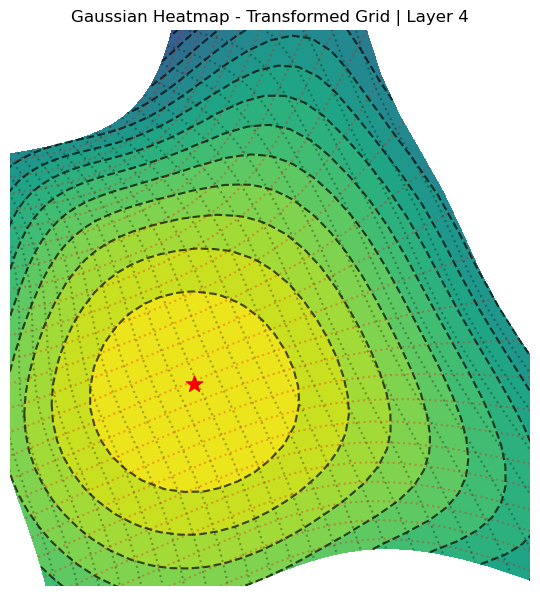

Forward transformed shape: torch.Size([900, 2])
log_det_fwd shape: torch.Size([900])
max log det 2.4311254024505615 min log det -0.8454126119613647 

Max reconstruction error: 2.398081733190338e-14


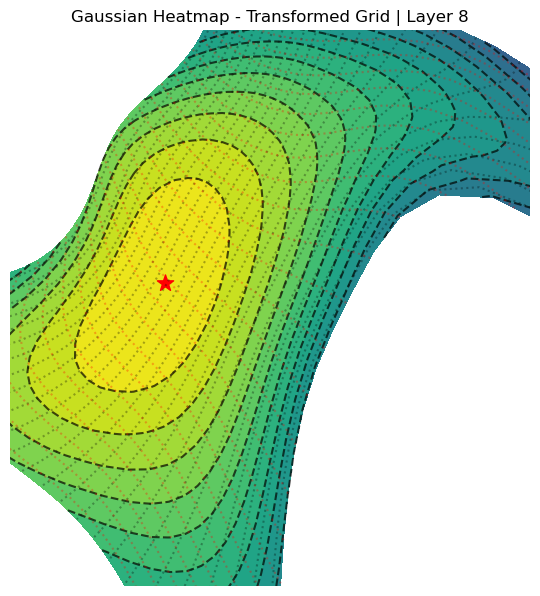

Forward transformed shape: torch.Size([900, 2])
log_det_fwd shape: torch.Size([900])
max log det 1.7761527299880981 min log det -0.8603321313858032 

Max reconstruction error: 1.7852386235972517e-13


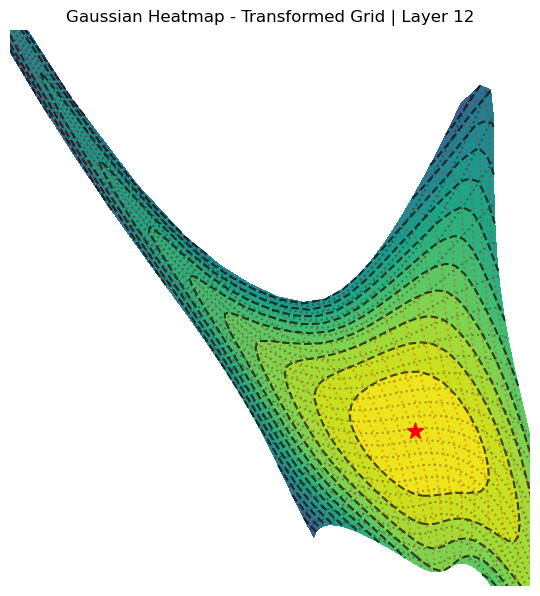

Forward transformed shape: torch.Size([900, 2])
log_det_fwd shape: torch.Size([900])
max log det 1.0090914964675903 min log det -1.3871850967407227 

Max reconstruction error: 1.5010215292932116e-13


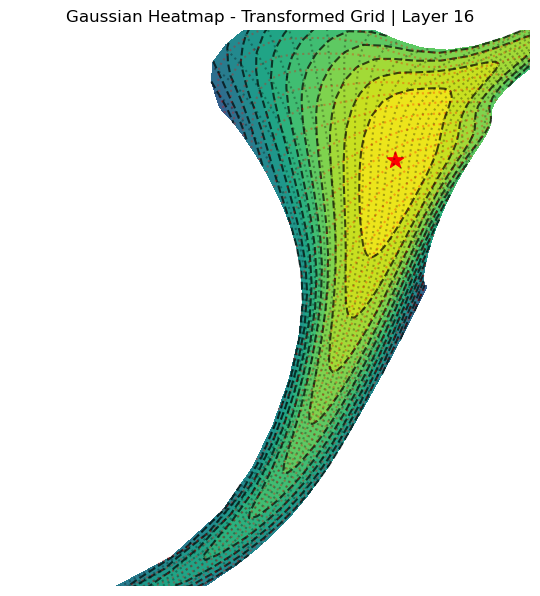

Forward transformed shape: torch.Size([900, 2])
log_det_fwd shape: torch.Size([900])
max log det 0.16807802021503448 min log det -3.4701926708221436 

Max reconstruction error: 4.627409566637652e-13


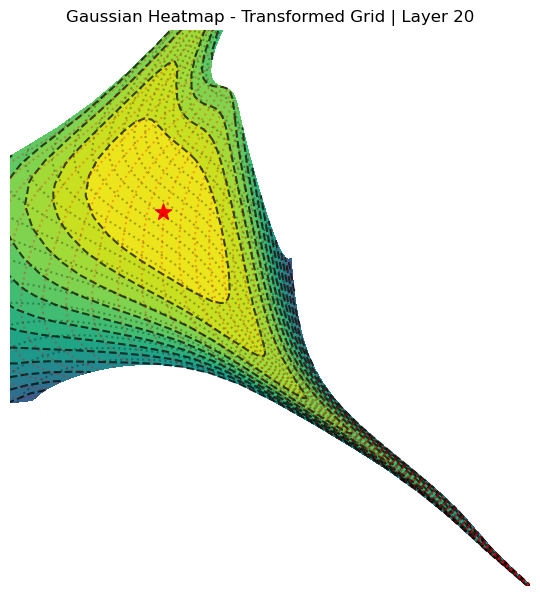

Forward transformed shape: torch.Size([900, 2])
log_det_fwd shape: torch.Size([900])
max log det 0.3666251301765442 min log det -2.905653476715088 

Max reconstruction error: 4.289901767151605e-13


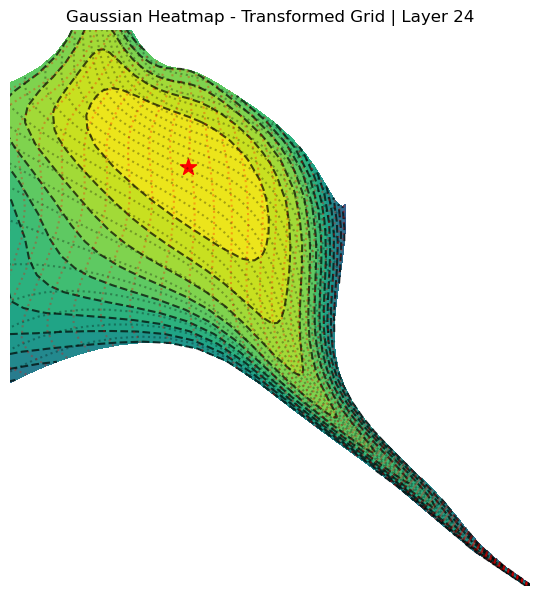

Forward transformed shape: torch.Size([900, 2])
log_det_fwd shape: torch.Size([900])
max log det 0.27965080738067627 min log det -3.9780123233795166 

Max reconstruction error: 5.719869022868806e-13


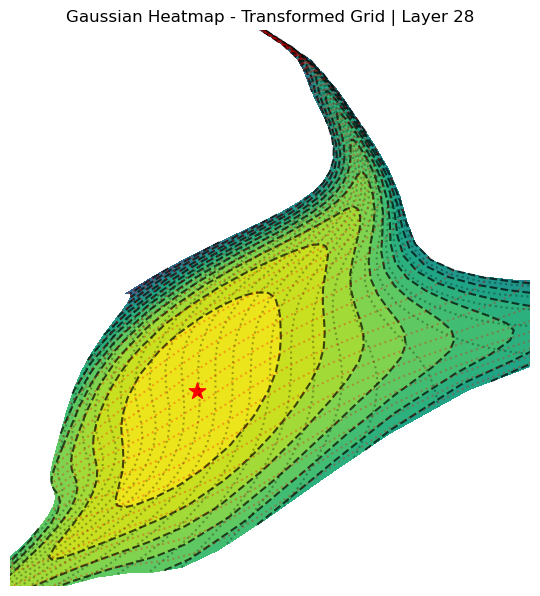

Forward transformed shape: torch.Size([900, 2])
log_det_fwd shape: torch.Size([900])
max log det 0.6804558634757996 min log det -4.8592119216918945 

Max reconstruction error: 5.266898028821743e-13


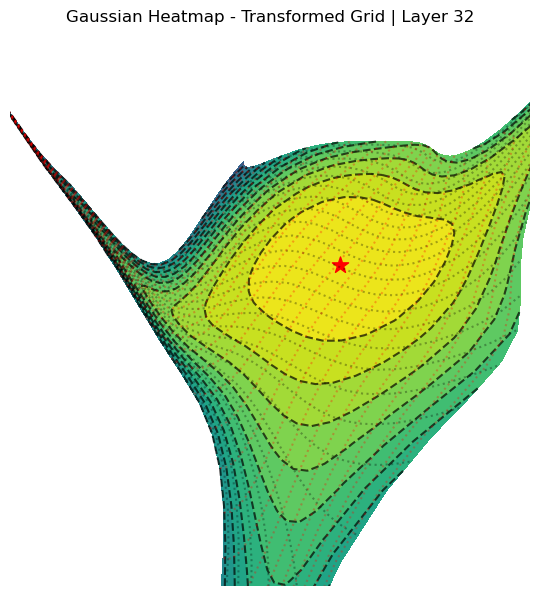

In [110]:
savedir = r"E:\OneDrive - Harvard University\Manuscript_BigGAN\Figures\Figure_rebuttal_toy_alignment\src"
dim = 2
# Instantiate a single coupling layer
torch.manual_seed(42)
# realnvp = RealNVPND_stack(dim=dim, hidden_dim=12, stack_size=24, linear_type="orthogonal", stabilized=True, dtype=torch.float64)
realnvp = RealNVPND_stack(dim=dim, hidden_dim=24, stack_size=32, linear_type="orthogonal", stabilized=True, dtype=torch.float64)

x_min, x_max = -5, 5
n_points = 30
x1 = torch.linspace(x_min, x_max, n_points)
x2 = torch.linspace(x_min, x_max, n_points)
X1, X2 = torch.meshgrid(x1, x2, indexing='ij')
x = torch.stack([X1.flatten(), X2.flatten()], dim=1).to(torch.float64)

for stop_layer in range(0, 32+1, 4):
    with torch.no_grad():
        x_forward, log_det_fwd = realnvp(x, reverse=False, early_stop_layer=stop_layer)
    print("Forward transformed shape:", x_forward.shape)
    print("log_det_fwd shape:", log_det_fwd.shape,)
    print("max log det", log_det_fwd.max().item(), "min log det", log_det_fwd.min().item(), "\n")

    # Inverse pass to verify invertibility
    with torch.no_grad():
        x_inverted, log_det_inv = realnvp(x_forward, reverse=True, early_stop_layer=stop_layer)
    print("Max reconstruction error:", torch.max(torch.abs(x - x_inverted)).item())

    # Reshape results back to grid for visualization
    X1_transformed = x_forward[:, 0].reshape(n_points, n_points).detach().numpy()
    X2_transformed = x_forward[:, 1].reshape(n_points, n_points).detach().numpy()

    plt.figure(figsize=(6, 6.5))
    gaussian_original = (-((X1+1)**2 + (X2-1)**2))#.exp() # np.exp
    # Heatmap of Gaussian function on transformed grid
    # plt.subplot(1, 2, 2)
    contour2 = plt.contourf(X1_transformed, X2_transformed, gaussian_original, cmap='viridis', levels=20)
    contour_lines = plt.contour(X1_transformed, X2_transformed, gaussian_original, colors='black', levels=20, alpha=0.7)
    # plt.clabel(contour_lines, inline=True, fontsize=8)
    coord_grid = plt.contour(X1_transformed, X2_transformed, X1, levels=30, colors="k", linestyles=":", alpha=0.3)
    coord_grid = plt.contour(X1_transformed, X2_transformed, X2, levels=30, colors="r", linestyles=":", alpha=0.3)
    # Mark the transformed optimum with a star
    transformed_optimum_x = X1_transformed.flatten()[np.argmax(gaussian_original)]
    transformed_optimum_y = X2_transformed.flatten()[np.argmax(gaussian_original)]
    plt.scatter(transformed_optimum_x, transformed_optimum_y, color='red', marker='*', s=150, label='Transformed Optimum')
    # set xlim by quantile
    XLIM = np.quantile(X1_transformed.flatten(), [0.05,0.95])
    YLIM = np.quantile(X2_transformed.flatten(), [0.05,0.95])
    plt.xlim(XLIM)
    plt.ylim(YLIM)
    plt.title(f'Gaussian Heatmap - Transformed Grid | Layer {stop_layer}')
    plt.xlabel('Transformed x1')
    plt.ylabel('Transformed x2')
    plt.tight_layout()
    saveallforms(savedir, f"Gaussian_tuning_transformed_at_layer{stop_layer}")
    plt.axis("off")
    saveallforms(savedir, f"Gaussian_tuning_transformed_at_layer{stop_layer}_noaxis")
    plt.show()

Forward transformed shape: torch.Size([900, 2])
log_det_fwd shape: torch.Size([900])
max log det 0.0 min log det 0.0 

Max reconstruction error: 0.0


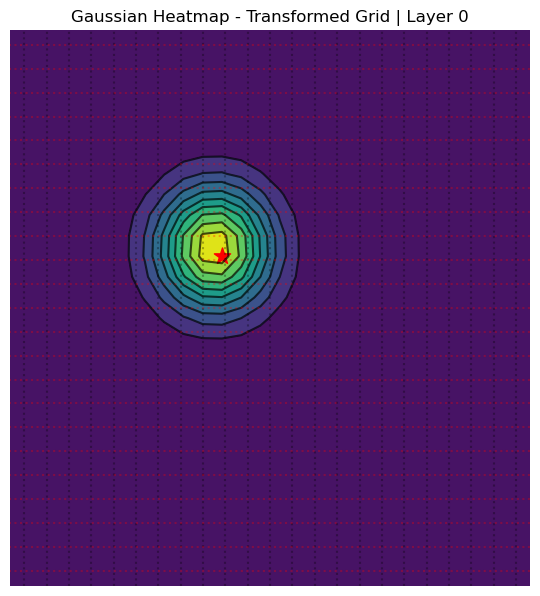

Forward transformed shape: torch.Size([900, 2])
log_det_fwd shape: torch.Size([900])
max log det 1.2818068265914917 min log det -0.7166450023651123 

Max reconstruction error: 1.1546319456101628e-14


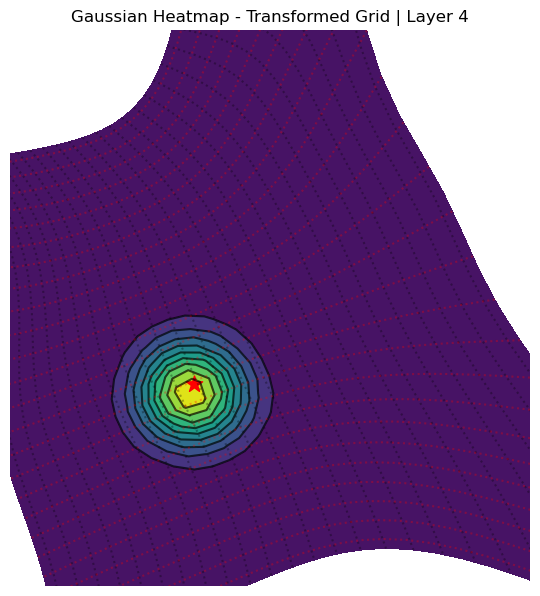

Forward transformed shape: torch.Size([900, 2])
log_det_fwd shape: torch.Size([900])
max log det 2.4311254024505615 min log det -0.8454126119613647 

Max reconstruction error: 2.398081733190338e-14


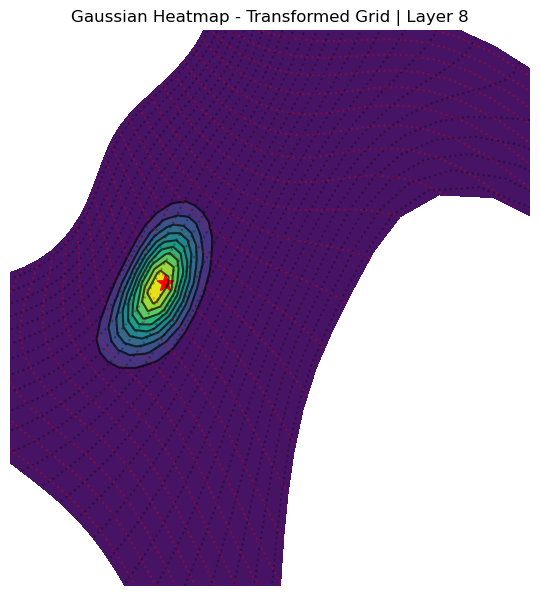

Forward transformed shape: torch.Size([900, 2])
log_det_fwd shape: torch.Size([900])
max log det 1.7761527299880981 min log det -0.8603321313858032 

Max reconstruction error: 1.7852386235972517e-13


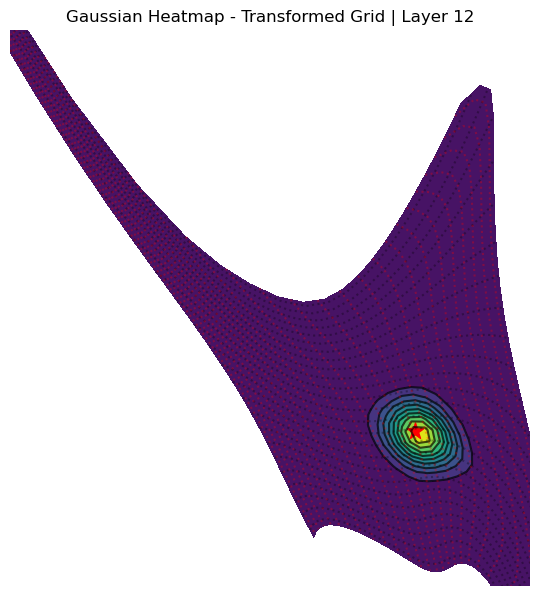

Forward transformed shape: torch.Size([900, 2])
log_det_fwd shape: torch.Size([900])
max log det 1.0090914964675903 min log det -1.3871850967407227 

Max reconstruction error: 1.5010215292932116e-13


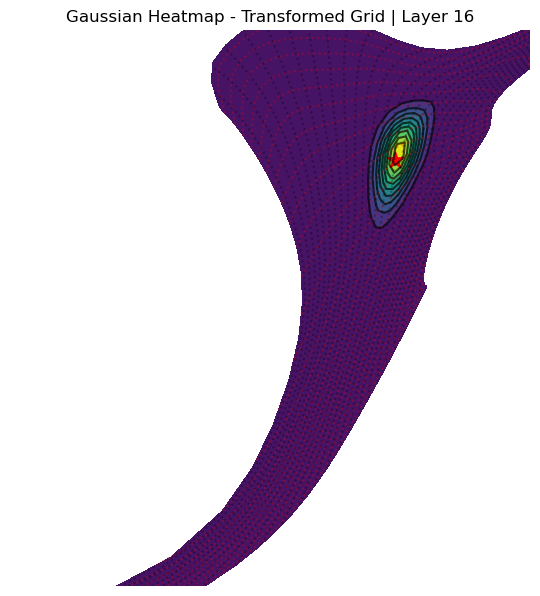

Forward transformed shape: torch.Size([900, 2])
log_det_fwd shape: torch.Size([900])
max log det 0.16807802021503448 min log det -3.4701926708221436 

Max reconstruction error: 4.627409566637652e-13


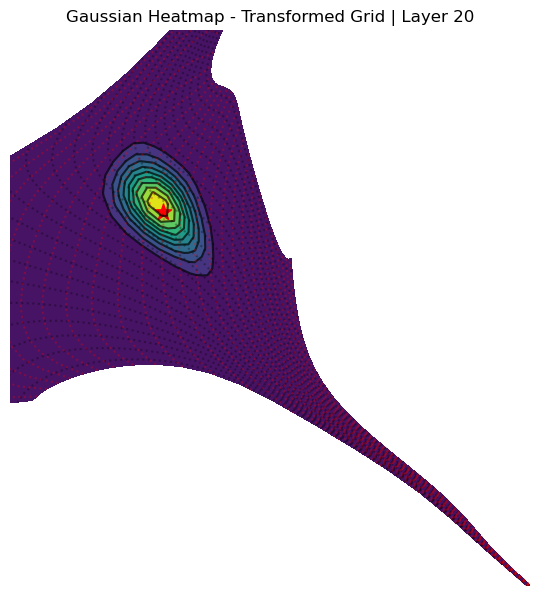

Forward transformed shape: torch.Size([900, 2])
log_det_fwd shape: torch.Size([900])
max log det 0.3666251301765442 min log det -2.905653476715088 

Max reconstruction error: 4.289901767151605e-13


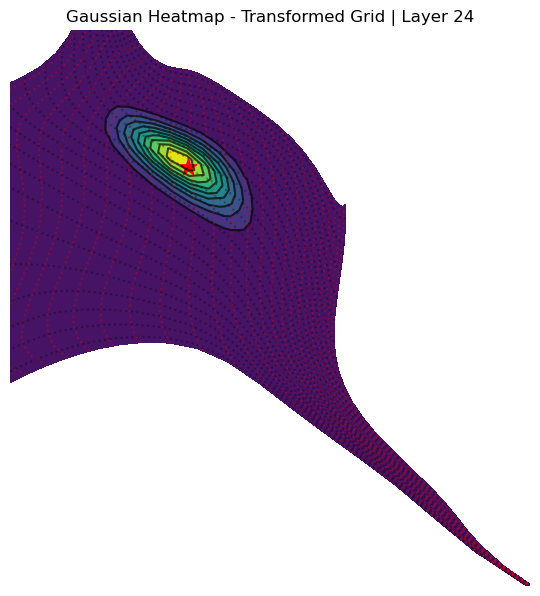

Forward transformed shape: torch.Size([900, 2])
log_det_fwd shape: torch.Size([900])
max log det 0.27965080738067627 min log det -3.9780123233795166 

Max reconstruction error: 5.719869022868806e-13


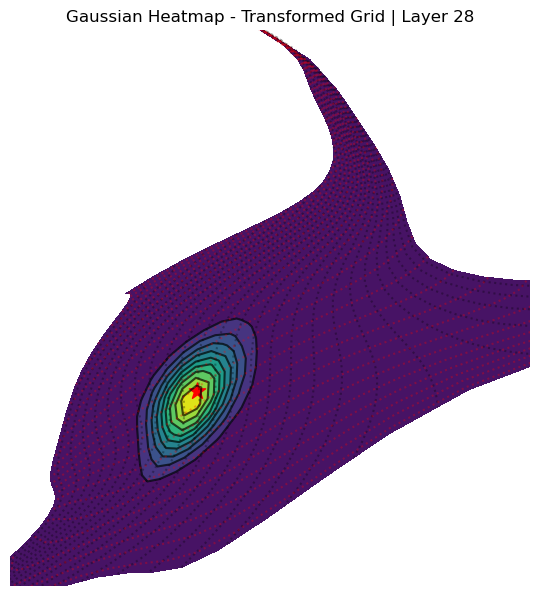

Forward transformed shape: torch.Size([900, 2])
log_det_fwd shape: torch.Size([900])
max log det 0.6804558634757996 min log det -4.8592119216918945 

Max reconstruction error: 5.266898028821743e-13


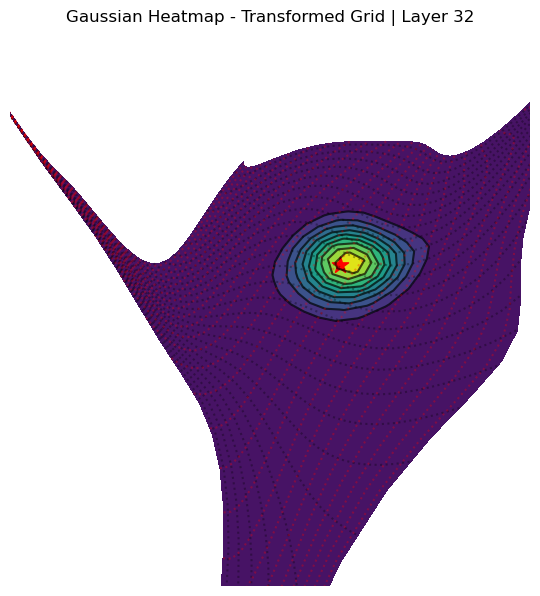

In [112]:
savedir = r"E:\OneDrive - Harvard University\Manuscript_BigGAN\Figures\Figure_rebuttal_toy_alignment\src"
dim = 2
# Instantiate a single coupling layer
torch.manual_seed(42)
# realnvp = RealNVPND_stack(dim=dim, hidden_dim=12, stack_size=24, linear_type="orthogonal", stabilized=True, dtype=torch.float64)
realnvp = RealNVPND_stack(dim=dim, hidden_dim=24, stack_size=32, linear_type="orthogonal", stabilized=True, dtype=torch.float64)

x_min, x_max = -5, 5
n_points = 30
x1 = torch.linspace(x_min, x_max, n_points)
x2 = torch.linspace(x_min, x_max, n_points)
X1, X2 = torch.meshgrid(x1, x2, indexing='ij')
x = torch.stack([X1.flatten(), X2.flatten()], dim=1).to(torch.float64)

for stop_layer in range(0, 32+1, 4):
    with torch.no_grad():
        x_forward, log_det_fwd = realnvp(x, reverse=False, early_stop_layer=stop_layer)
    print("Forward transformed shape:", x_forward.shape)
    print("log_det_fwd shape:", log_det_fwd.shape,)
    print("max log det", log_det_fwd.max().item(), "min log det", log_det_fwd.min().item(), "\n")

    # Inverse pass to verify invertibility
    with torch.no_grad():
        x_inverted, log_det_inv = realnvp(x_forward, reverse=True, early_stop_layer=stop_layer)
    print("Max reconstruction error:", torch.max(torch.abs(x - x_inverted)).item())

    # Reshape results back to grid for visualization
    X1_transformed = x_forward[:, 0].reshape(n_points, n_points).detach().numpy()
    X2_transformed = x_forward[:, 1].reshape(n_points, n_points).detach().numpy()

    plt.figure(figsize=(6, 6.5))
    gaussian_original = (-((X1+1)**2 + (X2-1)**2)).exp()# # np.exp
    # Heatmap of Gaussian function on transformed grid
    # plt.subplot(1, 2, 2)
    contour2 = plt.contourf(X1_transformed, X2_transformed, gaussian_original, cmap='viridis', levels=10)
    contour_lines = plt.contour(X1_transformed, X2_transformed, gaussian_original, colors='black', levels=10, alpha=0.7)
    # plt.clabel(contour_lines, inline=True, fontsize=8)
    coord_grid = plt.contour(X1_transformed, X2_transformed, X1, levels=30, colors="k", linestyles=":", alpha=0.3)
    coord_grid = plt.contour(X1_transformed, X2_transformed, X2, levels=30, colors="r", linestyles=":", alpha=0.3)
    # Mark the transformed optimum with a star
    transformed_optimum_x = X1_transformed.flatten()[np.argmax(gaussian_original)]
    transformed_optimum_y = X2_transformed.flatten()[np.argmax(gaussian_original)]
    plt.scatter(transformed_optimum_x, transformed_optimum_y, color='red', marker='*', s=150, label='Transformed Optimum')
    # set xlim by quantile
    XLIM = np.quantile(X1_transformed.flatten(), [0.05,0.95])
    YLIM = np.quantile(X2_transformed.flatten(), [0.05,0.95])
    plt.xlim(XLIM)
    plt.ylim(YLIM)
    plt.title(f'Gaussian Heatmap - Transformed Grid | Layer {stop_layer}')
    plt.xlabel('Transformed x1')
    plt.ylabel('Transformed x2')
    plt.tight_layout()
    saveallforms(savedir, f"Gaussian_tuning_transformed_exp_at_layer{stop_layer}")
    plt.axis("off")
    saveallforms(savedir, f"Gaussian_tuning_transformed_exp_at_layer{stop_layer}_noaxis")
    plt.show()

### Plot the transformed grid across layers of the realnvp

Forward transformed shape: torch.Size([900, 2])
log_det_fwd shape: torch.Size([900])
max log det 0.0 min log det 0.0 

Max reconstruction error: 0.0


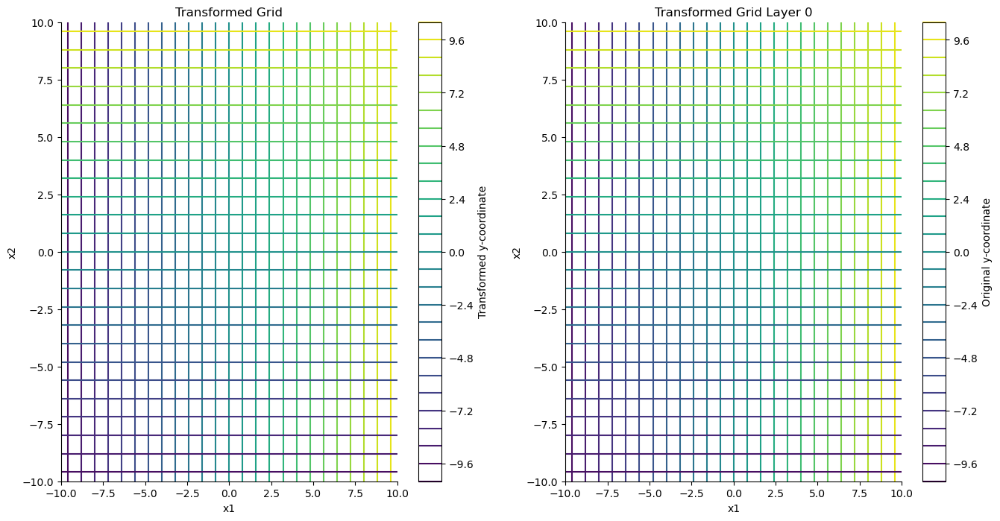

Forward transformed shape: torch.Size([900, 2])
log_det_fwd shape: torch.Size([900])
max log det 1.3844367265701294 min log det -0.6494178175926208 

Max reconstruction error: 8.881784197001252e-15


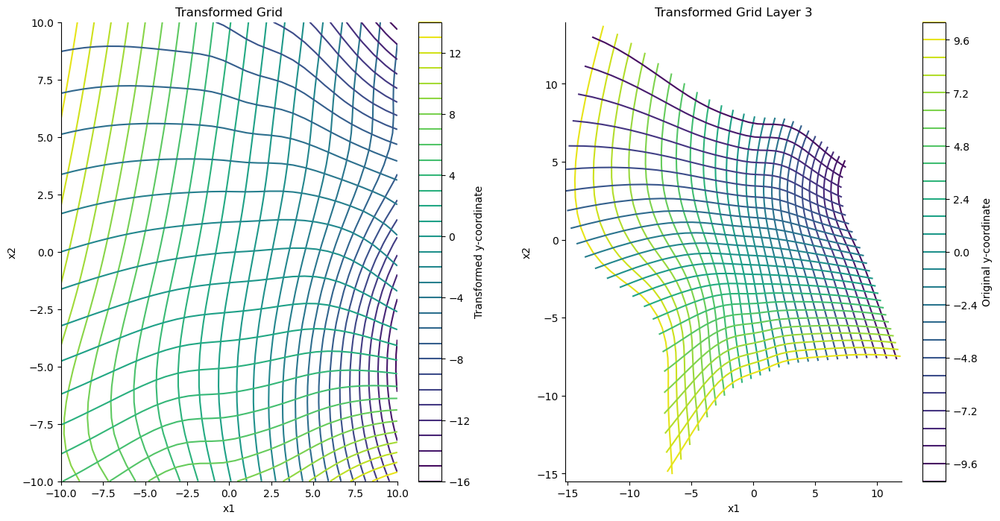

Forward transformed shape: torch.Size([900, 2])
log_det_fwd shape: torch.Size([900])
max log det 1.4902472496032715 min log det -2.8589816093444824 

Max reconstruction error: 3.375077994860476e-14


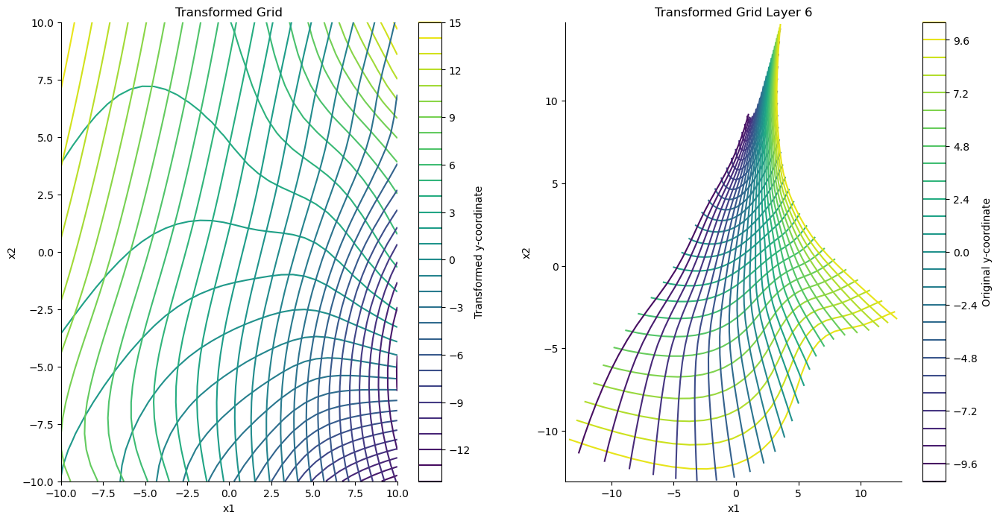

Forward transformed shape: torch.Size([900, 2])
log_det_fwd shape: torch.Size([900])
max log det 1.808025598526001 min log det -3.063624858856201 

Max reconstruction error: 1.0835776720341528e-13


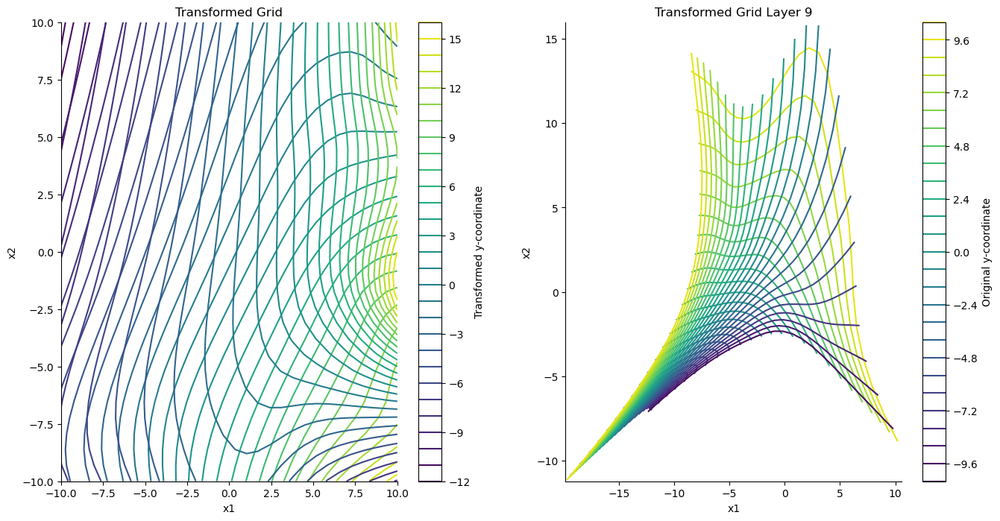

Forward transformed shape: torch.Size([900, 2])
log_det_fwd shape: torch.Size([900])
max log det 1.1965545415878296 min log det -3.12872314453125 

Max reconstruction error: 3.3661962106634746e-13


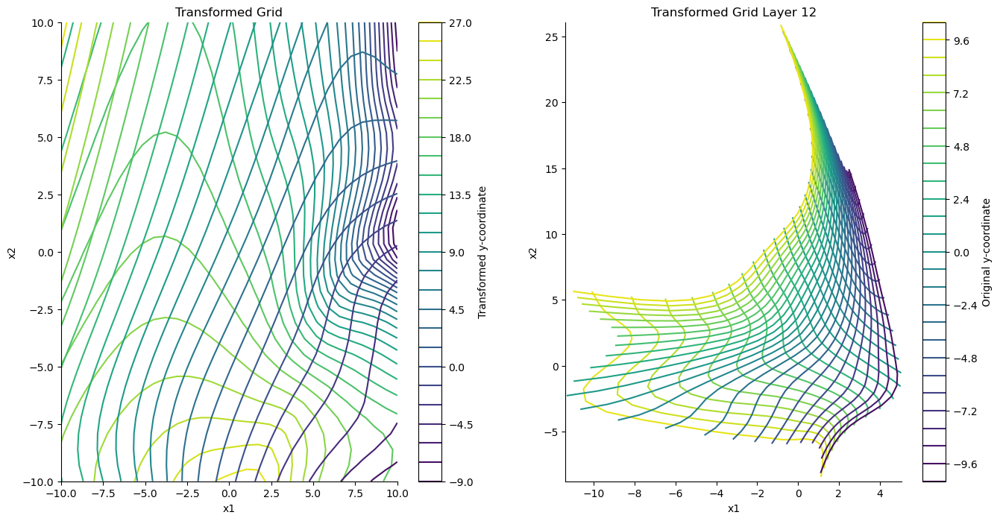

Forward transformed shape: torch.Size([900, 2])
log_det_fwd shape: torch.Size([900])
max log det 1.6390266418457031 min log det -1.422032356262207 

Max reconstruction error: 1.255884285455977e-12


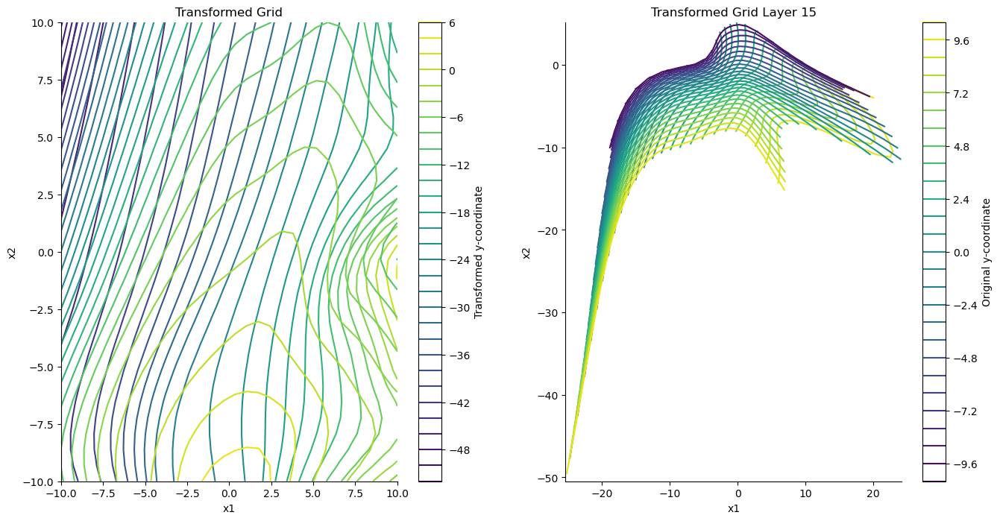

Forward transformed shape: torch.Size([900, 2])
log_det_fwd shape: torch.Size([900])
max log det 4.009426593780518 min log det -0.11930962651968002 

Max reconstruction error: 1.6644463585180347e-12


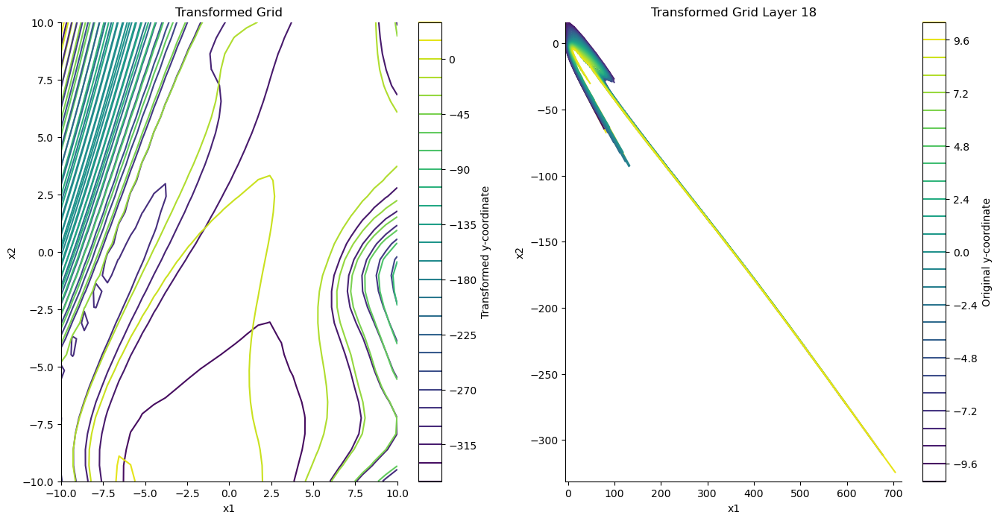

Forward transformed shape: torch.Size([900, 2])
log_det_fwd shape: torch.Size([900])
max log det 2.889049530029297 min log det -0.6541293263435364 

Max reconstruction error: 7.991829420461727e-12


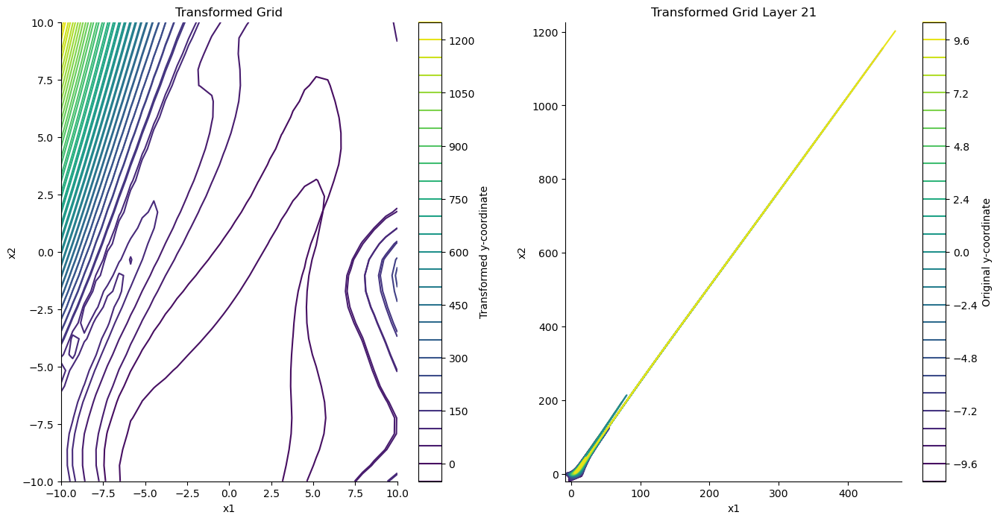

In [42]:
torch.manual_seed(42)
dim = 2
# Instantiate a single coupling layer
realnvp = RealNVPND_stack(dim=dim, hidden_dim=16, stack_size=24, linear_type="orthogonal_shift", stabilized=True, dtype=torch.float64)

x_min, x_max = -10, 10
n_points = 30
x1 = torch.linspace(x_min, x_max, n_points)
x2 = torch.linspace(x_min, x_max, n_points)
X1, X2 = torch.meshgrid(x1, x2, indexing='ij')
x = torch.stack([X1.flatten(), X2.flatten()], dim=1).to(torch.float64)

for stop_layer in range(0, 24, 3):
    with torch.no_grad():
        x_forward, log_det_fwd = realnvp(x, reverse=False, early_stop_layer=stop_layer)
    print("Forward transformed shape:", x_forward.shape)
    print("log_det_fwd shape:", log_det_fwd.shape,)
    print("max log det", log_det_fwd.max().item(), "min log det", log_det_fwd.min().item(), "\n")

    # Inverse pass to verify invertibility
    with torch.no_grad():
        x_inverted, log_det_inv = realnvp(x_forward, reverse=True, early_stop_layer=stop_layer)
    print("Max reconstruction error:", torch.max(torch.abs(x - x_inverted)).item())

    # Reshape results back to grid for visualization
    X1_transformed = x_forward[:, 0].reshape(n_points, n_points).detach().numpy()
    X2_transformed = x_forward[:, 1].reshape(n_points, n_points).detach().numpy()

    plt.figure(figsize=(16, 8))
    plt.subplot(1,2,1)
    plt.contour(X1, X2, X1_transformed, levels=30, cmap='viridis')
    plt.contour(X1, X2, X2_transformed, levels=30, cmap='viridis')
    plt.colorbar(label='Transformed y-coordinate')
    plt.title('Transformed Grid')
    plt.xlabel('x1')
    plt.ylabel('x2')
    plt.subplot(1,2,2)
    plt.contour(X1_transformed, X2_transformed, X1, levels=30, cmap='viridis')
    plt.contour(X1_transformed, X2_transformed, X2, levels=30, cmap='viridis')
    plt.colorbar(label='Original y-coordinate')
    plt.title(f'Transformed Grid Layer {stop_layer}')
    plt.xlabel('x1')
    plt.ylabel('x2')
    plt.show()

### Test invertible layers


In [2]:
if __name__ == "__main__":
    torch.manual_seed(0)
    
    # Instantiate a single coupling layer
    realnvp = RealNVP2D(hidden_dim=16)
    
    # Create some random 2D data
    x = torch.randn(5, 2)  # 5 samples of dimension 2
    
    print("Original x:\n", x, "\n")
    
    # Forward pass
    x_forward, log_det_fwd = realnvp(x, reverse=False)
    print("Forward transformed x:\n", x_forward)
    print("log_det_fwd:\n", log_det_fwd, "\n")
    
    # Inverse pass
    x_inverted, log_det_inv = realnvp(x_forward, reverse=True)
    print("Inverted x (should match original):\n", x_inverted)
    print("Difference:\n", x - x_inverted, "\n")
    
    # Jacobian log-determinant check: log_det_fwd + log_det_inv should ~ 0
    print("Sum of forward & inverse log-dets:\n", (log_det_fwd + log_det_inv))


Original x:
 tensor([[ 0.6577,  0.9387],
        [ 1.1317, -0.6455],
        [-1.7703,  0.2143],
        [-0.5382,  0.5880],
        [ 1.6059,  0.4279]]) 

Forward transformed x:
 tensor([[ 0.6577,  1.1264],
        [ 1.1317, -1.4437],
        [-1.7703,  0.4923],
        [-0.5382,  0.6329],
        [ 1.6059,  0.2629]], grad_fn=<CatBackward0>)
log_det_fwd:
 tensor([ 0.4427,  0.4834, -0.4229,  0.2954,  0.5080],
       grad_fn=<SqueezeBackward1>) 

Inverted x (should match original):
 tensor([[ 0.6577,  0.9387],
        [ 1.1317, -0.6455],
        [-1.7703,  0.2143],
        [-0.5382,  0.5880],
        [ 1.6059,  0.4279]], grad_fn=<CatBackward0>)
Difference:
 tensor([[ 0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00],
        [ 0.0000e+00, -4.4703e-08],
        [ 0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00]], grad_fn=<SubBackward0>) 

Sum of forward & inverse log-dets:
 tensor([0., 0., 0., 0., 0.], grad_fn=<AddBackward0>)


In [14]:
if __name__ == "__main__":
    torch.manual_seed(0)
    # Instantiate a single coupling layer
    realnvp = RealNVP2D(hidden_dim=16)
    # Create a regular 2D grid
    x_min, x_max = -3, 3
    n_points = 20
    x1 = torch.linspace(x_min, x_max, n_points)
    x2 = torch.linspace(x_min, x_max, n_points)
    X1, X2 = torch.meshgrid(x1, x2, indexing='ij')
    x = torch.stack([X1.flatten(), X2.flatten()], dim=1)
    
    print("Grid shape:", x.shape, "\n")
    
    # Forward pass
    x_forward, log_det_fwd = realnvp(x, reverse=False)
    print("Forward transformed shape:", x_forward.shape)
    print("log_det_fwd shape:", log_det_fwd.shape, "\n")
    
    # Inverse pass to verify invertibility
    x_inverted, log_det_inv = realnvp(x_forward, reverse=True)
    print("Max reconstruction error:", torch.max(torch.abs(x - x_inverted)).item())
    
    # Reshape results back to grid for visualization
    X1_transformed = x_forward[:, 0].reshape(n_points, n_points).detach().numpy()
    X2_transformed = x_forward[:, 1].reshape(n_points, n_points).detach().numpy()

Grid shape: torch.Size([400, 2]) 

Forward transformed shape: torch.Size([400, 2])
log_det_fwd shape: torch.Size([400]) 

Max reconstruction error: 4.76837158203125e-07


### Test invertible linear layer


In [38]:
layer = InvertibleLinear2D()
x = torch.randn(1000, 2)
x_forward, log_det_fwd = layer(x, reverse=False)
# print("Forward transformed x:\n", x_forward)
# print("log_det_fwd:\n", log_det_fwd, "\n")
x_inverted, log_det_inv = layer(x_forward, reverse=True)
# print("Inverted x (should match original):\n", x_inverted)
print("Difference:\n", torch.max(torch.abs(x - x_inverted)).item(), "\n")

Difference:
 2.205371856689453e-06 



In [42]:
stacks = [InvertibleLinear2D() for _ in range(4)]
x = torch.randn(1000, 2)
x_orig = x.clone()
for stack in stacks:
    x, log_det_fwd = stack(x, reverse=False)
    print("log_det_fwd:\n", log_det_fwd, "\n")

for stack in stacks[::-1]:
    x, log_det_inv = stack(x, reverse=True)
    print("log_det_inv:\n", log_det_inv, "\n")
    
print("Difference:\n", torch.max(torch.abs(x_orig - x)).item(), "\n")

log_det_fwd:
 tensor([-4.8495, -4.8495, -4.8495, -4.8495, -4.8495, -4.8495, -4.8495, -4.8495,
        -4.8495, -4.8495, -4.8495, -4.8495, -4.8495, -4.8495, -4.8495, -4.8495,
        -4.8495, -4.8495, -4.8495, -4.8495, -4.8495, -4.8495, -4.8495, -4.8495,
        -4.8495, -4.8495, -4.8495, -4.8495, -4.8495, -4.8495, -4.8495, -4.8495,
        -4.8495, -4.8495, -4.8495, -4.8495, -4.8495, -4.8495, -4.8495, -4.8495,
        -4.8495, -4.8495, -4.8495, -4.8495, -4.8495, -4.8495, -4.8495, -4.8495,
        -4.8495, -4.8495, -4.8495, -4.8495, -4.8495, -4.8495, -4.8495, -4.8495,
        -4.8495, -4.8495, -4.8495, -4.8495, -4.8495, -4.8495, -4.8495, -4.8495,
        -4.8495, -4.8495, -4.8495, -4.8495, -4.8495, -4.8495, -4.8495, -4.8495,
        -4.8495, -4.8495, -4.8495, -4.8495, -4.8495, -4.8495, -4.8495, -4.8495,
        -4.8495, -4.8495, -4.8495, -4.8495, -4.8495, -4.8495, -4.8495, -4.8495,
        -4.8495, -4.8495, -4.8495, -4.8495, -4.8495, -4.8495, -4.8495, -4.8495,
        -4.8495, -4.8495, 

In [51]:
realnvp.linear_layers[0].theta

Parameter containing:
tensor([0.], requires_grad=True)

### Testing nd invertible function

In [38]:
torch.manual_seed(43)
dim = 100
# Instantiate a single coupling layer
realnvp = RealNVPND_stack(dim=dim, hidden_dim=16, stack_size=20, linear_type="orthogonal_shift", stabilized=True, dtype=torch.float64)
# Create a regular 2D grid
# x_min, x_max = -10, 10
# n_points = 30
# x1 = torch.linspace(x_min, x_max, n_points)
# x2 = torch.linspace(x_min, x_max, n_points)
# X1, X2 = torch.meshgrid(x1, x2, indexing='ij')
# x = torch.stack([X1.flatten(), X2.flatten()], dim=1)
# print("Grid shape:", x.shape, "\n")
x = torch.randn(1000, dim).to(torch.float64)
# Forward pass
x_forward, log_det_fwd = realnvp(x, reverse=False)
print("Forward transformed shape:", x_forward.shape)
print("log_det_fwd shape:", log_det_fwd.shape, "\n")

# Inverse pass to verify invertibility
x_inverted, log_det_inv = realnvp(x_forward, reverse=True)
print("Max reconstruction error:", torch.max(torch.abs(x - x_inverted)).item())

# Reshape results back to grid for visualization
# X1_transformed = x_forward[:, 0].reshape(n_points, n_points).detach().numpy()
# X2_transformed = x_forward[:, 1].reshape(n_points, n_points).detach().numpy()

Forward transformed shape: torch.Size([1000, 100])
log_det_fwd shape: torch.Size([1000]) 

Max reconstruction error: 2.274846977456946e-13


### Testing 2d NVP

In [142]:
import matplotlib.pyplot as plt

In [164]:
if __name__ == "__main__":
    torch.manual_seed(43)
    # Instantiate a single coupling layer
    realnvp = RealNVP_stack(hidden_dim=8, stack_size=9, linear_type="orthogonal_shift", stabilized=True)
    # Create a regular 2D grid
    x_min, x_max = -10, 10
    n_points = 30
    x1 = torch.linspace(x_min, x_max, n_points)
    x2 = torch.linspace(x_min, x_max, n_points)
    X1, X2 = torch.meshgrid(x1, x2, indexing='ij')
    x = torch.stack([X1.flatten(), X2.flatten()], dim=1)
    print("Grid shape:", x.shape, "\n")
    # Forward pass
    x_forward, log_det_fwd = realnvp(x, reverse=False)
    print("Forward transformed shape:", x_forward.shape)
    print("log_det_fwd shape:", log_det_fwd.shape, "\n")
    
    # Inverse pass to verify invertibility
    x_inverted, log_det_inv = realnvp(x_forward, reverse=True)
    print("Max reconstruction error:", torch.max(torch.abs(x - x_inverted)).item())
    
    # Reshape results back to grid for visualization
    X1_transformed = x_forward[:, 0].reshape(n_points, n_points).detach().numpy()
    X2_transformed = x_forward[:, 1].reshape(n_points, n_points).detach().numpy()

Grid shape: torch.Size([900, 2]) 

Forward transformed shape: torch.Size([900, 2])
log_det_fwd shape: torch.Size([900]) 

Max reconstruction error: 1.9431114196777344e-05


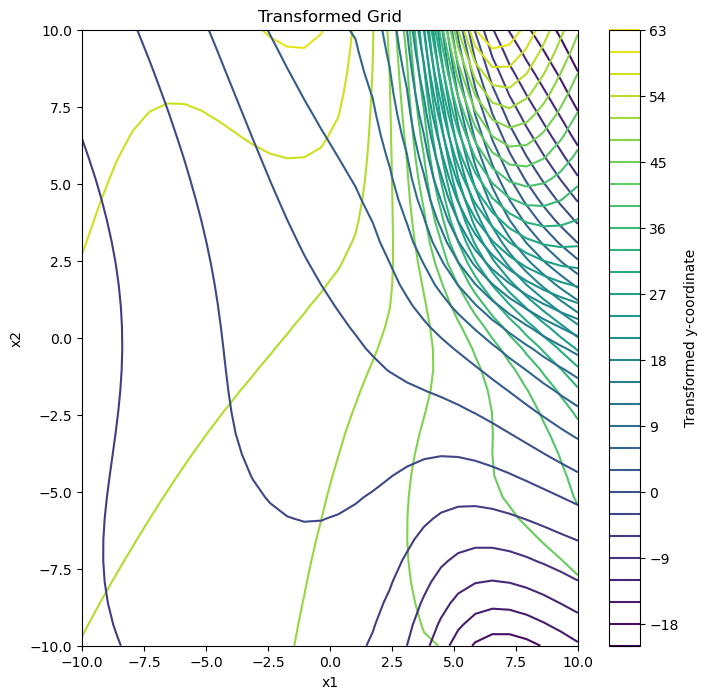

In [165]:
# show the transformed grid
plt.figure(figsize=(8, 8))
plt.contour(X1, X2, X1_transformed, levels=30, cmap='viridis')
plt.contour(X1, X2, X2_transformed, levels=30, cmap='viridis')
plt.colorbar(label='Transformed y-coordinate')
plt.title('Transformed Grid')
plt.xlabel('x1')
plt.ylabel('x2')
plt.show()

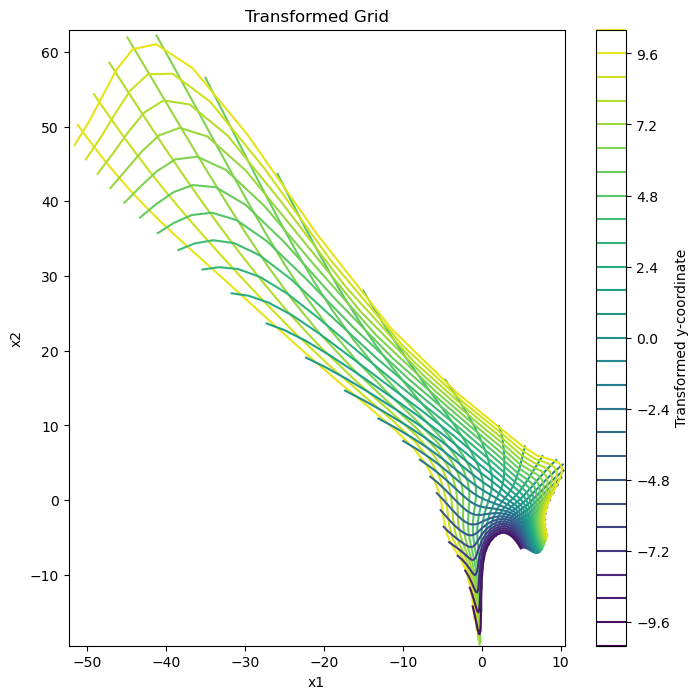

In [166]:
# show the transformed grid
plt.figure(figsize=(8, 8))
plt.contour(X1_transformed, X2_transformed, X1, levels=30, cmap='viridis')
plt.contour(X1_transformed, X2_transformed, X2, levels=30, cmap='viridis')
plt.colorbar(label='Transformed y-coordinate')
plt.title('Transformed Grid')
plt.xlabel('x1')
plt.ylabel('x2')
plt.show()

### Optimization in the 2d Real NVP layer

#### SGD / Adam

In [178]:
# Define Gaussian function in transformed space
def gaussian_target(x, mean=torch.zeros(2), std=torch.ones(1)):
    return torch.exp(-0.5 * torch.sum((x - mean)**2, dim=1) / std**2)


# set seed
torch.manual_seed(43)
# Initialize RealNVP model
realnvp = RealNVP_stack(hidden_dim=16, stack_size=10, linear_type="orthogonal_shift", stabilized=True)
# Initialize input point to optimize
x = torch.zeros(1, 2, requires_grad=True)
# Optimize to find maximum of Gaussian
optimizer = torch.optim.SGD([x], lr=0.1)
mean = torch.tensor([1.0, -2.0])
pbar = trange(100)
for i in pbar:
    optimizer.zero_grad()
    # Transform input through RealNVP
    x_transformed, _ = realnvp(x, reverse=False)
    # Compute Gaussian value in transformed space
    loss = -gaussian_target(x_transformed, mean=torch.zeros(2), )  # Negative because we want to maximize
    loss.backward()
    optimizer.step()
    pbar.set_postfix(loss=-loss.item())


# Get final optimized point
with torch.no_grad():
    x_opt = x.clone()
    x_transformed_opt, _ = realnvp(x_opt, reverse=False)
    print(f"Optimized point in input space: {x_opt.numpy()}")
    print(f"Optimized point in transformed space: {x_transformed_opt.numpy()}")
    print(f"Gaussian value at optimum: {gaussian_target(x_transformed_opt).item()}")

100%|██████████| 100/100 [00:01<00:00, 92.83it/s, loss=0.0452]


Optimized point in input space: [[0.03229344 0.5620917 ]]
Optimized point in transformed space: [[-0.50459826  2.4235427 ]]
Gaussian value at optimum: 0.046696338802576065


In [202]:
# Define Gaussian function in transformed space
def gaussian_target(x, mean=torch.zeros(2), std=torch.ones(1)):
    return torch.exp(-0.5 * torch.sum((x - mean)**2, dim=1) / std**2)


# set seed
torch.manual_seed(43)
# Initialize RealNVP model
realnvp = RealNVP_stack(hidden_dim=16, stack_size=7, linear_type="orthogonal_shift", stabilized=True)
# Initialize input point to optimize
x = torch.randn(1, 2, requires_grad=True)
# Optimize to find maximum of Gaussian
optimizer = torch.optim.SGD([x], lr=0.1)
mean = torch.tensor([1.0, -2.0])
pbar = trange(100)
for i in pbar:
    optimizer.zero_grad()
    # Transform input through RealNVP
    x_transformed, _ = realnvp(x, reverse=False)
    # Compute Gaussian value in transformed space
    loss = -gaussian_target(x_transformed, mean=mean, )  # Negative because we want to maximize
    loss.backward()
    optimizer.step()
    pbar.set_postfix(loss=-loss.item())


# Get final optimized point
with torch.no_grad():
    x_opt = x.clone()
    x_transformed_opt, _ = realnvp(x_opt, reverse=False)
    print(f"Optimized point in input space: {x_opt.numpy()}")
    print(f"Optimized point in transformed space: {x_transformed_opt.numpy()}")
    print(f"Gaussian value at optimum: {gaussian_target(x_transformed_opt).item()}")

100%|██████████| 100/100 [00:00<00:00, 126.55it/s, loss=0.000737]

Optimized point in input space: [[-0.62592703 -0.12368996]]
Optimized point in transformed space: [[1.4860941 1.7665881]]
Gaussian value at optimum: 0.06962338835000992


#### CMAES

In [40]:
from circuit_toolkit.Optimizers import CholeskyCMAES_torch

c:\users\lio50\github\circuit_toolkit\circuit_toolkit\GAN_invert_utils.py:2: TqdmExperimentalWarning: Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)
  from tqdm.autonotebook import trange, tqdm


In [204]:
cma_optimizer = CholeskyCMAES_torch(
    space_dimen=2, init_sigma=0.1, init_code=torch.zeros(2), Aupdate_freq=1, 
    maximize=True, 
)

Space dimension: 2, Population size: 7, Select size:3, Optimization Parameters:
Initial sigma: 0.100
cc=0.667, cs=0.515, c1=0.172, damps=1.515


d:\github\dissection_toolkit\circuit_toolkit\Optimizers.py:201: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  self.init_x = torch.tensor(init_code, device=self.device, dtype=torch.float32).reshape(1, N)


In [248]:
optimum = torch.tensor([1.0, -2.0])
x_optimum = realnvp(optimum[None, :].detach().clone(), reverse=True)[0]

In [240]:
optimum = torch.tensor([1.0, -2.0])
x_optimum = realnvp(optimum[None, :], reverse=True)[0]

In [249]:
optimum

tensor([ 1., -2.])

In [242]:
x_optimum

tensor([[-1.5837, -5.6210]], grad_fn=<CatBackward0>)

In [257]:
# Define Gaussian function in transformed space
def gaussian_target(x, mean=torch.zeros(2), std=torch.ones(1)):
    return torch.exp(-0.5 * torch.sum((x - mean)**2, dim=1) / std**2)


# set seed
torch.manual_seed(41)
# Initialize RealNVP model
realnvp = RealNVP_stack(hidden_dim=16, stack_size=10, linear_type="orthogonal_shift", stabilized=True)
# Initialize input point to optimize
x = torch.randn(1, 2, requires_grad=False)
# Optimize to find maximum of Gaussian
cma_optimizer = CholeskyCMAES_torch(
    space_dimen=2, init_sigma=0.5, init_code=x, Aupdate_freq=1, 
    maximize=True, 
)
optimum = torch.tensor([1.0, -2.0])
with torch.no_grad():
    x_optimum = realnvp(optimum[None, :].detach().clone(), reverse=True)[0]
pbar = trange(100)
for i in pbar:
    # Transform input through RealNVP
    x_transformed, _ = realnvp(x, reverse=False)
    # Compute Gaussian value in transformed space
    scores = gaussian_target(x_transformed, mean=optimum, )  # Negative because we want to maximize
    x_next = cma_optimizer.step_simple(scores, x, verbosity=0)
    x = x_next
    pbar.set_postfix(loss=scores.mean().item(), sigma=cma_optimizer.sigma)
    # print("optimum", optimum)
    # print("x_optimum", x_optimum)


# Get final optimized point
with torch.no_grad():
    x_opt = x.mean(dim=0, keepdim=True).clone()
    x_transformed_opt, _ = realnvp(x_opt, reverse=False)
    print(f"Optimized point in input space: {x_opt.numpy()}")
    print(f"Optimized point in transformed space: {x_transformed_opt.numpy()}")
    print(f"Gaussian value at optimum: {gaussian_target(x_transformed_opt, mean=optimum).item()}")
    print(f"desired optimum in x space: {x_optimum}")
    print(f"desired optimum in transformed space: {optimum}")


Space dimension: 2, Population size: 7, Select size:3, Optimization Parameters:
Initial sigma: 0.500
cc=0.667, cs=0.515, c1=0.172, damps=1.515


100%|██████████| 100/100 [00:00<00:00, 160.74it/s, loss=1, sigma=7.54e-5]  

Optimized point in input space: [[-1.5837256 -5.6210704]]
Optimized point in transformed space: [[ 0.99989986 -2.0000088 ]]
Gaussian value at optimum: 1.0
desired optimum in x space: tensor([[-1.5837, -5.6210]])
desired optimum in transformed space: tensor([ 1., -2.])


In [238]:
optimum

tensor([-0.8152, -2.5552], grad_fn=<CopySlices>)

In [235]:
gaussian_target(x_transformed_opt, mean=optimum)

tensor([1.], grad_fn=<ExpBackward0>)

In [234]:
x_optimum

tensor([[-1.5837, -5.6210]], grad_fn=<CatBackward0>)

### ND 

In [9]:
from circuit_toolkit.Optimizers import CholeskyCMAES_torch
from tqdm.auto import trange

c:\users\lio50\github\circuit_toolkit\circuit_toolkit\GAN_invert_utils.py:2: TqdmExperimentalWarning: Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)
  from tqdm.autonotebook import trange, tqdm


In [51]:
# Define Gaussian function in transformed space
def gaussian_target(x, mean=torch.zeros(1), std=torch.ones(1)):
    return torch.exp(-0.5 * torch.sum((x - mean)**2, dim=1) / std**2)


# set seed
torch.manual_seed(41)
dim = 10
# Initialize RealNVP model
realnvp = RealNVPND_stack(dim=dim, hidden_dim=16, stack_size=16, linear_type="orthogonal_shift", stabilized=True, dtype=torch.float64)
# Initialize input point to optimize
x = torch.randn(1, dim, requires_grad=False, dtype=torch.float64)
# Optimize to find maximum of Gaussian
cma_optimizer = CholeskyCMAES_torch(
    space_dimen=dim, init_sigma=0.5, init_code=x, Aupdate_freq=1, 
    maximize=True, dtype=torch.float64, 
)
optimum = torch.ones(dim, dtype=torch.float64)
with torch.no_grad():
    x_optimum, _ = realnvp(optimum[None, :], reverse=True)
print(f"x optimum {x_optimum}")
print(f"latent optimum {optimum}")
torch.manual_seed(torch.seed())
pbar = trange(100)
for i in pbar:
    # Transform input through RealNVP
    x_transformed, _ = realnvp(x, reverse=False)
    # Compute Gaussian value in transformed space
    scores = gaussian_target(x_transformed, mean=optimum, )  # Negative because we want to maximize
    x_next = cma_optimizer.step_simple(scores, x, verbosity=0)
    x = x_next.to(torch.float64)
    pbar.set_postfix(loss=scores.mean().item(), sigma=cma_optimizer.sigma)


# Get final optimized point
with torch.no_grad():
    x_opt = x.mean(dim=0, keepdim=True).clone()
    x_transformed_opt, _ = realnvp(x_opt, reverse=False)
    print(f"Optimized point in input space: {x_opt.numpy()}")
    print(f"Optimized point in transformed space: {x_transformed_opt.numpy()}")
    print(f"Gaussian value at optimum: {gaussian_target(x_transformed_opt, mean=optimum).item()}")
    print(f"desired optimum in x space: {x_optimum}")
    print(f"desired optimum in transformed space: {optimum}")


Space dimension: 10, Population size: 13, Select size:6, Optimization Parameters:
Initial sigma: 0.500
cc=0.286, cs=0.387, c1=0.015, damps=1.387
x optimum tensor([[ 5.0936, -1.6560, -1.8258,  0.5672,  3.5259, -6.3583, -2.0368, -2.3873,
         10.4373,  3.6820]], dtype=torch.float64)
latent optimum tensor([1., 1., 1., 1., 1., 1., 1., 1., 1., 1.], dtype=torch.float64)


  0%|          | 0/100 [00:00<?, ?it/s]

Optimized point in input space: [[ 5.15788908 -1.64873237 -1.81484363  0.50889583  3.59041129 -6.43373577
  -2.07690813 -2.27330534 10.3974328   3.77775695]]
Optimized point in transformed space: [[1.06316237 0.99770083 0.95034737 0.98948156 1.00911821 1.04066663
  1.00232208 0.98192186 1.14680432 1.03680289]]
Gaussian value at optimum: 0.9843508009273197
desired optimum in x space: tensor([[ 5.0936, -1.6560, -1.8258,  0.5672,  3.5259, -6.3583, -2.0368, -2.3873,
         10.4373,  3.6820]], dtype=torch.float64)
desired optimum in transformed space: tensor([1., 1., 1., 1., 1., 1., 1., 1., 1., 1.], dtype=torch.float64)


### Massive ND Real NVP experiment

In [47]:
def run_optimization_experiment(dim=10, stack_size=16, hidden_dim=16, skip_nonlinear=False, network_seed=41, optim_seed=None,
                                max_steps=100, verbosity=2, use_log_score=False, device="cuda"):
    # Define Gaussian function in transformed space
    def gaussian_target(x, mean=torch.zeros(1), std=1.0):
        return torch.exp(-0.5 * torch.sum((x - mean)**2, dim=1) / std**2)

    def log_gaussian_target(x, mean=torch.zeros(1), std=1.0):
        # note log Gaussian target could help with numerical stability 
        return -0.5 * torch.sum((x - mean)**2, dim=1) / std**2
    
    if stack_size == 0: 
        skip_nonlinear = True
    
    # Initialize RealNVP model
    if skip_nonlinear:
        realnvp = lambda x, reverse: (x, 0)
    else:
        # set seed
        torch.manual_seed(network_seed)
        realnvp = RealNVPND_stack(dim=dim, hidden_dim=hidden_dim, stack_size=stack_size, 
                             linear_type="orthogonal_shift", stabilized=True, dtype=torch.float64).to(device)
    
    # Initialize input point to optimize
    x = torch.randn(1, dim, requires_grad=False, dtype=torch.float64, device=device)
    
    # Optimize to find maximum of Gaussian
    cma_optimizer = CholeskyCMAES_torch(
        space_dimen=dim, init_sigma=0.5, init_code=x, Aupdate_freq=1,
        maximize=True, dtype=torch.float64, device=device
    )
    
    optimum = torch.ones(dim, dtype=torch.float64, device=device)
    std = 1.0
    with torch.no_grad():
        x_optimum, _ = realnvp(optimum[None, :], reverse=True)
    if verbosity >= 2: 
        print(f"latent optimum {optimum}")
        print(f"x optimum {x_optimum}")
    
    # Reset seed for optimization
    torch.manual_seed(torch.seed() if optim_seed is None else optim_seed)
    pbar = trange(max_steps)
    generations = []
    scores_all = []
    with torch.no_grad():
        for i in pbar:
            x_transformed, _ = realnvp(x, reverse=False)
            if use_log_score:
                scores = log_gaussian_target(x_transformed, mean=optimum, std=std)
            else:
                scores = gaussian_target(x_transformed, mean=optimum, std=std)
            x_next = cma_optimizer.step_simple(scores, x, verbosity=0)
            x = x_next.to(torch.float64)
            mean_score = scores.mean()
            pbar.set_postfix(loss=mean_score.exp().item() if use_log_score else mean_score.item(), sigma=cma_optimizer.sigma)
            scores_all.append(scores)
            generations.extend([i]*len(scores))

    scores_all = torch.concat(scores_all, dim=0).detach().cpu()
    # Get final results
    results = {}
    if use_log_score:
        results["scores_all"] = scores_all.exp()
    else:
        results["scores_all"] = scores_all
    results["generations"] = torch.tensor(generations)
    with torch.no_grad():
        x_opt = x.mean(dim=0, keepdim=True).clone()
        x_transformed_opt, _ = realnvp(x_opt, reverse=False)
        results['input_space_optimum'] = x_opt.detach().cpu().numpy()
        results['transformed_space_optimum'] = x_transformed_opt.detach().cpu().numpy()
        results['gaussian_value'] = gaussian_target(x_transformed_opt, mean=optimum, std=std).item()
        results['desired_x_optimum'] = x_optimum.detach().cpu().numpy()
        results['desired_transformed_optimum'] = optimum.detach().cpu().numpy()
        if verbosity >= 2: 
            print(f"Optimized point in input space: {results['input_space_optimum']}")
            print(f"Optimized point in transformed space: {results['transformed_space_optimum']}")
            print(f"Gaussian value at optimum: {results['gaussian_value']}")
            print(f"desired optimum in x space: {results['desired_x_optimum']}")
            print(f"desired optimum in transformed space: {results['desired_transformed_optimum']}")
        
    return results


In [ ]:
def run_optimization_experiment_gradient(dim=10, stack_size=16, hidden_dim=16, skip_nonlinear=False, network_seed=41, optim_seed=None,
                                max_steps=100, verbosity=2, use_log_score=False, device="cuda", optimizer_type="SGD", lr=0.01):
    # Define Gaussian function in transformed space
    def gaussian_target(x, mean=torch.zeros(1), std=1.0):
        return torch.exp(-0.5 * torch.sum((x - mean)**2, dim=1) / std**2)

    def log_gaussian_target(x, mean=torch.zeros(1), std=1.0):
        # note log Gaussian target could help with numerical stability 
        return -0.5 * torch.sum((x - mean)**2, dim=1) / std**2
    
    if stack_size == 0: 
        skip_nonlinear = True
    
    # Initialize RealNVP model
    if skip_nonlinear:
        realnvp = lambda x, reverse: (x, 0)
    else:
        # set seed
        torch.manual_seed(network_seed)
        realnvp = RealNVPND_stack(dim=dim, hidden_dim=hidden_dim, stack_size=stack_size, 
                             linear_type="orthogonal_shift", stabilized=True, dtype=torch.float64).to(device)
        # set parameter no grad 
        for param in realnvp.parameters():
            param.requires_grad = False

    # Initialize input point to optimize
    x = torch.randn(1, dim, requires_grad=True, dtype=torch.float64, device=device)
    
    # Choose optimizer
    if optimizer_type == "SGD":
        optimizer = torch.optim.SGD([x], lr=lr)
    elif optimizer_type == "Adam":
        optimizer = torch.optim.Adam([x], lr=lr)
    else:
        raise ValueError("Unsupported optimizer type. Choose 'SGD' or 'Adam'.")
    
    optimum = torch.ones(dim, dtype=torch.float64, device=device)
    std = 1.0
    with torch.no_grad():
        x_optimum, _ = realnvp(optimum[None, :], reverse=True)
    if verbosity >= 2: 
        print(f"latent optimum {optimum}")
        print(f"x optimum {x_optimum}")
    
    # Reset seed for optimization
    torch.manual_seed(torch.seed() if optim_seed is None else optim_seed)
    pbar = trange(max_steps)
    generations = []
    scores_all = []
    for i in pbar:
        optimizer.zero_grad()
        x_transformed, _ = realnvp(x, reverse=False)
        if use_log_score:
            scores = log_gaussian_target(x_transformed, mean=optimum, std=std)
        else:
            scores = gaussian_target(x_transformed, mean=optimum, std=std)
        loss = -scores.mean()  # We want to maximize the score
        loss.backward()
        optimizer.step()
        mean_score = scores.mean()
        pbar.set_postfix(loss=mean_score.exp().item() if use_log_score else mean_score.item())
        scores_all.append(scores.detach())
        generations.extend([i]*len(scores))

    scores_all = torch.concat(scores_all, dim=0).detach().cpu()
    # Get final results
    results = {}
    if use_log_score:
        results["scores_all"] = scores_all.exp()
    else:
        results["scores_all"] = scores_all
    results["generations"] = torch.tensor(generations)
    with torch.no_grad():
        x_opt = x.mean(dim=0, keepdim=True).clone()
        x_transformed_opt, _ = realnvp(x_opt, reverse=False)
        results['input_space_optimum'] = x_opt.detach().cpu().numpy()
        results['transformed_space_optimum'] = x_transformed_opt.detach().cpu().numpy()
        results['gaussian_value'] = gaussian_target(x_transformed_opt, mean=optimum, std=std).item()
        results['desired_x_optimum'] = x_optimum.detach().cpu().numpy()
        results['desired_transformed_optimum'] = optimum.detach().cpu().numpy()
        if verbosity >= 2: 
            print(f"Optimized point in input space: {results['input_space_optimum']}")
            print(f"Optimized point in transformed space: {results['transformed_space_optimum']}")
            print(f"Gaussian value at optimum: {results['gaussian_value']}")
            print(f"desired optimum in x space: {results['desired_x_optimum']}")
            print(f"desired optimum in transformed space: {results['desired_transformed_optimum']}")
        
    return results


In [ ]:
# Example usage:
dims_to_test = [2, 4, 8, 16, 32, 64, 128, ]
stack_sizes = [0, 2, 4, 8, 16, 32, 48, 64]
seeds = range(40, 50)

results_dict = {}
for dim in dims_to_test:
    for stack in stack_sizes:
        for seed in seeds:
            key = f"dim{dim}_stack{stack}_seed{seed}"
            results_dict[key] = run_optimization_experiment(
                dim=dim, 
                stack_size=stack,
                network_seed=seed,
                verbosity=0
            )


In [68]:
import seaborn as sns
import pandas as pd

# Create DataFrame from results
records = []
for key, result in results_dict.items():
    dim, stack, seed = key.replace('dim','').replace('stack','').replace('seed','').split('_')
    record = {
        'dimension': int(dim),
        'stack_size': int(stack), 
        'seed': int(seed),
        'gaussian_value': result['gaussian_value'],
        'input_space_optimum': result['input_space_optimum'],
        'transformed_space_optimum': result['transformed_space_optimum'],
        'desired_x_optimum': result['desired_x_optimum'],
        'desired_transformed_optimum': result['desired_transformed_optimum']
    }
    records.append(record)
    
results_df = pd.DataFrame.from_records(records)

In [70]:
results_df

,dimension,stack_size,seed,gaussian_value,input_space_optimum,transformed_space_optimum,desired_x_optimum,desired_transformed_optimum
0,2,0,40,1.0,"[[0.9999999951605821, 1.00000000304062]]","[[0.9999999951605821, 1.00000000304062]]","[[1.0, 1.0]]","[1.0, 1.0]"
1,2,0,41,1.0,"[[0.9999999954539397, 1.0000000022493676]]","[[0.9999999954539397, 1.0000000022493676]]","[[1.0, 1.0]]","[1.0, 1.0]"
2,2,0,42,1.0,"[[0.9999999981842945, 1.000000004803517]]","[[0.9999999981842945, 1.000000004803517]]","[[1.0, 1.0]]","[1.0, 1.0]"
3,2,0,43,1.0,"[[1.0000000008273762, 0.9999999912931029]]","[[1.0000000008273762, 0.9999999912931029]]","[[1.0, 1.0]]","[1.0, 1.0]"
4,2,0,44,1.0,"[[0.9999999967723239, 0.9999999883584539]]","[[0.9999999967723239, 0.9999999883584539]]","[[1.0, 1.0]]","[1.0, 1.0]"
...,...,...,...,...,...,...,...,...
175,100,64,40,0.0,"[[-1.7998676554164947, -2.7275111404534518, 3....","[[-1583674121.85558, 1150947539.5163677, 19524...","[[-132222918.49147575, -164437664.28411093, -1...","[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ..."
176,100,64,41,0.0,"[[-1.5040454127145575, -1.8608467387671666, -1...","[[2298928243.7879376, -694584008.9046452, -299...","[[-39073579.50272219, -41850463.8452535, 22411...","[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ..."
177,100,64,42,0.0,"[[-0.39658724793941086, -0.3095253805756855, 1...","[[2357333906.64259, 3600889123.8618016, 148244...","[[502972519.46825784, 479073196.3423907, 48522...","[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ..."
178,100,64,43,0.0,"[[1.3281995134023343, -1.027563122670577, -3.0...","[[9487958154.126812, 7675674351.625174, 116925...","[[-902359344.6251062, 574968863.5621687, -9488...","[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ..."


<Axes: xlabel='stack_size', ylabel='gaussian_value'>

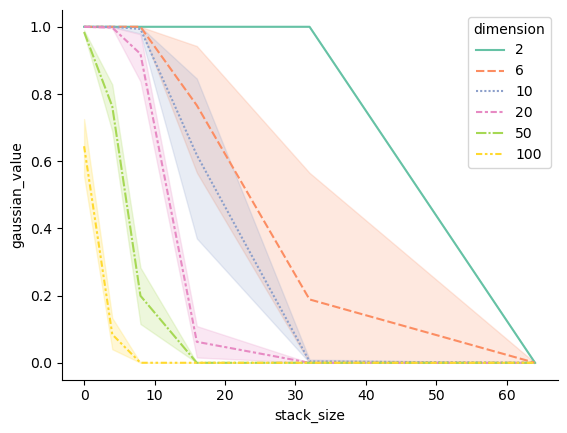

In [74]:
sns.lineplot(data=results_df, y="gaussian_value", x="stack_size", hue="dimension", style="dimension", palette="Set2")

#### Quadratic, Log scale case

In [48]:
# Example usage:
dims_to_test = [2, 4, 8, 16, 32, 64, 128, ]
stack_sizes = [0, 2, 4, 8, 16, 32, 48, 64]
seeds = range(40, 50)

results_dict = {}
for dim in dims_to_test:
    for stack in stack_sizes:
        for seed in seeds:
            key = f"dim{dim}_stack{stack}_seed{seed}"
            results_dict[key] = run_optimization_experiment(
                dim=dim, 
                stack_size=stack,
                network_seed=seed,
                use_log_score=True,
                verbosity=0,
                device="cuda"
            )


d:\github\dissection_toolkit\circuit_toolkit\Optimizers.py:202: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  self.init_x = torch.tensor(init_code, device=self.device, dtype=self.dtype).reshape(1, N)


Space dimension: 2, Population size: 7, Select size:3, Optimization Parameters:
Initial sigma: 0.500
cc=0.667, cs=0.515, c1=0.172, damps=1.515


100%|██████████| 100/100 [00:00<00:00, 358.42it/s, loss=1, sigma=1.94e-8]


Space dimension: 2, Population size: 7, Select size:3, Optimization Parameters:
Initial sigma: 0.500
cc=0.667, cs=0.515, c1=0.172, damps=1.515


100%|██████████| 100/100 [00:00<00:00, 348.43it/s, loss=1, sigma=1.65e-7]


Space dimension: 2, Population size: 7, Select size:3, Optimization Parameters:
Initial sigma: 0.500
cc=0.667, cs=0.515, c1=0.172, damps=1.515


100%|██████████| 100/100 [00:00<00:00, 362.32it/s, loss=1, sigma=1.67e-8]


Space dimension: 2, Population size: 7, Select size:3, Optimization Parameters:
Initial sigma: 0.500
cc=0.667, cs=0.515, c1=0.172, damps=1.515


100%|██████████| 100/100 [00:00<00:00, 369.00it/s, loss=1, sigma=3.24e-8]


Space dimension: 2, Population size: 7, Select size:3, Optimization Parameters:
Initial sigma: 0.500
cc=0.667, cs=0.515, c1=0.172, damps=1.515


100%|██████████| 100/100 [00:00<00:00, 360.55it/s, loss=1, sigma=3.92e-8]


Space dimension: 2, Population size: 7, Select size:3, Optimization Parameters:
Initial sigma: 0.500
cc=0.667, cs=0.515, c1=0.172, damps=1.515


100%|██████████| 100/100 [00:00<00:00, 359.71it/s, loss=1, sigma=3.69e-7]


Space dimension: 2, Population size: 7, Select size:3, Optimization Parameters:
Initial sigma: 0.500
cc=0.667, cs=0.515, c1=0.172, damps=1.515


100%|██████████| 100/100 [00:00<00:00, 351.80it/s, loss=1, sigma=3.16e-8]


Space dimension: 2, Population size: 7, Select size:3, Optimization Parameters:
Initial sigma: 0.500
cc=0.667, cs=0.515, c1=0.172, damps=1.515


100%|██████████| 100/100 [00:00<00:00, 366.28it/s, loss=1, sigma=2.77e-7]


Space dimension: 2, Population size: 7, Select size:3, Optimization Parameters:
Initial sigma: 0.500
cc=0.667, cs=0.515, c1=0.172, damps=1.515


100%|██████████| 100/100 [00:00<00:00, 370.39it/s, loss=1, sigma=3.83e-8]


Space dimension: 2, Population size: 7, Select size:3, Optimization Parameters:
Initial sigma: 0.500
cc=0.667, cs=0.515, c1=0.172, damps=1.515


100%|██████████| 100/100 [00:00<00:00, 350.88it/s, loss=1, sigma=3.5e-7] 


Space dimension: 2, Population size: 7, Select size:3, Optimization Parameters:
Initial sigma: 0.500
cc=0.667, cs=0.515, c1=0.172, damps=1.515


100%|██████████| 100/100 [00:00<00:00, 217.39it/s, loss=1, sigma=4.2e-8]   


Space dimension: 2, Population size: 7, Select size:3, Optimization Parameters:
Initial sigma: 0.500
cc=0.667, cs=0.515, c1=0.172, damps=1.515


100%|██████████| 100/100 [00:00<00:00, 173.01it/s, loss=1, sigma=7.54e-8]


Space dimension: 2, Population size: 7, Select size:3, Optimization Parameters:
Initial sigma: 0.500
cc=0.667, cs=0.515, c1=0.172, damps=1.515


100%|██████████| 100/100 [00:00<00:00, 202.43it/s, loss=1, sigma=2.52e-7]  


Space dimension: 2, Population size: 7, Select size:3, Optimization Parameters:
Initial sigma: 0.500
cc=0.667, cs=0.515, c1=0.172, damps=1.515


100%|██████████| 100/100 [00:00<00:00, 200.40it/s, loss=1, sigma=1.34e-7]  


Space dimension: 2, Population size: 7, Select size:3, Optimization Parameters:
Initial sigma: 0.500
cc=0.667, cs=0.515, c1=0.172, damps=1.515


100%|██████████| 100/100 [00:00<00:00, 192.96it/s, loss=1, sigma=5.23e-8]  


Space dimension: 2, Population size: 7, Select size:3, Optimization Parameters:
Initial sigma: 0.500
cc=0.667, cs=0.515, c1=0.172, damps=1.515


100%|██████████| 100/100 [00:00<00:00, 219.05it/s, loss=1, sigma=1.53e-7]  


Space dimension: 2, Population size: 7, Select size:3, Optimization Parameters:
Initial sigma: 0.500
cc=0.667, cs=0.515, c1=0.172, damps=1.515


100%|██████████| 100/100 [00:00<00:00, 225.23it/s, loss=1, sigma=3.95e-8]  


Space dimension: 2, Population size: 7, Select size:3, Optimization Parameters:
Initial sigma: 0.500
cc=0.667, cs=0.515, c1=0.172, damps=1.515


100%|██████████| 100/100 [00:00<00:00, 220.75it/s, loss=1, sigma=3.36e-8]  


Space dimension: 2, Population size: 7, Select size:3, Optimization Parameters:
Initial sigma: 0.500
cc=0.667, cs=0.515, c1=0.172, damps=1.515


100%|██████████| 100/100 [00:00<00:00, 220.75it/s, loss=1, sigma=1.49e-7]  


Space dimension: 2, Population size: 7, Select size:3, Optimization Parameters:
Initial sigma: 0.500
cc=0.667, cs=0.515, c1=0.172, damps=1.515


100%|██████████| 100/100 [00:00<00:00, 213.22it/s, loss=1, sigma=2.51e-7]  


Space dimension: 2, Population size: 7, Select size:3, Optimization Parameters:
Initial sigma: 0.500
cc=0.667, cs=0.515, c1=0.172, damps=1.515


100%|██████████| 100/100 [00:00<00:00, 171.82it/s, loss=1, sigma=3.34e-7]  


Space dimension: 2, Population size: 7, Select size:3, Optimization Parameters:
Initial sigma: 0.500
cc=0.667, cs=0.515, c1=0.172, damps=1.515


100%|██████████| 100/100 [00:00<00:00, 169.51it/s, loss=1, sigma=1.57e-7]  


Space dimension: 2, Population size: 7, Select size:3, Optimization Parameters:
Initial sigma: 0.500
cc=0.667, cs=0.515, c1=0.172, damps=1.515


100%|██████████| 100/100 [00:00<00:00, 168.56it/s, loss=1, sigma=1.67e-7]  


Space dimension: 2, Population size: 7, Select size:3, Optimization Parameters:
Initial sigma: 0.500
cc=0.667, cs=0.515, c1=0.172, damps=1.515


100%|██████████| 100/100 [00:00<00:00, 170.35it/s, loss=1, sigma=4.16e-8]  


Space dimension: 2, Population size: 7, Select size:3, Optimization Parameters:
Initial sigma: 0.500
cc=0.667, cs=0.515, c1=0.172, damps=1.515


100%|██████████| 100/100 [00:00<00:00, 170.65it/s, loss=1, sigma=1.91e-8]  


Space dimension: 2, Population size: 7, Select size:3, Optimization Parameters:
Initial sigma: 0.500
cc=0.667, cs=0.515, c1=0.172, damps=1.515


100%|██████████| 100/100 [00:00<00:00, 174.82it/s, loss=1, sigma=1.69e-7]  


Space dimension: 2, Population size: 7, Select size:3, Optimization Parameters:
Initial sigma: 0.500
cc=0.667, cs=0.515, c1=0.172, damps=1.515


100%|██████████| 100/100 [00:00<00:00, 165.56it/s, loss=1, sigma=9.17e-7]  


Space dimension: 2, Population size: 7, Select size:3, Optimization Parameters:
Initial sigma: 0.500
cc=0.667, cs=0.515, c1=0.172, damps=1.515


100%|██████████| 100/100 [00:00<00:00, 170.49it/s, loss=1, sigma=1.25e-6]  


Space dimension: 2, Population size: 7, Select size:3, Optimization Parameters:
Initial sigma: 0.500
cc=0.667, cs=0.515, c1=0.172, damps=1.515


100%|██████████| 100/100 [00:00<00:00, 171.08it/s, loss=1, sigma=1.52e-7]  


Space dimension: 2, Population size: 7, Select size:3, Optimization Parameters:
Initial sigma: 0.500
cc=0.667, cs=0.515, c1=0.172, damps=1.515


100%|██████████| 100/100 [00:00<00:00, 176.99it/s, loss=1, sigma=1.1e-7]   


Space dimension: 2, Population size: 7, Select size:3, Optimization Parameters:
Initial sigma: 0.500
cc=0.667, cs=0.515, c1=0.172, damps=1.515


100%|██████████| 100/100 [00:00<00:00, 116.69it/s, loss=1, sigma=1.9e-6]   


Space dimension: 2, Population size: 7, Select size:3, Optimization Parameters:
Initial sigma: 0.500
cc=0.667, cs=0.515, c1=0.172, damps=1.515


100%|██████████| 100/100 [00:00<00:00, 119.90it/s, loss=1, sigma=2.58e-7]  


Space dimension: 2, Population size: 7, Select size:3, Optimization Parameters:
Initial sigma: 0.500
cc=0.667, cs=0.515, c1=0.172, damps=1.515


100%|██████████| 100/100 [00:00<00:00, 117.32it/s, loss=1, sigma=3.23e-6]  


Space dimension: 2, Population size: 7, Select size:3, Optimization Parameters:
Initial sigma: 0.500
cc=0.667, cs=0.515, c1=0.172, damps=1.515


100%|██████████| 100/100 [00:00<00:00, 117.48it/s, loss=1, sigma=1.7e-6]   


Space dimension: 2, Population size: 7, Select size:3, Optimization Parameters:
Initial sigma: 0.500
cc=0.667, cs=0.515, c1=0.172, damps=1.515


100%|██████████| 100/100 [00:00<00:00, 119.05it/s, loss=1, sigma=1.59e-6]   


Space dimension: 2, Population size: 7, Select size:3, Optimization Parameters:
Initial sigma: 0.500
cc=0.667, cs=0.515, c1=0.172, damps=1.515


100%|██████████| 100/100 [00:00<00:00, 120.33it/s, loss=1, sigma=3.07e-7]  


Space dimension: 2, Population size: 7, Select size:3, Optimization Parameters:
Initial sigma: 0.500
cc=0.667, cs=0.515, c1=0.172, damps=1.515


100%|██████████| 100/100 [00:00<00:00, 116.82it/s, loss=1, sigma=4.89e-7]  


Space dimension: 2, Population size: 7, Select size:3, Optimization Parameters:
Initial sigma: 0.500
cc=0.667, cs=0.515, c1=0.172, damps=1.515


100%|██████████| 100/100 [00:00<00:00, 118.78it/s, loss=1, sigma=1.33e-5]   


Space dimension: 2, Population size: 7, Select size:3, Optimization Parameters:
Initial sigma: 0.500
cc=0.667, cs=0.515, c1=0.172, damps=1.515


100%|██████████| 100/100 [00:00<00:00, 119.62it/s, loss=1, sigma=1.84e-8]  


Space dimension: 2, Population size: 7, Select size:3, Optimization Parameters:
Initial sigma: 0.500
cc=0.667, cs=0.515, c1=0.172, damps=1.515


100%|██████████| 100/100 [00:00<00:00, 119.19it/s, loss=1, sigma=2.04e-8]  


Space dimension: 2, Population size: 7, Select size:3, Optimization Parameters:
Initial sigma: 0.500
cc=0.667, cs=0.515, c1=0.172, damps=1.515


100%|██████████| 100/100 [00:01<00:00, 73.50it/s, loss=1, sigma=1.34e-7]  


Space dimension: 2, Population size: 7, Select size:3, Optimization Parameters:
Initial sigma: 0.500
cc=0.667, cs=0.515, c1=0.172, damps=1.515


100%|██████████| 100/100 [00:01<00:00, 76.17it/s, loss=1, sigma=1.13e-6]  


Space dimension: 2, Population size: 7, Select size:3, Optimization Parameters:
Initial sigma: 0.500
cc=0.667, cs=0.515, c1=0.172, damps=1.515


100%|██████████| 100/100 [00:01<00:00, 71.38it/s, loss=1, sigma=9.34e-7]  


Space dimension: 2, Population size: 7, Select size:3, Optimization Parameters:
Initial sigma: 0.500
cc=0.667, cs=0.515, c1=0.172, damps=1.515


100%|██████████| 100/100 [00:01<00:00, 74.36it/s, loss=1, sigma=1.05e-5]   


Space dimension: 2, Population size: 7, Select size:3, Optimization Parameters:
Initial sigma: 0.500
cc=0.667, cs=0.515, c1=0.172, damps=1.515


100%|██████████| 100/100 [00:01<00:00, 76.92it/s, loss=1, sigma=7.06e-7]  


Space dimension: 2, Population size: 7, Select size:3, Optimization Parameters:
Initial sigma: 0.500
cc=0.667, cs=0.515, c1=0.172, damps=1.515


100%|██████████| 100/100 [00:01<00:00, 76.39it/s, loss=1, sigma=9.05e-7]  


Space dimension: 2, Population size: 7, Select size:3, Optimization Parameters:
Initial sigma: 0.500
cc=0.667, cs=0.515, c1=0.172, damps=1.515


100%|██████████| 100/100 [00:01<00:00, 74.38it/s, loss=1, sigma=1.07e-6]    


Space dimension: 2, Population size: 7, Select size:3, Optimization Parameters:
Initial sigma: 0.500
cc=0.667, cs=0.515, c1=0.172, damps=1.515


100%|██████████| 100/100 [00:01<00:00, 75.30it/s, loss=1, sigma=0.00146]   


Space dimension: 2, Population size: 7, Select size:3, Optimization Parameters:
Initial sigma: 0.500
cc=0.667, cs=0.515, c1=0.172, damps=1.515


100%|██████████| 100/100 [00:01<00:00, 74.03it/s, loss=1, sigma=3.27e-7]  


Space dimension: 2, Population size: 7, Select size:3, Optimization Parameters:
Initial sigma: 0.500
cc=0.667, cs=0.515, c1=0.172, damps=1.515


100%|██████████| 100/100 [00:01<00:00, 76.63it/s, loss=1, sigma=1.19e-6]  


Space dimension: 2, Population size: 7, Select size:3, Optimization Parameters:
Initial sigma: 0.500
cc=0.667, cs=0.515, c1=0.172, damps=1.515


100%|██████████| 100/100 [00:02<00:00, 45.36it/s, loss=1, sigma=2.16e-5]    


Space dimension: 2, Population size: 7, Select size:3, Optimization Parameters:
Initial sigma: 0.500
cc=0.667, cs=0.515, c1=0.172, damps=1.515


100%|██████████| 100/100 [00:02<00:00, 45.66it/s, loss=1, sigma=2e-6]     


Space dimension: 2, Population size: 7, Select size:3, Optimization Parameters:
Initial sigma: 0.500
cc=0.667, cs=0.515, c1=0.172, damps=1.515


100%|██████████| 100/100 [00:02<00:00, 45.20it/s, loss=0.972, sigma=0.276] 


Space dimension: 2, Population size: 7, Select size:3, Optimization Parameters:
Initial sigma: 0.500
cc=0.667, cs=0.515, c1=0.172, damps=1.515


100%|██████████| 100/100 [00:02<00:00, 45.00it/s, loss=1, sigma=2.35e-6]   


Space dimension: 2, Population size: 7, Select size:3, Optimization Parameters:
Initial sigma: 0.500
cc=0.667, cs=0.515, c1=0.172, damps=1.515


100%|██████████| 100/100 [00:02<00:00, 45.53it/s, loss=1, sigma=4.85e-6]   


Space dimension: 2, Population size: 7, Select size:3, Optimization Parameters:
Initial sigma: 0.500
cc=0.667, cs=0.515, c1=0.172, damps=1.515


100%|██████████| 100/100 [00:02<00:00, 45.29it/s, loss=1, sigma=2.47e-6]   


Space dimension: 2, Population size: 7, Select size:3, Optimization Parameters:
Initial sigma: 0.500
cc=0.667, cs=0.515, c1=0.172, damps=1.515


100%|██████████| 100/100 [00:02<00:00, 45.17it/s, loss=0.973, sigma=0.0273]  


Space dimension: 2, Population size: 7, Select size:3, Optimization Parameters:
Initial sigma: 0.500
cc=0.667, cs=0.515, c1=0.172, damps=1.515


100%|██████████| 100/100 [00:02<00:00, 45.71it/s, loss=1, sigma=1.93e-6]    


Space dimension: 2, Population size: 7, Select size:3, Optimization Parameters:
Initial sigma: 0.500
cc=0.667, cs=0.515, c1=0.172, damps=1.515


100%|██████████| 100/100 [00:02<00:00, 45.21it/s, loss=1, sigma=6.02e-7]  


Space dimension: 2, Population size: 7, Select size:3, Optimization Parameters:
Initial sigma: 0.500
cc=0.667, cs=0.515, c1=0.172, damps=1.515


100%|██████████| 100/100 [00:02<00:00, 44.50it/s, loss=1, sigma=9.92e-7]  


Space dimension: 2, Population size: 7, Select size:3, Optimization Parameters:
Initial sigma: 0.500
cc=0.667, cs=0.515, c1=0.172, damps=1.515


100%|██████████| 100/100 [00:03<00:00, 32.21it/s, loss=0.385, sigma=0.0433]  


Space dimension: 2, Population size: 7, Select size:3, Optimization Parameters:
Initial sigma: 0.500
cc=0.667, cs=0.515, c1=0.172, damps=1.515


100%|██████████| 100/100 [00:03<00:00, 32.37it/s, loss=0.819, sigma=0.147] 


Space dimension: 2, Population size: 7, Select size:3, Optimization Parameters:
Initial sigma: 0.500
cc=0.667, cs=0.515, c1=0.172, damps=1.515


100%|██████████| 100/100 [00:03<00:00, 32.57it/s, loss=1, sigma=3.86e-6]   


Space dimension: 2, Population size: 7, Select size:3, Optimization Parameters:
Initial sigma: 0.500
cc=0.667, cs=0.515, c1=0.172, damps=1.515


100%|██████████| 100/100 [00:03<00:00, 32.64it/s, loss=4.76e-21, sigma=0.0669]


Space dimension: 2, Population size: 7, Select size:3, Optimization Parameters:
Initial sigma: 0.500
cc=0.667, cs=0.515, c1=0.172, damps=1.515


100%|██████████| 100/100 [00:03<00:00, 32.36it/s, loss=0.445, sigma=0.353] 


Space dimension: 2, Population size: 7, Select size:3, Optimization Parameters:
Initial sigma: 0.500
cc=0.667, cs=0.515, c1=0.172, damps=1.515


100%|██████████| 100/100 [00:03<00:00, 32.60it/s, loss=0.000375, sigma=0.0491]


Space dimension: 2, Population size: 7, Select size:3, Optimization Parameters:
Initial sigma: 0.500
cc=0.667, cs=0.515, c1=0.172, damps=1.515


100%|██████████| 100/100 [00:03<00:00, 32.32it/s, loss=1, sigma=0.00131]     


Space dimension: 2, Population size: 7, Select size:3, Optimization Parameters:
Initial sigma: 0.500
cc=0.667, cs=0.515, c1=0.172, damps=1.515


100%|██████████| 100/100 [00:03<00:00, 32.78it/s, loss=1, sigma=0.000362]    


Space dimension: 2, Population size: 7, Select size:3, Optimization Parameters:
Initial sigma: 0.500
cc=0.667, cs=0.515, c1=0.172, damps=1.515


100%|██████████| 100/100 [00:03<00:00, 31.89it/s, loss=1, sigma=2.31e-6]    


Space dimension: 2, Population size: 7, Select size:3, Optimization Parameters:
Initial sigma: 0.500
cc=0.667, cs=0.515, c1=0.172, damps=1.515


100%|██████████| 100/100 [00:03<00:00, 31.46it/s, loss=1, sigma=3.17e-6]   


Space dimension: 2, Population size: 7, Select size:3, Optimization Parameters:
Initial sigma: 0.500
cc=0.667, cs=0.515, c1=0.172, damps=1.515


100%|██████████| 100/100 [00:03<00:00, 25.25it/s, loss=0.947, sigma=0.153] 


Space dimension: 2, Population size: 7, Select size:3, Optimization Parameters:
Initial sigma: 0.500
cc=0.667, cs=0.515, c1=0.172, damps=1.515


100%|██████████| 100/100 [00:03<00:00, 25.43it/s, loss=0, sigma=0.0185] 


Space dimension: 2, Population size: 7, Select size:3, Optimization Parameters:
Initial sigma: 0.500
cc=0.667, cs=0.515, c1=0.172, damps=1.515


100%|██████████| 100/100 [00:03<00:00, 25.72it/s, loss=0.0923, sigma=0.167]


Space dimension: 2, Population size: 7, Select size:3, Optimization Parameters:
Initial sigma: 0.500
cc=0.667, cs=0.515, c1=0.172, damps=1.515


100%|██████████| 100/100 [00:03<00:00, 25.82it/s, loss=2.34e-5, sigma=0.44] 


Space dimension: 2, Population size: 7, Select size:3, Optimization Parameters:
Initial sigma: 0.500
cc=0.667, cs=0.515, c1=0.172, damps=1.515


100%|██████████| 100/100 [00:03<00:00, 25.58it/s, loss=5.32e-7, sigma=0.0119]


Space dimension: 2, Population size: 7, Select size:3, Optimization Parameters:
Initial sigma: 0.500
cc=0.667, cs=0.515, c1=0.172, damps=1.515


100%|██████████| 100/100 [00:03<00:00, 25.11it/s, loss=1, sigma=0.000321]  


Space dimension: 2, Population size: 7, Select size:3, Optimization Parameters:
Initial sigma: 0.500
cc=0.667, cs=0.515, c1=0.172, damps=1.515


100%|██████████| 100/100 [00:03<00:00, 25.19it/s, loss=1.19e-7, sigma=0.0898] 


Space dimension: 2, Population size: 7, Select size:3, Optimization Parameters:
Initial sigma: 0.500
cc=0.667, cs=0.515, c1=0.172, damps=1.515


100%|██████████| 100/100 [00:04<00:00, 24.79it/s, loss=3.81e-185, sigma=0.0433]


Space dimension: 2, Population size: 7, Select size:3, Optimization Parameters:
Initial sigma: 0.500
cc=0.667, cs=0.515, c1=0.172, damps=1.515


100%|██████████| 100/100 [00:03<00:00, 25.73it/s, loss=1, sigma=1.93e-5]    


Space dimension: 2, Population size: 7, Select size:3, Optimization Parameters:
Initial sigma: 0.500
cc=0.667, cs=0.515, c1=0.172, damps=1.515


100%|██████████| 100/100 [00:03<00:00, 25.63it/s, loss=5.64e-7, sigma=0.143]


Space dimension: 4, Population size: 10, Select size:5, Optimization Parameters:
Initial sigma: 0.500
cc=0.500, cs=0.471, c1=0.068, damps=1.471


100%|██████████| 100/100 [00:00<00:00, 409.84it/s, loss=1, sigma=6.83e-6]


Space dimension: 4, Population size: 10, Select size:5, Optimization Parameters:
Initial sigma: 0.500
cc=0.500, cs=0.471, c1=0.068, damps=1.471


100%|██████████| 100/100 [00:00<00:00, 400.02it/s, loss=1, sigma=4.24e-6]


Space dimension: 4, Population size: 10, Select size:5, Optimization Parameters:
Initial sigma: 0.500
cc=0.500, cs=0.471, c1=0.068, damps=1.471


100%|██████████| 100/100 [00:00<00:00, 390.63it/s, loss=1, sigma=5.08e-6]


Space dimension: 4, Population size: 10, Select size:5, Optimization Parameters:
Initial sigma: 0.500
cc=0.500, cs=0.471, c1=0.068, damps=1.471


100%|██████████| 100/100 [00:00<00:00, 389.08it/s, loss=1, sigma=3.4e-6] 


Space dimension: 4, Population size: 10, Select size:5, Optimization Parameters:
Initial sigma: 0.500
cc=0.500, cs=0.471, c1=0.068, damps=1.471


100%|██████████| 100/100 [00:00<00:00, 400.00it/s, loss=1, sigma=1.48e-6]


Space dimension: 4, Population size: 10, Select size:5, Optimization Parameters:
Initial sigma: 0.500
cc=0.500, cs=0.471, c1=0.068, damps=1.471


100%|██████████| 100/100 [00:00<00:00, 395.26it/s, loss=1, sigma=2.02e-5]  


Space dimension: 4, Population size: 10, Select size:5, Optimization Parameters:
Initial sigma: 0.500
cc=0.500, cs=0.471, c1=0.068, damps=1.471


100%|██████████| 100/100 [00:00<00:00, 393.70it/s, loss=1, sigma=8.05e-6]  


Space dimension: 4, Population size: 10, Select size:5, Optimization Parameters:
Initial sigma: 0.500
cc=0.500, cs=0.471, c1=0.068, damps=1.471


100%|██████████| 100/100 [00:00<00:00, 404.88it/s, loss=1, sigma=5.08e-6]


Space dimension: 4, Population size: 10, Select size:5, Optimization Parameters:
Initial sigma: 0.500
cc=0.500, cs=0.471, c1=0.068, damps=1.471


100%|██████████| 100/100 [00:00<00:00, 392.56it/s, loss=1, sigma=5.12e-6]


Space dimension: 4, Population size: 10, Select size:5, Optimization Parameters:
Initial sigma: 0.500
cc=0.500, cs=0.471, c1=0.068, damps=1.471


100%|██████████| 100/100 [00:00<00:00, 387.59it/s, loss=1, sigma=1.89e-5]  


Space dimension: 4, Population size: 10, Select size:5, Optimization Parameters:
Initial sigma: 0.500
cc=0.500, cs=0.471, c1=0.068, damps=1.471


100%|██████████| 100/100 [00:00<00:00, 238.82it/s, loss=1, sigma=3.5e-5]   


Space dimension: 4, Population size: 10, Select size:5, Optimization Parameters:
Initial sigma: 0.500
cc=0.500, cs=0.471, c1=0.068, damps=1.471


100%|██████████| 100/100 [00:00<00:00, 242.12it/s, loss=1, sigma=4.52e-5]  


Space dimension: 4, Population size: 10, Select size:5, Optimization Parameters:
Initial sigma: 0.500
cc=0.500, cs=0.471, c1=0.068, damps=1.471


100%|██████████| 100/100 [00:00<00:00, 231.48it/s, loss=1, sigma=4.1e-6]   


Space dimension: 4, Population size: 10, Select size:5, Optimization Parameters:
Initial sigma: 0.500
cc=0.500, cs=0.471, c1=0.068, damps=1.471


100%|██████████| 100/100 [00:00<00:00, 228.31it/s, loss=1, sigma=3.2e-5]   


Space dimension: 4, Population size: 10, Select size:5, Optimization Parameters:
Initial sigma: 0.500
cc=0.500, cs=0.471, c1=0.068, damps=1.471


100%|██████████| 100/100 [00:00<00:00, 220.26it/s, loss=1, sigma=4.87e-5]  


Space dimension: 4, Population size: 10, Select size:5, Optimization Parameters:
Initial sigma: 0.500
cc=0.500, cs=0.471, c1=0.068, damps=1.471


100%|██████████| 100/100 [00:00<00:00, 230.94it/s, loss=1, sigma=1.93e-5]  


Space dimension: 4, Population size: 10, Select size:5, Optimization Parameters:
Initial sigma: 0.500
cc=0.500, cs=0.471, c1=0.068, damps=1.471


100%|██████████| 100/100 [00:00<00:00, 229.36it/s, loss=1, sigma=3.05e-5]  


Space dimension: 4, Population size: 10, Select size:5, Optimization Parameters:
Initial sigma: 0.500
cc=0.500, cs=0.471, c1=0.068, damps=1.471


100%|██████████| 100/100 [00:00<00:00, 220.33it/s, loss=1, sigma=8.61e-6]  


Space dimension: 4, Population size: 10, Select size:5, Optimization Parameters:
Initial sigma: 0.500
cc=0.500, cs=0.471, c1=0.068, damps=1.471


100%|██████████| 100/100 [00:00<00:00, 225.22it/s, loss=1, sigma=3.86e-5]  


Space dimension: 4, Population size: 10, Select size:5, Optimization Parameters:
Initial sigma: 0.500
cc=0.500, cs=0.471, c1=0.068, damps=1.471


100%|██████████| 100/100 [00:00<00:00, 226.23it/s, loss=1, sigma=1.66e-5]  


Space dimension: 4, Population size: 10, Select size:5, Optimization Parameters:
Initial sigma: 0.500
cc=0.500, cs=0.471, c1=0.068, damps=1.471


100%|██████████| 100/100 [00:00<00:00, 178.89it/s, loss=1, sigma=5.89e-5]  


Space dimension: 4, Population size: 10, Select size:5, Optimization Parameters:
Initial sigma: 0.500
cc=0.500, cs=0.471, c1=0.068, damps=1.471


100%|██████████| 100/100 [00:00<00:00, 176.46it/s, loss=1, sigma=1.14e-5]  


Space dimension: 4, Population size: 10, Select size:5, Optimization Parameters:
Initial sigma: 0.500
cc=0.500, cs=0.471, c1=0.068, damps=1.471


100%|██████████| 100/100 [00:00<00:00, 176.67it/s, loss=1, sigma=4.27e-6]  


Space dimension: 4, Population size: 10, Select size:5, Optimization Parameters:
Initial sigma: 0.500
cc=0.500, cs=0.471, c1=0.068, damps=1.471


100%|██████████| 100/100 [00:00<00:00, 190.11it/s, loss=1, sigma=6.03e-6]  


Space dimension: 4, Population size: 10, Select size:5, Optimization Parameters:
Initial sigma: 0.500
cc=0.500, cs=0.471, c1=0.068, damps=1.471


100%|██████████| 100/100 [00:00<00:00, 178.06it/s, loss=1, sigma=1.09e-5]  


Space dimension: 4, Population size: 10, Select size:5, Optimization Parameters:
Initial sigma: 0.500
cc=0.500, cs=0.471, c1=0.068, damps=1.471


100%|██████████| 100/100 [00:00<00:00, 185.89it/s, loss=1, sigma=2.13e-5]  


Space dimension: 4, Population size: 10, Select size:5, Optimization Parameters:
Initial sigma: 0.500
cc=0.500, cs=0.471, c1=0.068, damps=1.471


100%|██████████| 100/100 [00:00<00:00, 182.31it/s, loss=1, sigma=3.28e-5]  


Space dimension: 4, Population size: 10, Select size:5, Optimization Parameters:
Initial sigma: 0.500
cc=0.500, cs=0.471, c1=0.068, damps=1.471


100%|██████████| 100/100 [00:00<00:00, 190.47it/s, loss=1, sigma=1.27e-5]  


Space dimension: 4, Population size: 10, Select size:5, Optimization Parameters:
Initial sigma: 0.500
cc=0.500, cs=0.471, c1=0.068, damps=1.471


100%|██████████| 100/100 [00:00<00:00, 190.47it/s, loss=1, sigma=1.46e-5]   


Space dimension: 4, Population size: 10, Select size:5, Optimization Parameters:
Initial sigma: 0.500
cc=0.500, cs=0.471, c1=0.068, damps=1.471


100%|██████████| 100/100 [00:00<00:00, 184.15it/s, loss=1, sigma=8.39e-5]  


Space dimension: 4, Population size: 10, Select size:5, Optimization Parameters:
Initial sigma: 0.500
cc=0.500, cs=0.471, c1=0.068, damps=1.471


100%|██████████| 100/100 [00:00<00:00, 124.81it/s, loss=1, sigma=1.98e-5]  


Space dimension: 4, Population size: 10, Select size:5, Optimization Parameters:
Initial sigma: 0.500
cc=0.500, cs=0.471, c1=0.068, damps=1.471


100%|██████████| 100/100 [00:00<00:00, 126.90it/s, loss=1, sigma=9.51e-6]  


Space dimension: 4, Population size: 10, Select size:5, Optimization Parameters:
Initial sigma: 0.500
cc=0.500, cs=0.471, c1=0.068, damps=1.471


100%|██████████| 100/100 [00:00<00:00, 126.74it/s, loss=1, sigma=8.81e-6]  


Space dimension: 4, Population size: 10, Select size:5, Optimization Parameters:
Initial sigma: 0.500
cc=0.500, cs=0.471, c1=0.068, damps=1.471


100%|██████████| 100/100 [00:00<00:00, 129.53it/s, loss=1, sigma=9.87e-5]  


Space dimension: 4, Population size: 10, Select size:5, Optimization Parameters:
Initial sigma: 0.500
cc=0.500, cs=0.471, c1=0.068, damps=1.471


100%|██████████| 100/100 [00:00<00:00, 126.81it/s, loss=1, sigma=1.68e-5]  


Space dimension: 4, Population size: 10, Select size:5, Optimization Parameters:
Initial sigma: 0.500
cc=0.500, cs=0.471, c1=0.068, damps=1.471


100%|██████████| 100/100 [00:00<00:00, 120.70it/s, loss=1, sigma=6.38e-5]  


Space dimension: 4, Population size: 10, Select size:5, Optimization Parameters:
Initial sigma: 0.500
cc=0.500, cs=0.471, c1=0.068, damps=1.471


100%|██████████| 100/100 [00:00<00:00, 119.91it/s, loss=1, sigma=0.000102]  


Space dimension: 4, Population size: 10, Select size:5, Optimization Parameters:
Initial sigma: 0.500
cc=0.500, cs=0.471, c1=0.068, damps=1.471


100%|██████████| 100/100 [00:00<00:00, 124.07it/s, loss=1, sigma=2.73e-5]   


Space dimension: 4, Population size: 10, Select size:5, Optimization Parameters:
Initial sigma: 0.500
cc=0.500, cs=0.471, c1=0.068, damps=1.471


100%|██████████| 100/100 [00:00<00:00, 125.79it/s, loss=1, sigma=7.75e-5]   


Space dimension: 4, Population size: 10, Select size:5, Optimization Parameters:
Initial sigma: 0.500
cc=0.500, cs=0.471, c1=0.068, damps=1.471


100%|██████████| 100/100 [00:00<00:00, 127.55it/s, loss=1, sigma=2.26e-5]  


Space dimension: 4, Population size: 10, Select size:5, Optimization Parameters:
Initial sigma: 0.500
cc=0.500, cs=0.471, c1=0.068, damps=1.471


100%|██████████| 100/100 [00:01<00:00, 78.30it/s, loss=1, sigma=0.00259]    


Space dimension: 4, Population size: 10, Select size:5, Optimization Parameters:
Initial sigma: 0.500
cc=0.500, cs=0.471, c1=0.068, damps=1.471


100%|██████████| 100/100 [00:01<00:00, 77.99it/s, loss=1, sigma=0.00367]    


Space dimension: 4, Population size: 10, Select size:5, Optimization Parameters:
Initial sigma: 0.500
cc=0.500, cs=0.471, c1=0.068, damps=1.471


100%|██████████| 100/100 [00:01<00:00, 78.07it/s, loss=1, sigma=0.0019]    


Space dimension: 4, Population size: 10, Select size:5, Optimization Parameters:
Initial sigma: 0.500
cc=0.500, cs=0.471, c1=0.068, damps=1.471


100%|██████████| 100/100 [00:01<00:00, 79.19it/s, loss=0.979, sigma=0.0992] 


Space dimension: 4, Population size: 10, Select size:5, Optimization Parameters:
Initial sigma: 0.500
cc=0.500, cs=0.471, c1=0.068, damps=1.471


100%|██████████| 100/100 [00:01<00:00, 79.17it/s, loss=1, sigma=0.0106]    


Space dimension: 4, Population size: 10, Select size:5, Optimization Parameters:
Initial sigma: 0.500
cc=0.500, cs=0.471, c1=0.068, damps=1.471


100%|██████████| 100/100 [00:01<00:00, 78.10it/s, loss=1, sigma=0.000804] 


Space dimension: 4, Population size: 10, Select size:5, Optimization Parameters:
Initial sigma: 0.500
cc=0.500, cs=0.471, c1=0.068, damps=1.471


100%|██████████| 100/100 [00:01<00:00, 78.39it/s, loss=1, sigma=3.28e-5]   


Space dimension: 4, Population size: 10, Select size:5, Optimization Parameters:
Initial sigma: 0.500
cc=0.500, cs=0.471, c1=0.068, damps=1.471


100%|██████████| 100/100 [00:01<00:00, 80.51it/s, loss=1, sigma=0.00186]    


Space dimension: 4, Population size: 10, Select size:5, Optimization Parameters:
Initial sigma: 0.500
cc=0.500, cs=0.471, c1=0.068, damps=1.471


100%|██████████| 100/100 [00:01<00:00, 79.99it/s, loss=1, sigma=0.000156]   


Space dimension: 4, Population size: 10, Select size:5, Optimization Parameters:
Initial sigma: 0.500
cc=0.500, cs=0.471, c1=0.068, damps=1.471


100%|██████████| 100/100 [00:01<00:00, 78.75it/s, loss=1, sigma=0.00464]   


Space dimension: 4, Population size: 10, Select size:5, Optimization Parameters:
Initial sigma: 0.500
cc=0.500, cs=0.471, c1=0.068, damps=1.471


100%|██████████| 100/100 [00:02<00:00, 45.39it/s, loss=0.00578, sigma=0.316]


Space dimension: 4, Population size: 10, Select size:5, Optimization Parameters:
Initial sigma: 0.500
cc=0.500, cs=0.471, c1=0.068, damps=1.471


100%|██████████| 100/100 [00:02<00:00, 46.02it/s, loss=1, sigma=0.000206]   


Space dimension: 4, Population size: 10, Select size:5, Optimization Parameters:
Initial sigma: 0.500
cc=0.500, cs=0.471, c1=0.068, damps=1.471


100%|██████████| 100/100 [00:02<00:00, 46.94it/s, loss=0.000328, sigma=0.2]  


Space dimension: 4, Population size: 10, Select size:5, Optimization Parameters:
Initial sigma: 0.500
cc=0.500, cs=0.471, c1=0.068, damps=1.471


100%|██████████| 100/100 [00:02<00:00, 46.79it/s, loss=1, sigma=0.00658]    


Space dimension: 4, Population size: 10, Select size:5, Optimization Parameters:
Initial sigma: 0.500
cc=0.500, cs=0.471, c1=0.068, damps=1.471


100%|██████████| 100/100 [00:02<00:00, 45.20it/s, loss=0.887, sigma=0.145]  


Space dimension: 4, Population size: 10, Select size:5, Optimization Parameters:
Initial sigma: 0.500
cc=0.500, cs=0.471, c1=0.068, damps=1.471


100%|██████████| 100/100 [00:02<00:00, 44.74it/s, loss=4.9e-18, sigma=0.066] 


Space dimension: 4, Population size: 10, Select size:5, Optimization Parameters:
Initial sigma: 0.500
cc=0.500, cs=0.471, c1=0.068, damps=1.471


100%|██████████| 100/100 [00:02<00:00, 46.94it/s, loss=0.998, sigma=0.0256] 


Space dimension: 4, Population size: 10, Select size:5, Optimization Parameters:
Initial sigma: 0.500
cc=0.500, cs=0.471, c1=0.068, damps=1.471


100%|██████████| 100/100 [00:02<00:00, 47.06it/s, loss=0.000317, sigma=0.021]


Space dimension: 4, Population size: 10, Select size:5, Optimization Parameters:
Initial sigma: 0.500
cc=0.500, cs=0.471, c1=0.068, damps=1.471


100%|██████████| 100/100 [00:02<00:00, 48.45it/s, loss=1, sigma=0.000325]   


Space dimension: 4, Population size: 10, Select size:5, Optimization Parameters:
Initial sigma: 0.500
cc=0.500, cs=0.471, c1=0.068, damps=1.471


100%|██████████| 100/100 [00:02<00:00, 47.68it/s, loss=0.986, sigma=0.0424] 


Space dimension: 4, Population size: 10, Select size:5, Optimization Parameters:
Initial sigma: 0.500
cc=0.500, cs=0.471, c1=0.068, damps=1.471


100%|██████████| 100/100 [00:03<00:00, 32.73it/s, loss=0.682, sigma=0.0559]  


Space dimension: 4, Population size: 10, Select size:5, Optimization Parameters:
Initial sigma: 0.500
cc=0.500, cs=0.471, c1=0.068, damps=1.471


100%|██████████| 100/100 [00:03<00:00, 32.81it/s, loss=0, sigma=0.569]


Space dimension: 4, Population size: 10, Select size:5, Optimization Parameters:
Initial sigma: 0.500
cc=0.500, cs=0.471, c1=0.068, damps=1.471


100%|██████████| 100/100 [00:03<00:00, 32.47it/s, loss=5.67e-13, sigma=0.205]


Space dimension: 4, Population size: 10, Select size:5, Optimization Parameters:
Initial sigma: 0.500
cc=0.500, cs=0.471, c1=0.068, damps=1.471


100%|██████████| 100/100 [00:03<00:00, 33.08it/s, loss=5.1e-14, sigma=0.141] 


Space dimension: 4, Population size: 10, Select size:5, Optimization Parameters:
Initial sigma: 0.500
cc=0.500, cs=0.471, c1=0.068, damps=1.471


100%|██████████| 100/100 [00:03<00:00, 32.95it/s, loss=2.64e-9, sigma=0.212] 


Space dimension: 4, Population size: 10, Select size:5, Optimization Parameters:
Initial sigma: 0.500
cc=0.500, cs=0.471, c1=0.068, damps=1.471


100%|██████████| 100/100 [00:03<00:00, 33.14it/s, loss=0.204, sigma=0.259]   


Space dimension: 4, Population size: 10, Select size:5, Optimization Parameters:
Initial sigma: 0.500
cc=0.500, cs=0.471, c1=0.068, damps=1.471


100%|██████████| 100/100 [00:03<00:00, 33.08it/s, loss=9.14e-12, sigma=0.0303]


Space dimension: 4, Population size: 10, Select size:5, Optimization Parameters:
Initial sigma: 0.500
cc=0.500, cs=0.471, c1=0.068, damps=1.471


100%|██████████| 100/100 [00:03<00:00, 28.97it/s, loss=0.00644, sigma=0.255] 


Space dimension: 4, Population size: 10, Select size:5, Optimization Parameters:
Initial sigma: 0.500
cc=0.500, cs=0.471, c1=0.068, damps=1.471


100%|██████████| 100/100 [00:03<00:00, 27.21it/s, loss=5.23e-10, sigma=0.146]


Space dimension: 4, Population size: 10, Select size:5, Optimization Parameters:
Initial sigma: 0.500
cc=0.500, cs=0.471, c1=0.068, damps=1.471


100%|██████████| 100/100 [00:03<00:00, 27.15it/s, loss=0, sigma=2.63]       


Space dimension: 4, Population size: 10, Select size:5, Optimization Parameters:
Initial sigma: 0.500
cc=0.500, cs=0.471, c1=0.068, damps=1.471


100%|██████████| 100/100 [00:04<00:00, 21.48it/s, loss=8.18e-151, sigma=0.04] 


Space dimension: 4, Population size: 10, Select size:5, Optimization Parameters:
Initial sigma: 0.500
cc=0.500, cs=0.471, c1=0.068, damps=1.471


100%|██████████| 100/100 [00:04<00:00, 23.91it/s, loss=3.23e-12, sigma=0.026]


Space dimension: 4, Population size: 10, Select size:5, Optimization Parameters:
Initial sigma: 0.500
cc=0.500, cs=0.471, c1=0.068, damps=1.471


100%|██████████| 100/100 [00:03<00:00, 25.05it/s, loss=5.45e-28, sigma=0.116]


Space dimension: 4, Population size: 10, Select size:5, Optimization Parameters:
Initial sigma: 0.500
cc=0.500, cs=0.471, c1=0.068, damps=1.471


100%|██████████| 100/100 [00:03<00:00, 25.09it/s, loss=1.4e-62, sigma=0.00738]


Space dimension: 4, Population size: 10, Select size:5, Optimization Parameters:
Initial sigma: 0.500
cc=0.500, cs=0.471, c1=0.068, damps=1.471


100%|██████████| 100/100 [00:03<00:00, 25.15it/s, loss=2.73e-130, sigma=0.0736]


Space dimension: 4, Population size: 10, Select size:5, Optimization Parameters:
Initial sigma: 0.500
cc=0.500, cs=0.471, c1=0.068, damps=1.471


100%|██████████| 100/100 [00:03<00:00, 25.19it/s, loss=0.000178, sigma=0.0535]


Space dimension: 4, Population size: 10, Select size:5, Optimization Parameters:
Initial sigma: 0.500
cc=0.500, cs=0.471, c1=0.068, damps=1.471


100%|██████████| 100/100 [00:03<00:00, 25.23it/s, loss=1.78e-245, sigma=0.0184]


Space dimension: 4, Population size: 10, Select size:5, Optimization Parameters:
Initial sigma: 0.500
cc=0.500, cs=0.471, c1=0.068, damps=1.471


100%|██████████| 100/100 [00:03<00:00, 25.12it/s, loss=0.909, sigma=0.0479] 


Space dimension: 4, Population size: 10, Select size:5, Optimization Parameters:
Initial sigma: 0.500
cc=0.500, cs=0.471, c1=0.068, damps=1.471


100%|██████████| 100/100 [00:03<00:00, 25.40it/s, loss=0, sigma=0.198]       


Space dimension: 4, Population size: 10, Select size:5, Optimization Parameters:
Initial sigma: 0.500
cc=0.500, cs=0.471, c1=0.068, damps=1.471


100%|██████████| 100/100 [00:03<00:00, 25.71it/s, loss=1.81e-44, sigma=0.0327]


Space dimension: 8, Population size: 13, Select size:6, Optimization Parameters:
Initial sigma: 0.500
cc=0.333, cs=0.414, c1=0.023, damps=1.414


100%|██████████| 100/100 [00:00<00:00, 336.69it/s, loss=1, sigma=8.08e-5]  


Space dimension: 8, Population size: 13, Select size:6, Optimization Parameters:
Initial sigma: 0.500
cc=0.333, cs=0.414, c1=0.023, damps=1.414


100%|██████████| 100/100 [00:00<00:00, 376.31it/s, loss=1, sigma=0.000123] 


Space dimension: 8, Population size: 13, Select size:6, Optimization Parameters:
Initial sigma: 0.500
cc=0.333, cs=0.414, c1=0.023, damps=1.414


100%|██████████| 100/100 [00:00<00:00, 375.94it/s, loss=1, sigma=8.23e-5]  


Space dimension: 8, Population size: 13, Select size:6, Optimization Parameters:
Initial sigma: 0.500
cc=0.333, cs=0.414, c1=0.023, damps=1.414


100%|██████████| 100/100 [00:00<00:00, 350.88it/s, loss=1, sigma=0.000149]  


Space dimension: 8, Population size: 13, Select size:6, Optimization Parameters:
Initial sigma: 0.500
cc=0.333, cs=0.414, c1=0.023, damps=1.414


100%|██████████| 100/100 [00:00<00:00, 380.23it/s, loss=1, sigma=9.1e-5]   


Space dimension: 8, Population size: 13, Select size:6, Optimization Parameters:
Initial sigma: 0.500
cc=0.333, cs=0.414, c1=0.023, damps=1.414


100%|██████████| 100/100 [00:00<00:00, 395.24it/s, loss=1, sigma=6.85e-5]  


Space dimension: 8, Population size: 13, Select size:6, Optimization Parameters:
Initial sigma: 0.500
cc=0.333, cs=0.414, c1=0.023, damps=1.414


100%|██████████| 100/100 [00:00<00:00, 400.02it/s, loss=1, sigma=0.000165]  


Space dimension: 8, Population size: 13, Select size:6, Optimization Parameters:
Initial sigma: 0.500
cc=0.333, cs=0.414, c1=0.023, damps=1.414


100%|██████████| 100/100 [00:00<00:00, 370.39it/s, loss=1, sigma=0.000251] 


Space dimension: 8, Population size: 13, Select size:6, Optimization Parameters:
Initial sigma: 0.500
cc=0.333, cs=0.414, c1=0.023, damps=1.414


100%|██████████| 100/100 [00:00<00:00, 383.15it/s, loss=1, sigma=8.38e-5]  


Space dimension: 8, Population size: 13, Select size:6, Optimization Parameters:
Initial sigma: 0.500
cc=0.333, cs=0.414, c1=0.023, damps=1.414


100%|██████████| 100/100 [00:00<00:00, 364.96it/s, loss=1, sigma=0.000389] 


Space dimension: 8, Population size: 13, Select size:6, Optimization Parameters:
Initial sigma: 0.500
cc=0.333, cs=0.414, c1=0.023, damps=1.414


100%|██████████| 100/100 [00:00<00:00, 221.24it/s, loss=1, sigma=0.000757] 


Space dimension: 8, Population size: 13, Select size:6, Optimization Parameters:
Initial sigma: 0.500
cc=0.333, cs=0.414, c1=0.023, damps=1.414


100%|██████████| 100/100 [00:00<00:00, 221.62it/s, loss=1, sigma=0.00016]   


Space dimension: 8, Population size: 13, Select size:6, Optimization Parameters:
Initial sigma: 0.500
cc=0.333, cs=0.414, c1=0.023, damps=1.414


100%|██████████| 100/100 [00:00<00:00, 227.75it/s, loss=1, sigma=0.000112] 


Space dimension: 8, Population size: 13, Select size:6, Optimization Parameters:
Initial sigma: 0.500
cc=0.333, cs=0.414, c1=0.023, damps=1.414


100%|██████████| 100/100 [00:00<00:00, 236.87it/s, loss=1, sigma=0.000108] 


Space dimension: 8, Population size: 13, Select size:6, Optimization Parameters:
Initial sigma: 0.500
cc=0.333, cs=0.414, c1=0.023, damps=1.414


100%|██████████| 100/100 [00:00<00:00, 229.88it/s, loss=1, sigma=0.000127] 


Space dimension: 8, Population size: 13, Select size:6, Optimization Parameters:
Initial sigma: 0.500
cc=0.333, cs=0.414, c1=0.023, damps=1.414


100%|██████████| 100/100 [00:00<00:00, 230.41it/s, loss=1, sigma=0.000458] 


Space dimension: 8, Population size: 13, Select size:6, Optimization Parameters:
Initial sigma: 0.500
cc=0.333, cs=0.414, c1=0.023, damps=1.414


100%|██████████| 100/100 [00:00<00:00, 233.10it/s, loss=1, sigma=0.000126]  


Space dimension: 8, Population size: 13, Select size:6, Optimization Parameters:
Initial sigma: 0.500
cc=0.333, cs=0.414, c1=0.023, damps=1.414


100%|██████████| 100/100 [00:00<00:00, 230.94it/s, loss=1, sigma=0.000231] 


Space dimension: 8, Population size: 13, Select size:6, Optimization Parameters:
Initial sigma: 0.500
cc=0.333, cs=0.414, c1=0.023, damps=1.414


100%|██████████| 100/100 [00:00<00:00, 240.96it/s, loss=1, sigma=0.000154] 


Space dimension: 8, Population size: 13, Select size:6, Optimization Parameters:
Initial sigma: 0.500
cc=0.333, cs=0.414, c1=0.023, damps=1.414


100%|██████████| 100/100 [00:00<00:00, 232.83it/s, loss=1, sigma=0.000346] 


Space dimension: 8, Population size: 13, Select size:6, Optimization Parameters:
Initial sigma: 0.500
cc=0.333, cs=0.414, c1=0.023, damps=1.414


100%|██████████| 100/100 [00:00<00:00, 182.97it/s, loss=1, sigma=0.00464]   


Space dimension: 8, Population size: 13, Select size:6, Optimization Parameters:
Initial sigma: 0.500
cc=0.333, cs=0.414, c1=0.023, damps=1.414


100%|██████████| 100/100 [00:00<00:00, 163.68it/s, loss=1, sigma=0.000567]  


Space dimension: 8, Population size: 13, Select size:6, Optimization Parameters:
Initial sigma: 0.500
cc=0.333, cs=0.414, c1=0.023, damps=1.414


100%|██████████| 100/100 [00:00<00:00, 174.21it/s, loss=1, sigma=0.000915]  


Space dimension: 8, Population size: 13, Select size:6, Optimization Parameters:
Initial sigma: 0.500
cc=0.333, cs=0.414, c1=0.023, damps=1.414


100%|██████████| 100/100 [00:00<00:00, 166.94it/s, loss=1, sigma=0.000388]   


Space dimension: 8, Population size: 13, Select size:6, Optimization Parameters:
Initial sigma: 0.500
cc=0.333, cs=0.414, c1=0.023, damps=1.414


100%|██████████| 100/100 [00:00<00:00, 166.93it/s, loss=1, sigma=0.00118]   


Space dimension: 8, Population size: 13, Select size:6, Optimization Parameters:
Initial sigma: 0.500
cc=0.333, cs=0.414, c1=0.023, damps=1.414


100%|██████████| 100/100 [00:00<00:00, 160.97it/s, loss=1, sigma=0.000941] 


Space dimension: 8, Population size: 13, Select size:6, Optimization Parameters:
Initial sigma: 0.500
cc=0.333, cs=0.414, c1=0.023, damps=1.414


100%|██████████| 100/100 [00:00<00:00, 161.03it/s, loss=1, sigma=0.000452] 


Space dimension: 8, Population size: 13, Select size:6, Optimization Parameters:
Initial sigma: 0.500
cc=0.333, cs=0.414, c1=0.023, damps=1.414


100%|██████████| 100/100 [00:00<00:00, 172.82it/s, loss=1, sigma=0.000151]  


Space dimension: 8, Population size: 13, Select size:6, Optimization Parameters:
Initial sigma: 0.500
cc=0.333, cs=0.414, c1=0.023, damps=1.414


100%|██████████| 100/100 [00:00<00:00, 172.41it/s, loss=1, sigma=0.000547]  


Space dimension: 8, Population size: 13, Select size:6, Optimization Parameters:
Initial sigma: 0.500
cc=0.333, cs=0.414, c1=0.023, damps=1.414


100%|██████████| 100/100 [00:00<00:00, 170.65it/s, loss=1, sigma=0.000296] 


Space dimension: 8, Population size: 13, Select size:6, Optimization Parameters:
Initial sigma: 0.500
cc=0.333, cs=0.414, c1=0.023, damps=1.414


100%|██████████| 100/100 [00:00<00:00, 118.34it/s, loss=1, sigma=0.00179]    


Space dimension: 8, Population size: 13, Select size:6, Optimization Parameters:
Initial sigma: 0.500
cc=0.333, cs=0.414, c1=0.023, damps=1.414


100%|██████████| 100/100 [00:00<00:00, 112.96it/s, loss=1, sigma=0.00145]   


Space dimension: 8, Population size: 13, Select size:6, Optimization Parameters:
Initial sigma: 0.500
cc=0.333, cs=0.414, c1=0.023, damps=1.414


100%|██████████| 100/100 [00:00<00:00, 123.20it/s, loss=1, sigma=0.00226]   


Space dimension: 8, Population size: 13, Select size:6, Optimization Parameters:
Initial sigma: 0.500
cc=0.333, cs=0.414, c1=0.023, damps=1.414


100%|██████████| 100/100 [00:00<00:00, 117.09it/s, loss=1, sigma=0.000603]  


Space dimension: 8, Population size: 13, Select size:6, Optimization Parameters:
Initial sigma: 0.500
cc=0.333, cs=0.414, c1=0.023, damps=1.414


100%|██████████| 100/100 [00:00<00:00, 122.25it/s, loss=1, sigma=0.000942]  


Space dimension: 8, Population size: 13, Select size:6, Optimization Parameters:
Initial sigma: 0.500
cc=0.333, cs=0.414, c1=0.023, damps=1.414


100%|██████████| 100/100 [00:00<00:00, 123.31it/s, loss=1, sigma=0.00262]   


Space dimension: 8, Population size: 13, Select size:6, Optimization Parameters:
Initial sigma: 0.500
cc=0.333, cs=0.414, c1=0.023, damps=1.414


100%|██████████| 100/100 [00:00<00:00, 117.44it/s, loss=0.999, sigma=0.0132] 


Space dimension: 8, Population size: 13, Select size:6, Optimization Parameters:
Initial sigma: 0.500
cc=0.333, cs=0.414, c1=0.023, damps=1.414


100%|██████████| 100/100 [00:00<00:00, 117.30it/s, loss=1, sigma=0.000504] 


Space dimension: 8, Population size: 13, Select size:6, Optimization Parameters:
Initial sigma: 0.500
cc=0.333, cs=0.414, c1=0.023, damps=1.414


100%|██████████| 100/100 [00:00<00:00, 118.48it/s, loss=1, sigma=0.00369]    


Space dimension: 8, Population size: 13, Select size:6, Optimization Parameters:
Initial sigma: 0.500
cc=0.333, cs=0.414, c1=0.023, damps=1.414


100%|██████████| 100/100 [00:00<00:00, 132.45it/s, loss=0.996, sigma=0.0358] 


Space dimension: 8, Population size: 13, Select size:6, Optimization Parameters:
Initial sigma: 0.500
cc=0.333, cs=0.414, c1=0.023, damps=1.414


100%|██████████| 100/100 [00:01<00:00, 77.75it/s, loss=0.205, sigma=0.225]  


Space dimension: 8, Population size: 13, Select size:6, Optimization Parameters:
Initial sigma: 0.500
cc=0.333, cs=0.414, c1=0.023, damps=1.414


100%|██████████| 100/100 [00:01<00:00, 81.70it/s, loss=0.725, sigma=0.137]  


Space dimension: 8, Population size: 13, Select size:6, Optimization Parameters:
Initial sigma: 0.500
cc=0.333, cs=0.414, c1=0.023, damps=1.414


100%|██████████| 100/100 [00:01<00:00, 80.91it/s, loss=0.589, sigma=0.169]  


Space dimension: 8, Population size: 13, Select size:6, Optimization Parameters:
Initial sigma: 0.500
cc=0.333, cs=0.414, c1=0.023, damps=1.414


100%|██████████| 100/100 [00:01<00:00, 79.67it/s, loss=0.761, sigma=0.0851] 


Space dimension: 8, Population size: 13, Select size:6, Optimization Parameters:
Initial sigma: 0.500
cc=0.333, cs=0.414, c1=0.023, damps=1.414


100%|██████████| 100/100 [00:01<00:00, 81.49it/s, loss=0.646, sigma=0.156]  


Space dimension: 8, Population size: 13, Select size:6, Optimization Parameters:
Initial sigma: 0.500
cc=0.333, cs=0.414, c1=0.023, damps=1.414


100%|██████████| 100/100 [00:01<00:00, 81.50it/s, loss=0.76, sigma=0.111]   


Space dimension: 8, Population size: 13, Select size:6, Optimization Parameters:
Initial sigma: 0.500
cc=0.333, cs=0.414, c1=0.023, damps=1.414


100%|██████████| 100/100 [00:01<00:00, 79.81it/s, loss=0.984, sigma=0.0467] 


Space dimension: 8, Population size: 13, Select size:6, Optimization Parameters:
Initial sigma: 0.500
cc=0.333, cs=0.414, c1=0.023, damps=1.414


100%|██████████| 100/100 [00:01<00:00, 79.10it/s, loss=0.954, sigma=0.0573] 


Space dimension: 8, Population size: 13, Select size:6, Optimization Parameters:
Initial sigma: 0.500
cc=0.333, cs=0.414, c1=0.023, damps=1.414


100%|██████████| 100/100 [00:01<00:00, 77.04it/s, loss=0.098, sigma=0.219]  


Space dimension: 8, Population size: 13, Select size:6, Optimization Parameters:
Initial sigma: 0.500
cc=0.333, cs=0.414, c1=0.023, damps=1.414


100%|██████████| 100/100 [00:01<00:00, 79.95it/s, loss=0.999, sigma=0.00805]


Space dimension: 8, Population size: 13, Select size:6, Optimization Parameters:
Initial sigma: 0.500
cc=0.333, cs=0.414, c1=0.023, damps=1.414


100%|██████████| 100/100 [00:02<00:00, 46.23it/s, loss=2e-23, sigma=0.28]    


Space dimension: 8, Population size: 13, Select size:6, Optimization Parameters:
Initial sigma: 0.500
cc=0.333, cs=0.414, c1=0.023, damps=1.414


100%|██████████| 100/100 [00:02<00:00, 47.21it/s, loss=6.32e-10, sigma=0.0633]


Space dimension: 8, Population size: 13, Select size:6, Optimization Parameters:
Initial sigma: 0.500
cc=0.333, cs=0.414, c1=0.023, damps=1.414


100%|██████████| 100/100 [00:02<00:00, 46.61it/s, loss=5.4e-31, sigma=0.475] 


Space dimension: 8, Population size: 13, Select size:6, Optimization Parameters:
Initial sigma: 0.500
cc=0.333, cs=0.414, c1=0.023, damps=1.414


100%|██████████| 100/100 [00:02<00:00, 46.66it/s, loss=8.37e-53, sigma=0.204]


Space dimension: 8, Population size: 13, Select size:6, Optimization Parameters:
Initial sigma: 0.500
cc=0.333, cs=0.414, c1=0.023, damps=1.414


100%|██████████| 100/100 [00:02<00:00, 46.82it/s, loss=2.18e-6, sigma=0.158] 


Space dimension: 8, Population size: 13, Select size:6, Optimization Parameters:
Initial sigma: 0.500
cc=0.333, cs=0.414, c1=0.023, damps=1.414


100%|██████████| 100/100 [00:02<00:00, 46.66it/s, loss=1.24e-24, sigma=0.391]


Space dimension: 8, Population size: 13, Select size:6, Optimization Parameters:
Initial sigma: 0.500
cc=0.333, cs=0.414, c1=0.023, damps=1.414


100%|██████████| 100/100 [00:02<00:00, 46.60it/s, loss=0.000203, sigma=0.148]


Space dimension: 8, Population size: 13, Select size:6, Optimization Parameters:
Initial sigma: 0.500
cc=0.333, cs=0.414, c1=0.023, damps=1.414


100%|██████████| 100/100 [00:02<00:00, 45.93it/s, loss=8.34e-16, sigma=0.203]


Space dimension: 8, Population size: 13, Select size:6, Optimization Parameters:
Initial sigma: 0.500
cc=0.333, cs=0.414, c1=0.023, damps=1.414


100%|██████████| 100/100 [00:02<00:00, 46.75it/s, loss=0.441, sigma=0.061]   


Space dimension: 8, Population size: 13, Select size:6, Optimization Parameters:
Initial sigma: 0.500
cc=0.333, cs=0.414, c1=0.023, damps=1.414


100%|██████████| 100/100 [00:02<00:00, 46.08it/s, loss=7.98e-21, sigma=0.439]


Space dimension: 8, Population size: 13, Select size:6, Optimization Parameters:
Initial sigma: 0.500
cc=0.333, cs=0.414, c1=0.023, damps=1.414


100%|██████████| 100/100 [00:03<00:00, 33.20it/s, loss=2.03e-54, sigma=0.0174]


Space dimension: 8, Population size: 13, Select size:6, Optimization Parameters:
Initial sigma: 0.500
cc=0.333, cs=0.414, c1=0.023, damps=1.414


100%|██████████| 100/100 [00:02<00:00, 33.51it/s, loss=2.76e-37, sigma=0.143]


Space dimension: 8, Population size: 13, Select size:6, Optimization Parameters:
Initial sigma: 0.500
cc=0.333, cs=0.414, c1=0.023, damps=1.414


100%|██████████| 100/100 [00:03<00:00, 33.30it/s, loss=1.85e-8, sigma=0.107] 


Space dimension: 8, Population size: 13, Select size:6, Optimization Parameters:
Initial sigma: 0.500
cc=0.333, cs=0.414, c1=0.023, damps=1.414


100%|██████████| 100/100 [00:03<00:00, 32.47it/s, loss=2.32e-12, sigma=0.0163]


Space dimension: 8, Population size: 13, Select size:6, Optimization Parameters:
Initial sigma: 0.500
cc=0.333, cs=0.414, c1=0.023, damps=1.414


100%|██████████| 100/100 [00:03<00:00, 33.15it/s, loss=1.55e-90, sigma=0.0548]


Space dimension: 8, Population size: 13, Select size:6, Optimization Parameters:
Initial sigma: 0.500
cc=0.333, cs=0.414, c1=0.023, damps=1.414


100%|██████████| 100/100 [00:03<00:00, 32.82it/s, loss=0, sigma=0.00549]


Space dimension: 8, Population size: 13, Select size:6, Optimization Parameters:
Initial sigma: 0.500
cc=0.333, cs=0.414, c1=0.023, damps=1.414


100%|██████████| 100/100 [00:03<00:00, 32.52it/s, loss=3.36e-9, sigma=0.166] 


Space dimension: 8, Population size: 13, Select size:6, Optimization Parameters:
Initial sigma: 0.500
cc=0.333, cs=0.414, c1=0.023, damps=1.414


100%|██████████| 100/100 [00:03<00:00, 32.41it/s, loss=0, sigma=0.0829]


Space dimension: 8, Population size: 13, Select size:6, Optimization Parameters:
Initial sigma: 0.500
cc=0.333, cs=0.414, c1=0.023, damps=1.414


100%|██████████| 100/100 [00:03<00:00, 32.56it/s, loss=9.14e-6, sigma=0.0615]


Space dimension: 8, Population size: 13, Select size:6, Optimization Parameters:
Initial sigma: 0.500
cc=0.333, cs=0.414, c1=0.023, damps=1.414


100%|██████████| 100/100 [00:03<00:00, 32.97it/s, loss=3.73e-16, sigma=0.19] 


Space dimension: 8, Population size: 13, Select size:6, Optimization Parameters:
Initial sigma: 0.500
cc=0.333, cs=0.414, c1=0.023, damps=1.414


100%|██████████| 100/100 [00:03<00:00, 25.59it/s, loss=3.21e-163, sigma=0.13]


Space dimension: 8, Population size: 13, Select size:6, Optimization Parameters:
Initial sigma: 0.500
cc=0.333, cs=0.414, c1=0.023, damps=1.414


100%|██████████| 100/100 [00:03<00:00, 25.39it/s, loss=0, sigma=0.16]


Space dimension: 8, Population size: 13, Select size:6, Optimization Parameters:
Initial sigma: 0.500
cc=0.333, cs=0.414, c1=0.023, damps=1.414


100%|██████████| 100/100 [00:03<00:00, 25.45it/s, loss=1.64e-9, sigma=0.232] 


Space dimension: 8, Population size: 13, Select size:6, Optimization Parameters:
Initial sigma: 0.500
cc=0.333, cs=0.414, c1=0.023, damps=1.414


100%|██████████| 100/100 [00:04<00:00, 24.95it/s, loss=0, sigma=0.176]


Space dimension: 8, Population size: 13, Select size:6, Optimization Parameters:
Initial sigma: 0.500
cc=0.333, cs=0.414, c1=0.023, damps=1.414


100%|██████████| 100/100 [00:03<00:00, 25.50it/s, loss=0, sigma=0.0427]


Space dimension: 8, Population size: 13, Select size:6, Optimization Parameters:
Initial sigma: 0.500
cc=0.333, cs=0.414, c1=0.023, damps=1.414


100%|██████████| 100/100 [00:03<00:00, 25.19it/s, loss=2.36e-95, sigma=0.0169]


Space dimension: 8, Population size: 13, Select size:6, Optimization Parameters:
Initial sigma: 0.500
cc=0.333, cs=0.414, c1=0.023, damps=1.414


100%|██████████| 100/100 [00:03<00:00, 25.33it/s, loss=0, sigma=0.0246]


Space dimension: 8, Population size: 13, Select size:6, Optimization Parameters:
Initial sigma: 0.500
cc=0.333, cs=0.414, c1=0.023, damps=1.414


100%|██████████| 100/100 [00:03<00:00, 25.36it/s, loss=1.73e-113, sigma=0.0746]


Space dimension: 8, Population size: 13, Select size:6, Optimization Parameters:
Initial sigma: 0.500
cc=0.333, cs=0.414, c1=0.023, damps=1.414


100%|██████████| 100/100 [00:03<00:00, 25.64it/s, loss=0, sigma=0.458]


Space dimension: 8, Population size: 13, Select size:6, Optimization Parameters:
Initial sigma: 0.500
cc=0.333, cs=0.414, c1=0.023, damps=1.414


100%|██████████| 100/100 [00:03<00:00, 25.29it/s, loss=1.1e-43, sigma=0.18]  


Space dimension: 16, Population size: 16, Select size:8, Optimization Parameters:
Initial sigma: 0.500
cc=0.200, cs=0.355, c1=0.007, damps=1.355


100%|██████████| 100/100 [00:00<00:00, 379.93it/s, loss=1, sigma=0.00174]   


Space dimension: 16, Population size: 16, Select size:8, Optimization Parameters:
Initial sigma: 0.500
cc=0.200, cs=0.355, c1=0.007, damps=1.355


100%|██████████| 100/100 [00:00<00:00, 381.66it/s, loss=1, sigma=0.00257]   


Space dimension: 16, Population size: 16, Select size:8, Optimization Parameters:
Initial sigma: 0.500
cc=0.200, cs=0.355, c1=0.007, damps=1.355


100%|██████████| 100/100 [00:00<00:00, 381.68it/s, loss=1, sigma=0.000824]  


Space dimension: 16, Population size: 16, Select size:8, Optimization Parameters:
Initial sigma: 0.500
cc=0.200, cs=0.355, c1=0.007, damps=1.355


100%|██████████| 100/100 [00:00<00:00, 396.81it/s, loss=1, sigma=0.00208]   


Space dimension: 16, Population size: 16, Select size:8, Optimization Parameters:
Initial sigma: 0.500
cc=0.200, cs=0.355, c1=0.007, damps=1.355


100%|██████████| 100/100 [00:00<00:00, 395.26it/s, loss=1, sigma=0.00179]   


Space dimension: 16, Population size: 16, Select size:8, Optimization Parameters:
Initial sigma: 0.500
cc=0.200, cs=0.355, c1=0.007, damps=1.355


100%|██████████| 100/100 [00:00<00:00, 389.08it/s, loss=1, sigma=0.00488]   


Space dimension: 16, Population size: 16, Select size:8, Optimization Parameters:
Initial sigma: 0.500
cc=0.200, cs=0.355, c1=0.007, damps=1.355


100%|██████████| 100/100 [00:00<00:00, 392.29it/s, loss=1, sigma=0.00205]   


Space dimension: 16, Population size: 16, Select size:8, Optimization Parameters:
Initial sigma: 0.500
cc=0.200, cs=0.355, c1=0.007, damps=1.355


100%|██████████| 100/100 [00:00<00:00, 395.26it/s, loss=1, sigma=0.00209]   


Space dimension: 16, Population size: 16, Select size:8, Optimization Parameters:
Initial sigma: 0.500
cc=0.200, cs=0.355, c1=0.007, damps=1.355


100%|██████████| 100/100 [00:00<00:00, 380.23it/s, loss=1, sigma=0.00162]   


Space dimension: 16, Population size: 16, Select size:8, Optimization Parameters:
Initial sigma: 0.500
cc=0.200, cs=0.355, c1=0.007, damps=1.355


100%|██████████| 100/100 [00:00<00:00, 371.75it/s, loss=1, sigma=0.00222]   


Space dimension: 16, Population size: 16, Select size:8, Optimization Parameters:
Initial sigma: 0.500
cc=0.200, cs=0.355, c1=0.007, damps=1.355


100%|██████████| 100/100 [00:00<00:00, 232.02it/s, loss=0.999, sigma=0.00659]


Space dimension: 16, Population size: 16, Select size:8, Optimization Parameters:
Initial sigma: 0.500
cc=0.200, cs=0.355, c1=0.007, damps=1.355


100%|██████████| 100/100 [00:00<00:00, 230.95it/s, loss=1, sigma=0.00401]   


Space dimension: 16, Population size: 16, Select size:8, Optimization Parameters:
Initial sigma: 0.500
cc=0.200, cs=0.355, c1=0.007, damps=1.355


100%|██████████| 100/100 [00:00<00:00, 219.51it/s, loss=0.999, sigma=0.0101] 


Space dimension: 16, Population size: 16, Select size:8, Optimization Parameters:
Initial sigma: 0.500
cc=0.200, cs=0.355, c1=0.007, damps=1.355


100%|██████████| 100/100 [00:00<00:00, 221.72it/s, loss=0.999, sigma=0.00984]


Space dimension: 16, Population size: 16, Select size:8, Optimization Parameters:
Initial sigma: 0.500
cc=0.200, cs=0.355, c1=0.007, damps=1.355


100%|██████████| 100/100 [00:00<00:00, 221.23it/s, loss=1, sigma=0.00539]   


Space dimension: 16, Population size: 16, Select size:8, Optimization Parameters:
Initial sigma: 0.500
cc=0.200, cs=0.355, c1=0.007, damps=1.355


100%|██████████| 100/100 [00:00<00:00, 213.21it/s, loss=1, sigma=0.0022]    


Space dimension: 16, Population size: 16, Select size:8, Optimization Parameters:
Initial sigma: 0.500
cc=0.200, cs=0.355, c1=0.007, damps=1.355


100%|██████████| 100/100 [00:00<00:00, 213.67it/s, loss=1, sigma=0.00417]    


Space dimension: 16, Population size: 16, Select size:8, Optimization Parameters:
Initial sigma: 0.500
cc=0.200, cs=0.355, c1=0.007, damps=1.355


100%|██████████| 100/100 [00:00<00:00, 209.64it/s, loss=1, sigma=0.00398]   


Space dimension: 16, Population size: 16, Select size:8, Optimization Parameters:
Initial sigma: 0.500
cc=0.200, cs=0.355, c1=0.007, damps=1.355


100%|██████████| 100/100 [00:00<00:00, 210.96it/s, loss=1, sigma=0.00253]   


Space dimension: 16, Population size: 16, Select size:8, Optimization Parameters:
Initial sigma: 0.500
cc=0.200, cs=0.355, c1=0.007, damps=1.355


100%|██████████| 100/100 [00:00<00:00, 221.59it/s, loss=1, sigma=0.00435]   


Space dimension: 16, Population size: 16, Select size:8, Optimization Parameters:
Initial sigma: 0.500
cc=0.200, cs=0.355, c1=0.007, damps=1.355


100%|██████████| 100/100 [00:00<00:00, 170.59it/s, loss=1, sigma=0.00583]    


Space dimension: 16, Population size: 16, Select size:8, Optimization Parameters:
Initial sigma: 0.500
cc=0.200, cs=0.355, c1=0.007, damps=1.355


100%|██████████| 100/100 [00:00<00:00, 175.10it/s, loss=0.999, sigma=0.00709]


Space dimension: 16, Population size: 16, Select size:8, Optimization Parameters:
Initial sigma: 0.500
cc=0.200, cs=0.355, c1=0.007, damps=1.355


100%|██████████| 100/100 [00:00<00:00, 168.35it/s, loss=0.999, sigma=0.011]  


Space dimension: 16, Population size: 16, Select size:8, Optimization Parameters:
Initial sigma: 0.500
cc=0.200, cs=0.355, c1=0.007, damps=1.355


100%|██████████| 100/100 [00:00<00:00, 163.40it/s, loss=0.998, sigma=0.0124] 


Space dimension: 16, Population size: 16, Select size:8, Optimization Parameters:
Initial sigma: 0.500
cc=0.200, cs=0.355, c1=0.007, damps=1.355


100%|██████████| 100/100 [00:00<00:00, 164.47it/s, loss=0.997, sigma=0.0149] 


Space dimension: 16, Population size: 16, Select size:8, Optimization Parameters:
Initial sigma: 0.500
cc=0.200, cs=0.355, c1=0.007, damps=1.355


100%|██████████| 100/100 [00:00<00:00, 165.40it/s, loss=0.999, sigma=0.00769]


Space dimension: 16, Population size: 16, Select size:8, Optimization Parameters:
Initial sigma: 0.500
cc=0.200, cs=0.355, c1=0.007, damps=1.355


100%|██████████| 100/100 [00:00<00:00, 177.71it/s, loss=0.999, sigma=0.00865]


Space dimension: 16, Population size: 16, Select size:8, Optimization Parameters:
Initial sigma: 0.500
cc=0.200, cs=0.355, c1=0.007, damps=1.355


100%|██████████| 100/100 [00:00<00:00, 177.62it/s, loss=1, sigma=0.00651]    


Space dimension: 16, Population size: 16, Select size:8, Optimization Parameters:
Initial sigma: 0.500
cc=0.200, cs=0.355, c1=0.007, damps=1.355


100%|██████████| 100/100 [00:00<00:00, 178.89it/s, loss=0.999, sigma=0.00863]


Space dimension: 16, Population size: 16, Select size:8, Optimization Parameters:
Initial sigma: 0.500
cc=0.200, cs=0.355, c1=0.007, damps=1.355


100%|██████████| 100/100 [00:00<00:00, 172.12it/s, loss=0.999, sigma=0.00999]


Space dimension: 16, Population size: 16, Select size:8, Optimization Parameters:
Initial sigma: 0.500
cc=0.200, cs=0.355, c1=0.007, damps=1.355


100%|██████████| 100/100 [00:00<00:00, 117.51it/s, loss=0.995, sigma=0.0211] 


Space dimension: 16, Population size: 16, Select size:8, Optimization Parameters:
Initial sigma: 0.500
cc=0.200, cs=0.355, c1=0.007, damps=1.355


100%|██████████| 100/100 [00:00<00:00, 119.74it/s, loss=0.94, sigma=0.0437]  


Space dimension: 16, Population size: 16, Select size:8, Optimization Parameters:
Initial sigma: 0.500
cc=0.200, cs=0.355, c1=0.007, damps=1.355


100%|██████████| 100/100 [00:00<00:00, 121.01it/s, loss=0.964, sigma=0.0403] 


Space dimension: 16, Population size: 16, Select size:8, Optimization Parameters:
Initial sigma: 0.500
cc=0.200, cs=0.355, c1=0.007, damps=1.355


100%|██████████| 100/100 [00:00<00:00, 117.10it/s, loss=0.991, sigma=0.0284] 


Space dimension: 16, Population size: 16, Select size:8, Optimization Parameters:
Initial sigma: 0.500
cc=0.200, cs=0.355, c1=0.007, damps=1.355


100%|██████████| 100/100 [00:00<00:00, 120.05it/s, loss=0.971, sigma=0.0377] 


Space dimension: 16, Population size: 16, Select size:8, Optimization Parameters:
Initial sigma: 0.500
cc=0.200, cs=0.355, c1=0.007, damps=1.355


100%|██████████| 100/100 [00:00<00:00, 119.58it/s, loss=0.986, sigma=0.0286] 


Space dimension: 16, Population size: 16, Select size:8, Optimization Parameters:
Initial sigma: 0.500
cc=0.200, cs=0.355, c1=0.007, damps=1.355


100%|██████████| 100/100 [00:00<00:00, 115.58it/s, loss=0.985, sigma=0.0358] 


Space dimension: 16, Population size: 16, Select size:8, Optimization Parameters:
Initial sigma: 0.500
cc=0.200, cs=0.355, c1=0.007, damps=1.355


100%|██████████| 100/100 [00:00<00:00, 121.65it/s, loss=0.981, sigma=0.042] 


Space dimension: 16, Population size: 16, Select size:8, Optimization Parameters:
Initial sigma: 0.500
cc=0.200, cs=0.355, c1=0.007, damps=1.355


100%|██████████| 100/100 [00:00<00:00, 118.06it/s, loss=0.812, sigma=0.0989] 


Space dimension: 16, Population size: 16, Select size:8, Optimization Parameters:
Initial sigma: 0.500
cc=0.200, cs=0.355, c1=0.007, damps=1.355


100%|██████████| 100/100 [00:00<00:00, 115.42it/s, loss=0.964, sigma=0.0425] 


Space dimension: 16, Population size: 16, Select size:8, Optimization Parameters:
Initial sigma: 0.500
cc=0.200, cs=0.355, c1=0.007, damps=1.355


100%|██████████| 100/100 [00:01<00:00, 78.79it/s, loss=0.301, sigma=0.137]  


Space dimension: 16, Population size: 16, Select size:8, Optimization Parameters:
Initial sigma: 0.500
cc=0.200, cs=0.355, c1=0.007, damps=1.355


100%|██████████| 100/100 [00:01<00:00, 81.70it/s, loss=0.0631, sigma=0.149] 


Space dimension: 16, Population size: 16, Select size:8, Optimization Parameters:
Initial sigma: 0.500
cc=0.200, cs=0.355, c1=0.007, damps=1.355


100%|██████████| 100/100 [00:01<00:00, 81.36it/s, loss=0.00991, sigma=0.207]


Space dimension: 16, Population size: 16, Select size:8, Optimization Parameters:
Initial sigma: 0.500
cc=0.200, cs=0.355, c1=0.007, damps=1.355


100%|██████████| 100/100 [00:01<00:00, 80.65it/s, loss=6.63e-8, sigma=0.395] 


Space dimension: 16, Population size: 16, Select size:8, Optimization Parameters:
Initial sigma: 0.500
cc=0.200, cs=0.355, c1=0.007, damps=1.355


100%|██████████| 100/100 [00:01<00:00, 84.32it/s, loss=0.0616, sigma=0.149] 


Space dimension: 16, Population size: 16, Select size:8, Optimization Parameters:
Initial sigma: 0.500
cc=0.200, cs=0.355, c1=0.007, damps=1.355


100%|██████████| 100/100 [00:01<00:00, 81.18it/s, loss=0.596, sigma=0.124]  


Space dimension: 16, Population size: 16, Select size:8, Optimization Parameters:
Initial sigma: 0.500
cc=0.200, cs=0.355, c1=0.007, damps=1.355


100%|██████████| 100/100 [00:01<00:00, 80.76it/s, loss=0.774, sigma=0.0843] 


Space dimension: 16, Population size: 16, Select size:8, Optimization Parameters:
Initial sigma: 0.500
cc=0.200, cs=0.355, c1=0.007, damps=1.355


100%|██████████| 100/100 [00:01<00:00, 80.48it/s, loss=0.00014, sigma=0.249]


Space dimension: 16, Population size: 16, Select size:8, Optimization Parameters:
Initial sigma: 0.500
cc=0.200, cs=0.355, c1=0.007, damps=1.355


100%|██████████| 100/100 [00:01<00:00, 79.93it/s, loss=0.583, sigma=0.14]   


Space dimension: 16, Population size: 16, Select size:8, Optimization Parameters:
Initial sigma: 0.500
cc=0.200, cs=0.355, c1=0.007, damps=1.355


100%|██████████| 100/100 [00:01<00:00, 79.81it/s, loss=0.254, sigma=0.31]   


Space dimension: 16, Population size: 16, Select size:8, Optimization Parameters:
Initial sigma: 0.500
cc=0.200, cs=0.355, c1=0.007, damps=1.355


100%|██████████| 100/100 [00:02<00:00, 45.78it/s, loss=7.72e-14, sigma=0.287]


Space dimension: 16, Population size: 16, Select size:8, Optimization Parameters:
Initial sigma: 0.500
cc=0.200, cs=0.355, c1=0.007, damps=1.355


100%|██████████| 100/100 [00:02<00:00, 46.74it/s, loss=1.48e-25, sigma=0.213]


Space dimension: 16, Population size: 16, Select size:8, Optimization Parameters:
Initial sigma: 0.500
cc=0.200, cs=0.355, c1=0.007, damps=1.355


100%|██████████| 100/100 [00:02<00:00, 46.13it/s, loss=3.89e-25, sigma=0.199]


Space dimension: 16, Population size: 16, Select size:8, Optimization Parameters:
Initial sigma: 0.500
cc=0.200, cs=0.355, c1=0.007, damps=1.355


100%|██████████| 100/100 [00:02<00:00, 46.93it/s, loss=1.97e-29, sigma=0.314]


Space dimension: 16, Population size: 16, Select size:8, Optimization Parameters:
Initial sigma: 0.500
cc=0.200, cs=0.355, c1=0.007, damps=1.355


100%|██████████| 100/100 [00:02<00:00, 46.36it/s, loss=0, sigma=0.809]       


Space dimension: 16, Population size: 16, Select size:8, Optimization Parameters:
Initial sigma: 0.500
cc=0.200, cs=0.355, c1=0.007, damps=1.355


100%|██████████| 100/100 [00:02<00:00, 46.79it/s, loss=5.87e-34, sigma=0.218]


Space dimension: 16, Population size: 16, Select size:8, Optimization Parameters:
Initial sigma: 0.500
cc=0.200, cs=0.355, c1=0.007, damps=1.355


100%|██████████| 100/100 [00:02<00:00, 47.46it/s, loss=0, sigma=1.07]       


Space dimension: 16, Population size: 16, Select size:8, Optimization Parameters:
Initial sigma: 0.500
cc=0.200, cs=0.355, c1=0.007, damps=1.355


100%|██████████| 100/100 [00:02<00:00, 46.53it/s, loss=3.81e-44, sigma=0.259]


Space dimension: 16, Population size: 16, Select size:8, Optimization Parameters:
Initial sigma: 0.500
cc=0.200, cs=0.355, c1=0.007, damps=1.355


100%|██████████| 100/100 [00:02<00:00, 48.12it/s, loss=2.98e-158, sigma=0.524]


Space dimension: 16, Population size: 16, Select size:8, Optimization Parameters:
Initial sigma: 0.500
cc=0.200, cs=0.355, c1=0.007, damps=1.355


100%|██████████| 100/100 [00:02<00:00, 46.30it/s, loss=5.78e-15, sigma=0.163]


Space dimension: 16, Population size: 16, Select size:8, Optimization Parameters:
Initial sigma: 0.500
cc=0.200, cs=0.355, c1=0.007, damps=1.355


100%|██████████| 100/100 [00:03<00:00, 32.84it/s, loss=0, sigma=0.238]


Space dimension: 16, Population size: 16, Select size:8, Optimization Parameters:
Initial sigma: 0.500
cc=0.200, cs=0.355, c1=0.007, damps=1.355


100%|██████████| 100/100 [00:03<00:00, 32.90it/s, loss=0, sigma=0.286]       


Space dimension: 16, Population size: 16, Select size:8, Optimization Parameters:
Initial sigma: 0.500
cc=0.200, cs=0.355, c1=0.007, damps=1.355


100%|██████████| 100/100 [00:02<00:00, 33.55it/s, loss=0, sigma=0.35]


Space dimension: 16, Population size: 16, Select size:8, Optimization Parameters:
Initial sigma: 0.500
cc=0.200, cs=0.355, c1=0.007, damps=1.355


100%|██████████| 100/100 [00:03<00:00, 32.64it/s, loss=6.02e-24, sigma=0.143]


Space dimension: 16, Population size: 16, Select size:8, Optimization Parameters:
Initial sigma: 0.500
cc=0.200, cs=0.355, c1=0.007, damps=1.355


100%|██████████| 100/100 [00:03<00:00, 32.49it/s, loss=0, sigma=0.261]


Space dimension: 16, Population size: 16, Select size:8, Optimization Parameters:
Initial sigma: 0.500
cc=0.200, cs=0.355, c1=0.007, damps=1.355


100%|██████████| 100/100 [00:03<00:00, 32.58it/s, loss=3.54e-68, sigma=0.213]


Space dimension: 16, Population size: 16, Select size:8, Optimization Parameters:
Initial sigma: 0.500
cc=0.200, cs=0.355, c1=0.007, damps=1.355


100%|██████████| 100/100 [00:03<00:00, 32.53it/s, loss=3.51e-61, sigma=0.139]


Space dimension: 16, Population size: 16, Select size:8, Optimization Parameters:
Initial sigma: 0.500
cc=0.200, cs=0.355, c1=0.007, damps=1.355


100%|██████████| 100/100 [00:03<00:00, 32.79it/s, loss=4.88e-30, sigma=0.081]


Space dimension: 16, Population size: 16, Select size:8, Optimization Parameters:
Initial sigma: 0.500
cc=0.200, cs=0.355, c1=0.007, damps=1.355


100%|██████████| 100/100 [00:03<00:00, 32.61it/s, loss=0, sigma=0.722]       


Space dimension: 16, Population size: 16, Select size:8, Optimization Parameters:
Initial sigma: 0.500
cc=0.200, cs=0.355, c1=0.007, damps=1.355


100%|██████████| 100/100 [00:03<00:00, 33.30it/s, loss=1.54e-112, sigma=0.16]


Space dimension: 16, Population size: 16, Select size:8, Optimization Parameters:
Initial sigma: 0.500
cc=0.200, cs=0.355, c1=0.007, damps=1.355


100%|██████████| 100/100 [00:03<00:00, 25.49it/s, loss=0, sigma=0.179]


Space dimension: 16, Population size: 16, Select size:8, Optimization Parameters:
Initial sigma: 0.500
cc=0.200, cs=0.355, c1=0.007, damps=1.355


100%|██████████| 100/100 [00:03<00:00, 25.25it/s, loss=0, sigma=0.581]


Space dimension: 16, Population size: 16, Select size:8, Optimization Parameters:
Initial sigma: 0.500
cc=0.200, cs=0.355, c1=0.007, damps=1.355


100%|██████████| 100/100 [00:03<00:00, 25.48it/s, loss=0, sigma=0.0459]


Space dimension: 16, Population size: 16, Select size:8, Optimization Parameters:
Initial sigma: 0.500
cc=0.200, cs=0.355, c1=0.007, damps=1.355


100%|██████████| 100/100 [00:03<00:00, 25.11it/s, loss=6.58e-116, sigma=0.294]


Space dimension: 16, Population size: 16, Select size:8, Optimization Parameters:
Initial sigma: 0.500
cc=0.200, cs=0.355, c1=0.007, damps=1.355


100%|██████████| 100/100 [00:03<00:00, 25.16it/s, loss=0, sigma=0.497]


Space dimension: 16, Population size: 16, Select size:8, Optimization Parameters:
Initial sigma: 0.500
cc=0.200, cs=0.355, c1=0.007, damps=1.355


100%|██████████| 100/100 [00:03<00:00, 25.43it/s, loss=0, sigma=0.224]      


Space dimension: 16, Population size: 16, Select size:8, Optimization Parameters:
Initial sigma: 0.500
cc=0.200, cs=0.355, c1=0.007, damps=1.355


100%|██████████| 100/100 [00:03<00:00, 25.48it/s, loss=0, sigma=0.0641]


Space dimension: 16, Population size: 16, Select size:8, Optimization Parameters:
Initial sigma: 0.500
cc=0.200, cs=0.355, c1=0.007, damps=1.355


100%|██████████| 100/100 [00:03<00:00, 25.54it/s, loss=8.68e-205, sigma=0.308]


Space dimension: 16, Population size: 16, Select size:8, Optimization Parameters:
Initial sigma: 0.500
cc=0.200, cs=0.355, c1=0.007, damps=1.355


100%|██████████| 100/100 [00:03<00:00, 25.54it/s, loss=0, sigma=0.407]


Space dimension: 16, Population size: 16, Select size:8, Optimization Parameters:
Initial sigma: 0.500
cc=0.200, cs=0.355, c1=0.007, damps=1.355


100%|██████████| 100/100 [00:03<00:00, 25.61it/s, loss=6.61e-125, sigma=0.173]


Space dimension: 32, Population size: 19, Select size:9, Optimization Parameters:
Initial sigma: 0.500
cc=0.111, cs=0.296, c1=0.002, damps=1.296


100%|██████████| 100/100 [00:00<00:00, 375.20it/s, loss=0.993, sigma=0.0169]


Space dimension: 32, Population size: 19, Select size:9, Optimization Parameters:
Initial sigma: 0.500
cc=0.111, cs=0.296, c1=0.002, damps=1.296


100%|██████████| 100/100 [00:00<00:00, 362.13it/s, loss=0.987, sigma=0.0214]


Space dimension: 32, Population size: 19, Select size:9, Optimization Parameters:
Initial sigma: 0.500
cc=0.111, cs=0.296, c1=0.002, damps=1.296


100%|██████████| 100/100 [00:00<00:00, 387.89it/s, loss=0.996, sigma=0.0114]


Space dimension: 32, Population size: 19, Select size:9, Optimization Parameters:
Initial sigma: 0.500
cc=0.111, cs=0.296, c1=0.002, damps=1.296


100%|██████████| 100/100 [00:00<00:00, 389.10it/s, loss=0.997, sigma=0.0118]


Space dimension: 32, Population size: 19, Select size:9, Optimization Parameters:
Initial sigma: 0.500
cc=0.111, cs=0.296, c1=0.002, damps=1.296


100%|██████████| 100/100 [00:00<00:00, 353.36it/s, loss=0.997, sigma=0.0119]


Space dimension: 32, Population size: 19, Select size:9, Optimization Parameters:
Initial sigma: 0.500
cc=0.111, cs=0.296, c1=0.002, damps=1.296


100%|██████████| 100/100 [00:00<00:00, 389.11it/s, loss=0.995, sigma=0.0145]


Space dimension: 32, Population size: 19, Select size:9, Optimization Parameters:
Initial sigma: 0.500
cc=0.111, cs=0.296, c1=0.002, damps=1.296


100%|██████████| 100/100 [00:00<00:00, 377.36it/s, loss=0.997, sigma=0.0114]


Space dimension: 32, Population size: 19, Select size:9, Optimization Parameters:
Initial sigma: 0.500
cc=0.111, cs=0.296, c1=0.002, damps=1.296


100%|██████████| 100/100 [00:00<00:00, 389.11it/s, loss=0.996, sigma=0.0127]


Space dimension: 32, Population size: 19, Select size:9, Optimization Parameters:
Initial sigma: 0.500
cc=0.111, cs=0.296, c1=0.002, damps=1.296


100%|██████████| 100/100 [00:00<00:00, 386.10it/s, loss=0.996, sigma=0.0126]


Space dimension: 32, Population size: 19, Select size:9, Optimization Parameters:
Initial sigma: 0.500
cc=0.111, cs=0.296, c1=0.002, damps=1.296


100%|██████████| 100/100 [00:00<00:00, 395.26it/s, loss=0.997, sigma=0.0105]


Space dimension: 32, Population size: 19, Select size:9, Optimization Parameters:
Initial sigma: 0.500
cc=0.111, cs=0.296, c1=0.002, damps=1.296


100%|██████████| 100/100 [00:00<00:00, 245.70it/s, loss=0.994, sigma=0.0156] 


Space dimension: 32, Population size: 19, Select size:9, Optimization Parameters:
Initial sigma: 0.500
cc=0.111, cs=0.296, c1=0.002, damps=1.296


100%|██████████| 100/100 [00:00<00:00, 225.02it/s, loss=0.974, sigma=0.0327] 


Space dimension: 32, Population size: 19, Select size:9, Optimization Parameters:
Initial sigma: 0.500
cc=0.111, cs=0.296, c1=0.002, damps=1.296


100%|██████████| 100/100 [00:00<00:00, 215.52it/s, loss=0.979, sigma=0.0283] 


Space dimension: 32, Population size: 19, Select size:9, Optimization Parameters:
Initial sigma: 0.500
cc=0.111, cs=0.296, c1=0.002, damps=1.296


100%|██████████| 100/100 [00:00<00:00, 213.41it/s, loss=0.979, sigma=0.028]  


Space dimension: 32, Population size: 19, Select size:9, Optimization Parameters:
Initial sigma: 0.500
cc=0.111, cs=0.296, c1=0.002, damps=1.296


100%|██████████| 100/100 [00:00<00:00, 218.33it/s, loss=0.989, sigma=0.0209] 


Space dimension: 32, Population size: 19, Select size:9, Optimization Parameters:
Initial sigma: 0.500
cc=0.111, cs=0.296, c1=0.002, damps=1.296


100%|██████████| 100/100 [00:00<00:00, 200.80it/s, loss=0.991, sigma=0.0186] 


Space dimension: 32, Population size: 19, Select size:9, Optimization Parameters:
Initial sigma: 0.500
cc=0.111, cs=0.296, c1=0.002, damps=1.296


100%|██████████| 100/100 [00:00<00:00, 208.77it/s, loss=0.992, sigma=0.0198] 


Space dimension: 32, Population size: 19, Select size:9, Optimization Parameters:
Initial sigma: 0.500
cc=0.111, cs=0.296, c1=0.002, damps=1.296


100%|██████████| 100/100 [00:00<00:00, 210.53it/s, loss=0.995, sigma=0.0144] 


Space dimension: 32, Population size: 19, Select size:9, Optimization Parameters:
Initial sigma: 0.500
cc=0.111, cs=0.296, c1=0.002, damps=1.296


100%|██████████| 100/100 [00:00<00:00, 212.77it/s, loss=0.986, sigma=0.024]  


Space dimension: 32, Population size: 19, Select size:9, Optimization Parameters:
Initial sigma: 0.500
cc=0.111, cs=0.296, c1=0.002, damps=1.296


100%|██████████| 100/100 [00:00<00:00, 205.09it/s, loss=0.951, sigma=0.04]   


Space dimension: 32, Population size: 19, Select size:9, Optimization Parameters:
Initial sigma: 0.500
cc=0.111, cs=0.296, c1=0.002, damps=1.296


100%|██████████| 100/100 [00:00<00:00, 173.82it/s, loss=0.979, sigma=0.0252] 


Space dimension: 32, Population size: 19, Select size:9, Optimization Parameters:
Initial sigma: 0.500
cc=0.111, cs=0.296, c1=0.002, damps=1.296


100%|██████████| 100/100 [00:00<00:00, 166.11it/s, loss=0.943, sigma=0.0496] 


Space dimension: 32, Population size: 19, Select size:9, Optimization Parameters:
Initial sigma: 0.500
cc=0.111, cs=0.296, c1=0.002, damps=1.296


100%|██████████| 100/100 [00:00<00:00, 168.35it/s, loss=0.938, sigma=0.0432] 


Space dimension: 32, Population size: 19, Select size:9, Optimization Parameters:
Initial sigma: 0.500
cc=0.111, cs=0.296, c1=0.002, damps=1.296


100%|██████████| 100/100 [00:00<00:00, 170.64it/s, loss=0.901, sigma=0.0578] 


Space dimension: 32, Population size: 19, Select size:9, Optimization Parameters:
Initial sigma: 0.500
cc=0.111, cs=0.296, c1=0.002, damps=1.296


100%|██████████| 100/100 [00:00<00:00, 167.22it/s, loss=0.978, sigma=0.0295] 


Space dimension: 32, Population size: 19, Select size:9, Optimization Parameters:
Initial sigma: 0.500
cc=0.111, cs=0.296, c1=0.002, damps=1.296


100%|██████████| 100/100 [00:00<00:00, 163.13it/s, loss=0.869, sigma=0.0584] 


Space dimension: 32, Population size: 19, Select size:9, Optimization Parameters:
Initial sigma: 0.500
cc=0.111, cs=0.296, c1=0.002, damps=1.296


100%|██████████| 100/100 [00:00<00:00, 164.22it/s, loss=0.671, sigma=0.0928] 


Space dimension: 32, Population size: 19, Select size:9, Optimization Parameters:
Initial sigma: 0.500
cc=0.111, cs=0.296, c1=0.002, damps=1.296


100%|██████████| 100/100 [00:00<00:00, 163.67it/s, loss=0.935, sigma=0.0487] 


Space dimension: 32, Population size: 19, Select size:9, Optimization Parameters:
Initial sigma: 0.500
cc=0.111, cs=0.296, c1=0.002, damps=1.296


100%|██████████| 100/100 [00:00<00:00, 162.60it/s, loss=0.895, sigma=0.0563] 


Space dimension: 32, Population size: 19, Select size:9, Optimization Parameters:
Initial sigma: 0.500
cc=0.111, cs=0.296, c1=0.002, damps=1.296


100%|██████████| 100/100 [00:00<00:00, 166.39it/s, loss=0.965, sigma=0.0364] 


Space dimension: 32, Population size: 19, Select size:9, Optimization Parameters:
Initial sigma: 0.500
cc=0.111, cs=0.296, c1=0.002, damps=1.296


100%|██████████| 100/100 [00:00<00:00, 119.77it/s, loss=0.531, sigma=0.123]  


Space dimension: 32, Population size: 19, Select size:9, Optimization Parameters:
Initial sigma: 0.500
cc=0.111, cs=0.296, c1=0.002, damps=1.296


100%|██████████| 100/100 [00:00<00:00, 114.87it/s, loss=0.838, sigma=0.0644] 


Space dimension: 32, Population size: 19, Select size:9, Optimization Parameters:
Initial sigma: 0.500
cc=0.111, cs=0.296, c1=0.002, damps=1.296


100%|██████████| 100/100 [00:00<00:00, 117.37it/s, loss=0.482, sigma=0.124]  


Space dimension: 32, Population size: 19, Select size:9, Optimization Parameters:
Initial sigma: 0.500
cc=0.111, cs=0.296, c1=0.002, damps=1.296


100%|██████████| 100/100 [00:00<00:00, 118.48it/s, loss=0.289, sigma=0.119]  


Space dimension: 32, Population size: 19, Select size:9, Optimization Parameters:
Initial sigma: 0.500
cc=0.111, cs=0.296, c1=0.002, damps=1.296


100%|██████████| 100/100 [00:00<00:00, 119.33it/s, loss=0.239, sigma=0.157]  


Space dimension: 32, Population size: 19, Select size:9, Optimization Parameters:
Initial sigma: 0.500
cc=0.111, cs=0.296, c1=0.002, damps=1.296


100%|██████████| 100/100 [00:00<00:00, 117.04it/s, loss=0.626, sigma=0.109]  


Space dimension: 32, Population size: 19, Select size:9, Optimization Parameters:
Initial sigma: 0.500
cc=0.111, cs=0.296, c1=0.002, damps=1.296


100%|██████████| 100/100 [00:00<00:00, 117.42it/s, loss=0.378, sigma=0.15]   


Space dimension: 32, Population size: 19, Select size:9, Optimization Parameters:
Initial sigma: 0.500
cc=0.111, cs=0.296, c1=0.002, damps=1.296


100%|██████████| 100/100 [00:00<00:00, 118.46it/s, loss=0.275, sigma=0.192]  


Space dimension: 32, Population size: 19, Select size:9, Optimization Parameters:
Initial sigma: 0.500
cc=0.111, cs=0.296, c1=0.002, damps=1.296


100%|██████████| 100/100 [00:00<00:00, 113.77it/s, loss=0.604, sigma=0.0944] 


Space dimension: 32, Population size: 19, Select size:9, Optimization Parameters:
Initial sigma: 0.500
cc=0.111, cs=0.296, c1=0.002, damps=1.296


100%|██████████| 100/100 [00:00<00:00, 115.51it/s, loss=0.933, sigma=0.0391] 


Space dimension: 32, Population size: 19, Select size:9, Optimization Parameters:
Initial sigma: 0.500
cc=0.111, cs=0.296, c1=0.002, damps=1.296


100%|██████████| 100/100 [00:01<00:00, 72.52it/s, loss=7.85e-6, sigma=0.228]


Space dimension: 32, Population size: 19, Select size:9, Optimization Parameters:
Initial sigma: 0.500
cc=0.111, cs=0.296, c1=0.002, damps=1.296


100%|██████████| 100/100 [00:01<00:00, 79.31it/s, loss=0.00067, sigma=0.254]


Space dimension: 32, Population size: 19, Select size:9, Optimization Parameters:
Initial sigma: 0.500
cc=0.111, cs=0.296, c1=0.002, damps=1.296


100%|██████████| 100/100 [00:01<00:00, 78.01it/s, loss=1.93e-5, sigma=0.225]


Space dimension: 32, Population size: 19, Select size:9, Optimization Parameters:
Initial sigma: 0.500
cc=0.111, cs=0.296, c1=0.002, damps=1.296


100%|██████████| 100/100 [00:01<00:00, 77.88it/s, loss=5.31e-13, sigma=0.427]


Space dimension: 32, Population size: 19, Select size:9, Optimization Parameters:
Initial sigma: 0.500
cc=0.111, cs=0.296, c1=0.002, damps=1.296


100%|██████████| 100/100 [00:01<00:00, 76.22it/s, loss=6.5e-11, sigma=0.258] 


Space dimension: 32, Population size: 19, Select size:9, Optimization Parameters:
Initial sigma: 0.500
cc=0.111, cs=0.296, c1=0.002, damps=1.296


100%|██████████| 100/100 [00:01<00:00, 76.22it/s, loss=1.44e-6, sigma=0.225]


Space dimension: 32, Population size: 19, Select size:9, Optimization Parameters:
Initial sigma: 0.500
cc=0.111, cs=0.296, c1=0.002, damps=1.296


100%|██████████| 100/100 [00:01<00:00, 76.92it/s, loss=1.22e-8, sigma=0.334]


Space dimension: 32, Population size: 19, Select size:9, Optimization Parameters:
Initial sigma: 0.500
cc=0.111, cs=0.296, c1=0.002, damps=1.296


100%|██████████| 100/100 [00:01<00:00, 78.99it/s, loss=0.0019, sigma=0.222] 


Space dimension: 32, Population size: 19, Select size:9, Optimization Parameters:
Initial sigma: 0.500
cc=0.111, cs=0.296, c1=0.002, damps=1.296


100%|██████████| 100/100 [00:01<00:00, 77.23it/s, loss=1.03e-16, sigma=0.539]


Space dimension: 32, Population size: 19, Select size:9, Optimization Parameters:
Initial sigma: 0.500
cc=0.111, cs=0.296, c1=0.002, damps=1.296


100%|██████████| 100/100 [00:01<00:00, 76.98it/s, loss=4.18e-13, sigma=0.238]


Space dimension: 32, Population size: 19, Select size:9, Optimization Parameters:
Initial sigma: 0.500
cc=0.111, cs=0.296, c1=0.002, damps=1.296


100%|██████████| 100/100 [00:02<00:00, 46.06it/s, loss=2.73e-154, sigma=0.394]


Space dimension: 32, Population size: 19, Select size:9, Optimization Parameters:
Initial sigma: 0.500
cc=0.111, cs=0.296, c1=0.002, damps=1.296


100%|██████████| 100/100 [00:02<00:00, 45.85it/s, loss=2.79e-72, sigma=0.302]


Space dimension: 32, Population size: 19, Select size:9, Optimization Parameters:
Initial sigma: 0.500
cc=0.111, cs=0.296, c1=0.002, damps=1.296


100%|██████████| 100/100 [00:02<00:00, 45.52it/s, loss=3.12e-116, sigma=0.24]


Space dimension: 32, Population size: 19, Select size:9, Optimization Parameters:
Initial sigma: 0.500
cc=0.111, cs=0.296, c1=0.002, damps=1.296


100%|██████████| 100/100 [00:02<00:00, 46.38it/s, loss=8.4e-58, sigma=0.516] 


Space dimension: 32, Population size: 19, Select size:9, Optimization Parameters:
Initial sigma: 0.500
cc=0.111, cs=0.296, c1=0.002, damps=1.296


100%|██████████| 100/100 [00:02<00:00, 46.16it/s, loss=6.83e-37, sigma=0.298]


Space dimension: 32, Population size: 19, Select size:9, Optimization Parameters:
Initial sigma: 0.500
cc=0.111, cs=0.296, c1=0.002, damps=1.296


100%|██████████| 100/100 [00:02<00:00, 45.94it/s, loss=2.05e-70, sigma=0.238]


Space dimension: 32, Population size: 19, Select size:9, Optimization Parameters:
Initial sigma: 0.500
cc=0.111, cs=0.296, c1=0.002, damps=1.296


100%|██████████| 100/100 [00:02<00:00, 45.96it/s, loss=5.98e-56, sigma=0.549]


Space dimension: 32, Population size: 19, Select size:9, Optimization Parameters:
Initial sigma: 0.500
cc=0.111, cs=0.296, c1=0.002, damps=1.296


100%|██████████| 100/100 [00:02<00:00, 45.81it/s, loss=5.8e-75, sigma=0.587] 


Space dimension: 32, Population size: 19, Select size:9, Optimization Parameters:
Initial sigma: 0.500
cc=0.111, cs=0.296, c1=0.002, damps=1.296


100%|██████████| 100/100 [00:02<00:00, 45.89it/s, loss=4.01e-64, sigma=0.338]


Space dimension: 32, Population size: 19, Select size:9, Optimization Parameters:
Initial sigma: 0.500
cc=0.111, cs=0.296, c1=0.002, damps=1.296


100%|██████████| 100/100 [00:02<00:00, 46.04it/s, loss=3.89e-112, sigma=0.198]


Space dimension: 32, Population size: 19, Select size:9, Optimization Parameters:
Initial sigma: 0.500
cc=0.111, cs=0.296, c1=0.002, damps=1.296


100%|██████████| 100/100 [00:03<00:00, 32.21it/s, loss=1.55e-154, sigma=0.264]


Space dimension: 32, Population size: 19, Select size:9, Optimization Parameters:
Initial sigma: 0.500
cc=0.111, cs=0.296, c1=0.002, damps=1.296


100%|██████████| 100/100 [00:03<00:00, 32.42it/s, loss=6.84e-275, sigma=0.298]


Space dimension: 32, Population size: 19, Select size:9, Optimization Parameters:
Initial sigma: 0.500
cc=0.111, cs=0.296, c1=0.002, damps=1.296


100%|██████████| 100/100 [00:03<00:00, 32.03it/s, loss=0, sigma=0.317]


Space dimension: 32, Population size: 19, Select size:9, Optimization Parameters:
Initial sigma: 0.500
cc=0.111, cs=0.296, c1=0.002, damps=1.296


100%|██████████| 100/100 [00:03<00:00, 32.17it/s, loss=0, sigma=0.186]


Space dimension: 32, Population size: 19, Select size:9, Optimization Parameters:
Initial sigma: 0.500
cc=0.111, cs=0.296, c1=0.002, damps=1.296


100%|██████████| 100/100 [00:03<00:00, 32.67it/s, loss=0, sigma=0.403]


Space dimension: 32, Population size: 19, Select size:9, Optimization Parameters:
Initial sigma: 0.500
cc=0.111, cs=0.296, c1=0.002, damps=1.296


100%|██████████| 100/100 [00:03<00:00, 32.73it/s, loss=0, sigma=0.362]


Space dimension: 32, Population size: 19, Select size:9, Optimization Parameters:
Initial sigma: 0.500
cc=0.111, cs=0.296, c1=0.002, damps=1.296


100%|██████████| 100/100 [00:03<00:00, 32.33it/s, loss=0, sigma=0.586]


Space dimension: 32, Population size: 19, Select size:9, Optimization Parameters:
Initial sigma: 0.500
cc=0.111, cs=0.296, c1=0.002, damps=1.296


100%|██████████| 100/100 [00:03<00:00, 33.12it/s, loss=0, sigma=0.21]


Space dimension: 32, Population size: 19, Select size:9, Optimization Parameters:
Initial sigma: 0.500
cc=0.111, cs=0.296, c1=0.002, damps=1.296


100%|██████████| 100/100 [00:03<00:00, 32.88it/s, loss=0, sigma=0.358]       


Space dimension: 32, Population size: 19, Select size:9, Optimization Parameters:
Initial sigma: 0.500
cc=0.111, cs=0.296, c1=0.002, damps=1.296


100%|██████████| 100/100 [00:03<00:00, 32.68it/s, loss=0, sigma=0.542]


Space dimension: 32, Population size: 19, Select size:9, Optimization Parameters:
Initial sigma: 0.500
cc=0.111, cs=0.296, c1=0.002, damps=1.296


100%|██████████| 100/100 [00:03<00:00, 25.02it/s, loss=0, sigma=0.31]


Space dimension: 32, Population size: 19, Select size:9, Optimization Parameters:
Initial sigma: 0.500
cc=0.111, cs=0.296, c1=0.002, damps=1.296


100%|██████████| 100/100 [00:03<00:00, 25.30it/s, loss=0, sigma=0.296]


Space dimension: 32, Population size: 19, Select size:9, Optimization Parameters:
Initial sigma: 0.500
cc=0.111, cs=0.296, c1=0.002, damps=1.296


100%|██████████| 100/100 [00:03<00:00, 25.31it/s, loss=0, sigma=0.416]


Space dimension: 32, Population size: 19, Select size:9, Optimization Parameters:
Initial sigma: 0.500
cc=0.111, cs=0.296, c1=0.002, damps=1.296


100%|██████████| 100/100 [00:03<00:00, 25.04it/s, loss=0, sigma=0.237]


Space dimension: 32, Population size: 19, Select size:9, Optimization Parameters:
Initial sigma: 0.500
cc=0.111, cs=0.296, c1=0.002, damps=1.296


100%|██████████| 100/100 [00:03<00:00, 25.26it/s, loss=0, sigma=0.441]


Space dimension: 32, Population size: 19, Select size:9, Optimization Parameters:
Initial sigma: 0.500
cc=0.111, cs=0.296, c1=0.002, damps=1.296


100%|██████████| 100/100 [00:04<00:00, 24.96it/s, loss=0, sigma=0.17]


Space dimension: 32, Population size: 19, Select size:9, Optimization Parameters:
Initial sigma: 0.500
cc=0.111, cs=0.296, c1=0.002, damps=1.296


100%|██████████| 100/100 [00:03<00:00, 25.25it/s, loss=0, sigma=0.23]


Space dimension: 32, Population size: 19, Select size:9, Optimization Parameters:
Initial sigma: 0.500
cc=0.111, cs=0.296, c1=0.002, damps=1.296


100%|██████████| 100/100 [00:03<00:00, 25.02it/s, loss=0, sigma=0.198]


Space dimension: 32, Population size: 19, Select size:9, Optimization Parameters:
Initial sigma: 0.500
cc=0.111, cs=0.296, c1=0.002, damps=1.296


100%|██████████| 100/100 [00:03<00:00, 25.06it/s, loss=0, sigma=0.462]


Space dimension: 32, Population size: 19, Select size:9, Optimization Parameters:
Initial sigma: 0.500
cc=0.111, cs=0.296, c1=0.002, damps=1.296


100%|██████████| 100/100 [00:03<00:00, 25.13it/s, loss=0, sigma=0.26]


Space dimension: 64, Population size: 22, Select size:11, Optimization Parameters:
Initial sigma: 0.500
cc=0.059, cs=0.241, c1=0.000, damps=1.241


100%|██████████| 100/100 [00:00<00:00, 384.62it/s, loss=0.794, sigma=0.0595] 


Space dimension: 64, Population size: 22, Select size:11, Optimization Parameters:
Initial sigma: 0.500
cc=0.059, cs=0.241, c1=0.000, damps=1.241


100%|██████████| 100/100 [00:00<00:00, 343.64it/s, loss=0.916, sigma=0.0377] 


Space dimension: 64, Population size: 22, Select size:11, Optimization Parameters:
Initial sigma: 0.500
cc=0.059, cs=0.241, c1=0.000, damps=1.241


100%|██████████| 100/100 [00:00<00:00, 339.87it/s, loss=0.802, sigma=0.0635] 


Space dimension: 64, Population size: 22, Select size:11, Optimization Parameters:
Initial sigma: 0.500
cc=0.059, cs=0.241, c1=0.000, damps=1.241


100%|██████████| 100/100 [00:00<00:00, 347.20it/s, loss=0.915, sigma=0.0409] 


Space dimension: 64, Population size: 22, Select size:11, Optimization Parameters:
Initial sigma: 0.500
cc=0.059, cs=0.241, c1=0.000, damps=1.241


100%|██████████| 100/100 [00:00<00:00, 373.11it/s, loss=0.876, sigma=0.0505]


Space dimension: 64, Population size: 22, Select size:11, Optimization Parameters:
Initial sigma: 0.500
cc=0.059, cs=0.241, c1=0.000, damps=1.241


100%|██████████| 100/100 [00:00<00:00, 352.60it/s, loss=0.868, sigma=0.0495] 


Space dimension: 64, Population size: 22, Select size:11, Optimization Parameters:
Initial sigma: 0.500
cc=0.059, cs=0.241, c1=0.000, damps=1.241


100%|██████████| 100/100 [00:00<00:00, 349.63it/s, loss=0.909, sigma=0.0426] 


Space dimension: 64, Population size: 22, Select size:11, Optimization Parameters:
Initial sigma: 0.500
cc=0.059, cs=0.241, c1=0.000, damps=1.241


100%|██████████| 100/100 [00:00<00:00, 350.88it/s, loss=0.749, sigma=0.0684] 


Space dimension: 64, Population size: 22, Select size:11, Optimization Parameters:
Initial sigma: 0.500
cc=0.059, cs=0.241, c1=0.000, damps=1.241


100%|██████████| 100/100 [00:00<00:00, 355.87it/s, loss=0.878, sigma=0.0515] 


Space dimension: 64, Population size: 22, Select size:11, Optimization Parameters:
Initial sigma: 0.500
cc=0.059, cs=0.241, c1=0.000, damps=1.241


100%|██████████| 100/100 [00:00<00:00, 318.47it/s, loss=0.836, sigma=0.059]  


Space dimension: 64, Population size: 22, Select size:11, Optimization Parameters:
Initial sigma: 0.500
cc=0.059, cs=0.241, c1=0.000, damps=1.241


100%|██████████| 100/100 [00:00<00:00, 215.51it/s, loss=0.786, sigma=0.0655] 


Space dimension: 64, Population size: 22, Select size:11, Optimization Parameters:
Initial sigma: 0.500
cc=0.059, cs=0.241, c1=0.000, damps=1.241


100%|██████████| 100/100 [00:00<00:00, 208.33it/s, loss=0.599, sigma=0.095]  


Space dimension: 64, Population size: 22, Select size:11, Optimization Parameters:
Initial sigma: 0.500
cc=0.059, cs=0.241, c1=0.000, damps=1.241


100%|██████████| 100/100 [00:00<00:00, 202.98it/s, loss=0.561, sigma=0.0938] 


Space dimension: 64, Population size: 22, Select size:11, Optimization Parameters:
Initial sigma: 0.500
cc=0.059, cs=0.241, c1=0.000, damps=1.241


100%|██████████| 100/100 [00:00<00:00, 197.94it/s, loss=0.757, sigma=0.0721] 


Space dimension: 64, Population size: 22, Select size:11, Optimization Parameters:
Initial sigma: 0.500
cc=0.059, cs=0.241, c1=0.000, damps=1.241


100%|██████████| 100/100 [00:00<00:00, 208.71it/s, loss=0.749, sigma=0.069]  


Space dimension: 64, Population size: 22, Select size:11, Optimization Parameters:
Initial sigma: 0.500
cc=0.059, cs=0.241, c1=0.000, damps=1.241


100%|██████████| 100/100 [00:00<00:00, 216.91it/s, loss=0.617, sigma=0.0892] 


Space dimension: 64, Population size: 22, Select size:11, Optimization Parameters:
Initial sigma: 0.500
cc=0.059, cs=0.241, c1=0.000, damps=1.241


100%|██████████| 100/100 [00:00<00:00, 227.27it/s, loss=0.594, sigma=0.0845] 


Space dimension: 64, Population size: 22, Select size:11, Optimization Parameters:
Initial sigma: 0.500
cc=0.059, cs=0.241, c1=0.000, damps=1.241


100%|██████████| 100/100 [00:00<00:00, 211.42it/s, loss=0.742, sigma=0.0775] 


Space dimension: 64, Population size: 22, Select size:11, Optimization Parameters:
Initial sigma: 0.500
cc=0.059, cs=0.241, c1=0.000, damps=1.241


100%|██████████| 100/100 [00:00<00:00, 220.26it/s, loss=0.464, sigma=0.103]  


Space dimension: 64, Population size: 22, Select size:11, Optimization Parameters:
Initial sigma: 0.500
cc=0.059, cs=0.241, c1=0.000, damps=1.241


100%|██████████| 100/100 [00:00<00:00, 209.64it/s, loss=0.575, sigma=0.0939] 


Space dimension: 64, Population size: 22, Select size:11, Optimization Parameters:
Initial sigma: 0.500
cc=0.059, cs=0.241, c1=0.000, damps=1.241


100%|██████████| 100/100 [00:00<00:00, 166.72it/s, loss=0.22, sigma=0.148]   


Space dimension: 64, Population size: 22, Select size:11, Optimization Parameters:
Initial sigma: 0.500
cc=0.059, cs=0.241, c1=0.000, damps=1.241


100%|██████████| 100/100 [00:00<00:00, 160.43it/s, loss=0.323, sigma=0.139]  


Space dimension: 64, Population size: 22, Select size:11, Optimization Parameters:
Initial sigma: 0.500
cc=0.059, cs=0.241, c1=0.000, damps=1.241


100%|██████████| 100/100 [00:00<00:00, 157.98it/s, loss=0.0145, sigma=0.237] 


Space dimension: 64, Population size: 22, Select size:11, Optimization Parameters:
Initial sigma: 0.500
cc=0.059, cs=0.241, c1=0.000, damps=1.241


100%|██████████| 100/100 [00:00<00:00, 169.49it/s, loss=0.24, sigma=0.156]   


Space dimension: 64, Population size: 22, Select size:11, Optimization Parameters:
Initial sigma: 0.500
cc=0.059, cs=0.241, c1=0.000, damps=1.241


100%|██████████| 100/100 [00:00<00:00, 166.11it/s, loss=0.47, sigma=0.0992]  


Space dimension: 64, Population size: 22, Select size:11, Optimization Parameters:
Initial sigma: 0.500
cc=0.059, cs=0.241, c1=0.000, damps=1.241


100%|██████████| 100/100 [00:00<00:00, 169.20it/s, loss=0.0808, sigma=0.173] 


Space dimension: 64, Population size: 22, Select size:11, Optimization Parameters:
Initial sigma: 0.500
cc=0.059, cs=0.241, c1=0.000, damps=1.241


100%|██████████| 100/100 [00:00<00:00, 168.00it/s, loss=0.189, sigma=0.156]  


Space dimension: 64, Population size: 22, Select size:11, Optimization Parameters:
Initial sigma: 0.500
cc=0.059, cs=0.241, c1=0.000, damps=1.241


100%|██████████| 100/100 [00:00<00:00, 166.16it/s, loss=0.174, sigma=0.165]  


Space dimension: 64, Population size: 22, Select size:11, Optimization Parameters:
Initial sigma: 0.500
cc=0.059, cs=0.241, c1=0.000, damps=1.241


100%|██████████| 100/100 [00:00<00:00, 172.12it/s, loss=0.312, sigma=0.117]  


Space dimension: 64, Population size: 22, Select size:11, Optimization Parameters:
Initial sigma: 0.500
cc=0.059, cs=0.241, c1=0.000, damps=1.241


100%|██████████| 100/100 [00:00<00:00, 171.82it/s, loss=0.437, sigma=0.114]  


Space dimension: 64, Population size: 22, Select size:11, Optimization Parameters:
Initial sigma: 0.500
cc=0.059, cs=0.241, c1=0.000, damps=1.241


100%|██████████| 100/100 [00:00<00:00, 120.19it/s, loss=6.27e-6, sigma=0.314] 


Space dimension: 64, Population size: 22, Select size:11, Optimization Parameters:
Initial sigma: 0.500
cc=0.059, cs=0.241, c1=0.000, damps=1.241


100%|██████████| 100/100 [00:00<00:00, 119.19it/s, loss=2.93e-5, sigma=0.283] 


Space dimension: 64, Population size: 22, Select size:11, Optimization Parameters:
Initial sigma: 0.500
cc=0.059, cs=0.241, c1=0.000, damps=1.241


100%|██████████| 100/100 [00:00<00:00, 119.14it/s, loss=1.84e-5, sigma=0.334]


Space dimension: 64, Population size: 22, Select size:11, Optimization Parameters:
Initial sigma: 0.500
cc=0.059, cs=0.241, c1=0.000, damps=1.241


100%|██████████| 100/100 [00:00<00:00, 116.96it/s, loss=5.18e-6, sigma=0.313] 


Space dimension: 64, Population size: 22, Select size:11, Optimization Parameters:
Initial sigma: 0.500
cc=0.059, cs=0.241, c1=0.000, damps=1.241


100%|██████████| 100/100 [00:00<00:00, 119.62it/s, loss=0.00069, sigma=0.235]


Space dimension: 64, Population size: 22, Select size:11, Optimization Parameters:
Initial sigma: 0.500
cc=0.059, cs=0.241, c1=0.000, damps=1.241


100%|██████████| 100/100 [00:00<00:00, 118.91it/s, loss=5.49e-6, sigma=0.324] 


Space dimension: 64, Population size: 22, Select size:11, Optimization Parameters:
Initial sigma: 0.500
cc=0.059, cs=0.241, c1=0.000, damps=1.241


100%|██████████| 100/100 [00:00<00:00, 118.83it/s, loss=9.34e-5, sigma=0.295] 


Space dimension: 64, Population size: 22, Select size:11, Optimization Parameters:
Initial sigma: 0.500
cc=0.059, cs=0.241, c1=0.000, damps=1.241


100%|██████████| 100/100 [00:00<00:00, 118.34it/s, loss=0.00291, sigma=0.227]


Space dimension: 64, Population size: 22, Select size:11, Optimization Parameters:
Initial sigma: 0.500
cc=0.059, cs=0.241, c1=0.000, damps=1.241


100%|██████████| 100/100 [00:00<00:00, 118.91it/s, loss=2.26e-5, sigma=0.294]


Space dimension: 64, Population size: 22, Select size:11, Optimization Parameters:
Initial sigma: 0.500
cc=0.059, cs=0.241, c1=0.000, damps=1.241


100%|██████████| 100/100 [00:00<00:00, 119.62it/s, loss=0.0185, sigma=0.198]  


Space dimension: 64, Population size: 22, Select size:11, Optimization Parameters:
Initial sigma: 0.500
cc=0.059, cs=0.241, c1=0.000, damps=1.241


100%|██████████| 100/100 [00:01<00:00, 74.20it/s, loss=2.65e-46, sigma=0.482]


Space dimension: 64, Population size: 22, Select size:11, Optimization Parameters:
Initial sigma: 0.500
cc=0.059, cs=0.241, c1=0.000, damps=1.241


100%|██████████| 100/100 [00:01<00:00, 76.86it/s, loss=7e-33, sigma=0.512]   


Space dimension: 64, Population size: 22, Select size:11, Optimization Parameters:
Initial sigma: 0.500
cc=0.059, cs=0.241, c1=0.000, damps=1.241


100%|██████████| 100/100 [00:01<00:00, 79.86it/s, loss=3.73e-22, sigma=0.404]


Space dimension: 64, Population size: 22, Select size:11, Optimization Parameters:
Initial sigma: 0.500
cc=0.059, cs=0.241, c1=0.000, damps=1.241


100%|██████████| 100/100 [00:01<00:00, 79.87it/s, loss=4.08e-23, sigma=0.489]


Space dimension: 64, Population size: 22, Select size:11, Optimization Parameters:
Initial sigma: 0.500
cc=0.059, cs=0.241, c1=0.000, damps=1.241


100%|██████████| 100/100 [00:01<00:00, 80.91it/s, loss=1.09e-64, sigma=0.531]


Space dimension: 64, Population size: 22, Select size:11, Optimization Parameters:
Initial sigma: 0.500
cc=0.059, cs=0.241, c1=0.000, damps=1.241


100%|██████████| 100/100 [00:01<00:00, 80.16it/s, loss=1.39e-41, sigma=0.381]


Space dimension: 64, Population size: 22, Select size:11, Optimization Parameters:
Initial sigma: 0.500
cc=0.059, cs=0.241, c1=0.000, damps=1.241


100%|██████████| 100/100 [00:01<00:00, 80.06it/s, loss=7.54e-77, sigma=0.464]


Space dimension: 64, Population size: 22, Select size:11, Optimization Parameters:
Initial sigma: 0.500
cc=0.059, cs=0.241, c1=0.000, damps=1.241


100%|██████████| 100/100 [00:01<00:00, 78.37it/s, loss=5.24e-20, sigma=0.429]


Space dimension: 64, Population size: 22, Select size:11, Optimization Parameters:
Initial sigma: 0.500
cc=0.059, cs=0.241, c1=0.000, damps=1.241


100%|██████████| 100/100 [00:01<00:00, 80.07it/s, loss=1.56e-29, sigma=0.347]


Space dimension: 64, Population size: 22, Select size:11, Optimization Parameters:
Initial sigma: 0.500
cc=0.059, cs=0.241, c1=0.000, damps=1.241


100%|██████████| 100/100 [00:01<00:00, 77.82it/s, loss=1.24e-41, sigma=0.343]


Space dimension: 64, Population size: 22, Select size:11, Optimization Parameters:
Initial sigma: 0.500
cc=0.059, cs=0.241, c1=0.000, damps=1.241


100%|██████████| 100/100 [00:02<00:00, 45.14it/s, loss=1.08e-247, sigma=0.304]


Space dimension: 64, Population size: 22, Select size:11, Optimization Parameters:
Initial sigma: 0.500
cc=0.059, cs=0.241, c1=0.000, damps=1.241


100%|██████████| 100/100 [00:02<00:00, 45.69it/s, loss=4.47e-198, sigma=0.387]


Space dimension: 64, Population size: 22, Select size:11, Optimization Parameters:
Initial sigma: 0.500
cc=0.059, cs=0.241, c1=0.000, damps=1.241


100%|██████████| 100/100 [00:02<00:00, 44.24it/s, loss=0, sigma=0.749]


Space dimension: 64, Population size: 22, Select size:11, Optimization Parameters:
Initial sigma: 0.500
cc=0.059, cs=0.241, c1=0.000, damps=1.241


100%|██████████| 100/100 [00:02<00:00, 45.81it/s, loss=0, sigma=0.609]       


Space dimension: 64, Population size: 22, Select size:11, Optimization Parameters:
Initial sigma: 0.500
cc=0.059, cs=0.241, c1=0.000, damps=1.241


100%|██████████| 100/100 [00:02<00:00, 45.09it/s, loss=0, sigma=0.611]


Space dimension: 64, Population size: 22, Select size:11, Optimization Parameters:
Initial sigma: 0.500
cc=0.059, cs=0.241, c1=0.000, damps=1.241


100%|██████████| 100/100 [00:02<00:00, 44.35it/s, loss=7.13e-285, sigma=0.57]


Space dimension: 64, Population size: 22, Select size:11, Optimization Parameters:
Initial sigma: 0.500
cc=0.059, cs=0.241, c1=0.000, damps=1.241


100%|██████████| 100/100 [00:02<00:00, 45.35it/s, loss=1.68e-305, sigma=0.636]


Space dimension: 64, Population size: 22, Select size:11, Optimization Parameters:
Initial sigma: 0.500
cc=0.059, cs=0.241, c1=0.000, damps=1.241


100%|██████████| 100/100 [00:02<00:00, 45.21it/s, loss=0, sigma=0.282]


Space dimension: 64, Population size: 22, Select size:11, Optimization Parameters:
Initial sigma: 0.500
cc=0.059, cs=0.241, c1=0.000, damps=1.241


100%|██████████| 100/100 [00:02<00:00, 45.30it/s, loss=0, sigma=0.428]       


Space dimension: 64, Population size: 22, Select size:11, Optimization Parameters:
Initial sigma: 0.500
cc=0.059, cs=0.241, c1=0.000, damps=1.241


100%|██████████| 100/100 [00:02<00:00, 45.72it/s, loss=0, sigma=0.315]


Space dimension: 64, Population size: 22, Select size:11, Optimization Parameters:
Initial sigma: 0.500
cc=0.059, cs=0.241, c1=0.000, damps=1.241


100%|██████████| 100/100 [00:03<00:00, 31.91it/s, loss=0, sigma=0.294]


Space dimension: 64, Population size: 22, Select size:11, Optimization Parameters:
Initial sigma: 0.500
cc=0.059, cs=0.241, c1=0.000, damps=1.241


100%|██████████| 100/100 [00:03<00:00, 32.32it/s, loss=0, sigma=0.367]


Space dimension: 64, Population size: 22, Select size:11, Optimization Parameters:
Initial sigma: 0.500
cc=0.059, cs=0.241, c1=0.000, damps=1.241


100%|██████████| 100/100 [00:03<00:00, 31.14it/s, loss=0, sigma=0.28]


Space dimension: 64, Population size: 22, Select size:11, Optimization Parameters:
Initial sigma: 0.500
cc=0.059, cs=0.241, c1=0.000, damps=1.241


100%|██████████| 100/100 [00:03<00:00, 31.79it/s, loss=0, sigma=0.301]


Space dimension: 64, Population size: 22, Select size:11, Optimization Parameters:
Initial sigma: 0.500
cc=0.059, cs=0.241, c1=0.000, damps=1.241


100%|██████████| 100/100 [00:03<00:00, 32.19it/s, loss=0, sigma=0.66]


Space dimension: 64, Population size: 22, Select size:11, Optimization Parameters:
Initial sigma: 0.500
cc=0.059, cs=0.241, c1=0.000, damps=1.241


100%|██████████| 100/100 [00:03<00:00, 31.74it/s, loss=0, sigma=0.377]


Space dimension: 64, Population size: 22, Select size:11, Optimization Parameters:
Initial sigma: 0.500
cc=0.059, cs=0.241, c1=0.000, damps=1.241


100%|██████████| 100/100 [00:03<00:00, 32.68it/s, loss=0, sigma=0.51]


Space dimension: 64, Population size: 22, Select size:11, Optimization Parameters:
Initial sigma: 0.500
cc=0.059, cs=0.241, c1=0.000, damps=1.241


100%|██████████| 100/100 [00:03<00:00, 32.52it/s, loss=0, sigma=0.388]


Space dimension: 64, Population size: 22, Select size:11, Optimization Parameters:
Initial sigma: 0.500
cc=0.059, cs=0.241, c1=0.000, damps=1.241


100%|██████████| 100/100 [00:03<00:00, 31.92it/s, loss=0, sigma=0.401]


Space dimension: 64, Population size: 22, Select size:11, Optimization Parameters:
Initial sigma: 0.500
cc=0.059, cs=0.241, c1=0.000, damps=1.241


100%|██████████| 100/100 [00:03<00:00, 30.23it/s, loss=0, sigma=0.385]


Space dimension: 64, Population size: 22, Select size:11, Optimization Parameters:
Initial sigma: 0.500
cc=0.059, cs=0.241, c1=0.000, damps=1.241


100%|██████████| 100/100 [00:04<00:00, 23.63it/s, loss=0, sigma=0.565]


Space dimension: 64, Population size: 22, Select size:11, Optimization Parameters:
Initial sigma: 0.500
cc=0.059, cs=0.241, c1=0.000, damps=1.241


100%|██████████| 100/100 [00:04<00:00, 23.48it/s, loss=0, sigma=0.489]


Space dimension: 64, Population size: 22, Select size:11, Optimization Parameters:
Initial sigma: 0.500
cc=0.059, cs=0.241, c1=0.000, damps=1.241


100%|██████████| 100/100 [00:04<00:00, 24.05it/s, loss=0, sigma=0.344]


Space dimension: 64, Population size: 22, Select size:11, Optimization Parameters:
Initial sigma: 0.500
cc=0.059, cs=0.241, c1=0.000, damps=1.241


100%|██████████| 100/100 [00:04<00:00, 24.32it/s, loss=0, sigma=0.335]


Space dimension: 64, Population size: 22, Select size:11, Optimization Parameters:
Initial sigma: 0.500
cc=0.059, cs=0.241, c1=0.000, damps=1.241


100%|██████████| 100/100 [00:04<00:00, 24.76it/s, loss=0, sigma=0.272]


Space dimension: 64, Population size: 22, Select size:11, Optimization Parameters:
Initial sigma: 0.500
cc=0.059, cs=0.241, c1=0.000, damps=1.241


100%|██████████| 100/100 [00:04<00:00, 24.71it/s, loss=0, sigma=0.588]


Space dimension: 64, Population size: 22, Select size:11, Optimization Parameters:
Initial sigma: 0.500
cc=0.059, cs=0.241, c1=0.000, damps=1.241


100%|██████████| 100/100 [00:04<00:00, 24.97it/s, loss=0, sigma=0.514]


Space dimension: 64, Population size: 22, Select size:11, Optimization Parameters:
Initial sigma: 0.500
cc=0.059, cs=0.241, c1=0.000, damps=1.241


100%|██████████| 100/100 [00:04<00:00, 24.83it/s, loss=0, sigma=0.379]


Space dimension: 64, Population size: 22, Select size:11, Optimization Parameters:
Initial sigma: 0.500
cc=0.059, cs=0.241, c1=0.000, damps=1.241


100%|██████████| 100/100 [00:04<00:00, 24.83it/s, loss=0, sigma=0.368]


Space dimension: 64, Population size: 22, Select size:11, Optimization Parameters:
Initial sigma: 0.500
cc=0.059, cs=0.241, c1=0.000, damps=1.241


100%|██████████| 100/100 [00:04<00:00, 24.06it/s, loss=0, sigma=0.121]


Space dimension: 128, Population size: 25, Select size:12, Optimization Parameters:
Initial sigma: 0.500
cc=0.030, cs=0.193, c1=0.000, damps=1.193


100%|██████████| 100/100 [00:00<00:00, 290.58it/s, loss=0.134, sigma=0.13]   


Space dimension: 128, Population size: 25, Select size:12, Optimization Parameters:
Initial sigma: 0.500
cc=0.030, cs=0.193, c1=0.000, damps=1.193


100%|██████████| 100/100 [00:00<00:00, 349.64it/s, loss=0.107, sigma=0.124]  


Space dimension: 128, Population size: 25, Select size:12, Optimization Parameters:
Initial sigma: 0.500
cc=0.030, cs=0.193, c1=0.000, damps=1.193


100%|██████████| 100/100 [00:00<00:00, 360.99it/s, loss=0.163, sigma=0.121]  


Space dimension: 128, Population size: 25, Select size:12, Optimization Parameters:
Initial sigma: 0.500
cc=0.030, cs=0.193, c1=0.000, damps=1.193


100%|██████████| 100/100 [00:00<00:00, 340.12it/s, loss=0.278, sigma=0.102]  


Space dimension: 128, Population size: 25, Select size:12, Optimization Parameters:
Initial sigma: 0.500
cc=0.030, cs=0.193, c1=0.000, damps=1.193


100%|██████████| 100/100 [00:00<00:00, 342.45it/s, loss=0.0523, sigma=0.148] 


Space dimension: 128, Population size: 25, Select size:12, Optimization Parameters:
Initial sigma: 0.500
cc=0.030, cs=0.193, c1=0.000, damps=1.193


100%|██████████| 100/100 [00:00<00:00, 346.00it/s, loss=0.164, sigma=0.122]  


Space dimension: 128, Population size: 25, Select size:12, Optimization Parameters:
Initial sigma: 0.500
cc=0.030, cs=0.193, c1=0.000, damps=1.193


100%|██████████| 100/100 [00:00<00:00, 326.78it/s, loss=0.273, sigma=0.0983] 


Space dimension: 128, Population size: 25, Select size:12, Optimization Parameters:
Initial sigma: 0.500
cc=0.030, cs=0.193, c1=0.000, damps=1.193


100%|██████████| 100/100 [00:00<00:00, 334.44it/s, loss=0.232, sigma=0.101]  


Space dimension: 128, Population size: 25, Select size:12, Optimization Parameters:
Initial sigma: 0.500
cc=0.030, cs=0.193, c1=0.000, damps=1.193


100%|██████████| 100/100 [00:00<00:00, 346.00it/s, loss=0.148, sigma=0.125]  


Space dimension: 128, Population size: 25, Select size:12, Optimization Parameters:
Initial sigma: 0.500
cc=0.030, cs=0.193, c1=0.000, damps=1.193


100%|██████████| 100/100 [00:00<00:00, 344.81it/s, loss=0.123, sigma=0.118]  


Space dimension: 128, Population size: 25, Select size:12, Optimization Parameters:
Initial sigma: 0.500
cc=0.030, cs=0.193, c1=0.000, damps=1.193


100%|██████████| 100/100 [00:00<00:00, 213.22it/s, loss=0.0244, sigma=0.182] 


Space dimension: 128, Population size: 25, Select size:12, Optimization Parameters:
Initial sigma: 0.500
cc=0.030, cs=0.193, c1=0.000, damps=1.193


100%|██████████| 100/100 [00:00<00:00, 222.21it/s, loss=0.00119, sigma=0.218]


Space dimension: 128, Population size: 25, Select size:12, Optimization Parameters:
Initial sigma: 0.500
cc=0.030, cs=0.193, c1=0.000, damps=1.193


100%|██████████| 100/100 [00:00<00:00, 230.07it/s, loss=0.00241, sigma=0.211]


Space dimension: 128, Population size: 25, Select size:12, Optimization Parameters:
Initial sigma: 0.500
cc=0.030, cs=0.193, c1=0.000, damps=1.193


100%|██████████| 100/100 [00:00<00:00, 233.64it/s, loss=0.000121, sigma=0.251]


Space dimension: 128, Population size: 25, Select size:12, Optimization Parameters:
Initial sigma: 0.500
cc=0.030, cs=0.193, c1=0.000, damps=1.193


100%|██████████| 100/100 [00:00<00:00, 228.31it/s, loss=0.000137, sigma=0.264]


Space dimension: 128, Population size: 25, Select size:12, Optimization Parameters:
Initial sigma: 0.500
cc=0.030, cs=0.193, c1=0.000, damps=1.193


100%|██████████| 100/100 [00:00<00:00, 236.41it/s, loss=0.0142, sigma=0.166] 


Space dimension: 128, Population size: 25, Select size:12, Optimization Parameters:
Initial sigma: 0.500
cc=0.030, cs=0.193, c1=0.000, damps=1.193


100%|██████████| 100/100 [00:00<00:00, 228.83it/s, loss=0.00188, sigma=0.203]


Space dimension: 128, Population size: 25, Select size:12, Optimization Parameters:
Initial sigma: 0.500
cc=0.030, cs=0.193, c1=0.000, damps=1.193


100%|██████████| 100/100 [00:00<00:00, 232.40it/s, loss=0.00359, sigma=0.207]


Space dimension: 128, Population size: 25, Select size:12, Optimization Parameters:
Initial sigma: 0.500
cc=0.030, cs=0.193, c1=0.000, damps=1.193


100%|██████████| 100/100 [00:00<00:00, 226.80it/s, loss=0.000874, sigma=0.204]


Space dimension: 128, Population size: 25, Select size:12, Optimization Parameters:
Initial sigma: 0.500
cc=0.030, cs=0.193, c1=0.000, damps=1.193


100%|██████████| 100/100 [00:00<00:00, 227.27it/s, loss=0.00323, sigma=0.202]


Space dimension: 128, Population size: 25, Select size:12, Optimization Parameters:
Initial sigma: 0.500
cc=0.030, cs=0.193, c1=0.000, damps=1.193


100%|██████████| 100/100 [00:00<00:00, 171.35it/s, loss=1.89e-5, sigma=0.27]  


Space dimension: 128, Population size: 25, Select size:12, Optimization Parameters:
Initial sigma: 0.500
cc=0.030, cs=0.193, c1=0.000, damps=1.193


100%|██████████| 100/100 [00:00<00:00, 158.98it/s, loss=8.85e-5, sigma=0.261] 


Space dimension: 128, Population size: 25, Select size:12, Optimization Parameters:
Initial sigma: 0.500
cc=0.030, cs=0.193, c1=0.000, damps=1.193


100%|██████████| 100/100 [00:00<00:00, 155.76it/s, loss=1.84e-5, sigma=0.265]


Space dimension: 128, Population size: 25, Select size:12, Optimization Parameters:
Initial sigma: 0.500
cc=0.030, cs=0.193, c1=0.000, damps=1.193


100%|██████████| 100/100 [00:00<00:00, 161.03it/s, loss=4.43e-6, sigma=0.263] 


Space dimension: 128, Population size: 25, Select size:12, Optimization Parameters:
Initial sigma: 0.500
cc=0.030, cs=0.193, c1=0.000, damps=1.193


100%|██████████| 100/100 [00:00<00:00, 162.08it/s, loss=2.83e-6, sigma=0.277] 


Space dimension: 128, Population size: 25, Select size:12, Optimization Parameters:
Initial sigma: 0.500
cc=0.030, cs=0.193, c1=0.000, damps=1.193


100%|██████████| 100/100 [00:00<00:00, 157.48it/s, loss=3.62e-5, sigma=0.256]


Space dimension: 128, Population size: 25, Select size:12, Optimization Parameters:
Initial sigma: 0.500
cc=0.030, cs=0.193, c1=0.000, damps=1.193


100%|██████████| 100/100 [00:00<00:00, 164.64it/s, loss=0.000256, sigma=0.214]


Space dimension: 128, Population size: 25, Select size:12, Optimization Parameters:
Initial sigma: 0.500
cc=0.030, cs=0.193, c1=0.000, damps=1.193


100%|██████████| 100/100 [00:00<00:00, 160.25it/s, loss=8.36e-5, sigma=0.255]


Space dimension: 128, Population size: 25, Select size:12, Optimization Parameters:
Initial sigma: 0.500
cc=0.030, cs=0.193, c1=0.000, damps=1.193


100%|██████████| 100/100 [00:00<00:00, 162.60it/s, loss=6.59e-8, sigma=0.307] 


Space dimension: 128, Population size: 25, Select size:12, Optimization Parameters:
Initial sigma: 0.500
cc=0.030, cs=0.193, c1=0.000, damps=1.193


100%|██████████| 100/100 [00:00<00:00, 159.74it/s, loss=5.11e-8, sigma=0.316] 


Space dimension: 128, Population size: 25, Select size:12, Optimization Parameters:
Initial sigma: 0.500
cc=0.030, cs=0.193, c1=0.000, damps=1.193


100%|██████████| 100/100 [00:00<00:00, 113.87it/s, loss=2.54e-27, sigma=0.405]


Space dimension: 128, Population size: 25, Select size:12, Optimization Parameters:
Initial sigma: 0.500
cc=0.030, cs=0.193, c1=0.000, damps=1.193


100%|██████████| 100/100 [00:00<00:00, 124.39it/s, loss=1.83e-12, sigma=0.347]


Space dimension: 128, Population size: 25, Select size:12, Optimization Parameters:
Initial sigma: 0.500
cc=0.030, cs=0.193, c1=0.000, damps=1.193


100%|██████████| 100/100 [00:00<00:00, 125.00it/s, loss=6e-14, sigma=0.381]   


Space dimension: 128, Population size: 25, Select size:12, Optimization Parameters:
Initial sigma: 0.500
cc=0.030, cs=0.193, c1=0.000, damps=1.193


100%|██████████| 100/100 [00:00<00:00, 126.10it/s, loss=8.94e-23, sigma=0.409]


Space dimension: 128, Population size: 25, Select size:12, Optimization Parameters:
Initial sigma: 0.500
cc=0.030, cs=0.193, c1=0.000, damps=1.193


100%|██████████| 100/100 [00:00<00:00, 125.95it/s, loss=1.57e-30, sigma=0.514]


Space dimension: 128, Population size: 25, Select size:12, Optimization Parameters:
Initial sigma: 0.500
cc=0.030, cs=0.193, c1=0.000, damps=1.193


100%|██████████| 100/100 [00:00<00:00, 125.12it/s, loss=9.88e-18, sigma=0.416]


Space dimension: 128, Population size: 25, Select size:12, Optimization Parameters:
Initial sigma: 0.500
cc=0.030, cs=0.193, c1=0.000, damps=1.193


100%|██████████| 100/100 [00:00<00:00, 119.47it/s, loss=9.81e-14, sigma=0.38] 


Space dimension: 128, Population size: 25, Select size:12, Optimization Parameters:
Initial sigma: 0.500
cc=0.030, cs=0.193, c1=0.000, damps=1.193


100%|██████████| 100/100 [00:00<00:00, 122.70it/s, loss=4.78e-16, sigma=0.381]


Space dimension: 128, Population size: 25, Select size:12, Optimization Parameters:
Initial sigma: 0.500
cc=0.030, cs=0.193, c1=0.000, damps=1.193


100%|██████████| 100/100 [00:00<00:00, 121.65it/s, loss=7.99e-23, sigma=0.435]


Space dimension: 128, Population size: 25, Select size:12, Optimization Parameters:
Initial sigma: 0.500
cc=0.030, cs=0.193, c1=0.000, damps=1.193


100%|██████████| 100/100 [00:00<00:00, 118.96it/s, loss=3.18e-21, sigma=0.454]


Space dimension: 128, Population size: 25, Select size:12, Optimization Parameters:
Initial sigma: 0.500
cc=0.030, cs=0.193, c1=0.000, damps=1.193


100%|██████████| 100/100 [00:01<00:00, 76.16it/s, loss=2.16e-120, sigma=0.602]


Space dimension: 128, Population size: 25, Select size:12, Optimization Parameters:
Initial sigma: 0.500
cc=0.030, cs=0.193, c1=0.000, damps=1.193


100%|██████████| 100/100 [00:01<00:00, 77.94it/s, loss=1.04e-75, sigma=0.542]


Space dimension: 128, Population size: 25, Select size:12, Optimization Parameters:
Initial sigma: 0.500
cc=0.030, cs=0.193, c1=0.000, damps=1.193


100%|██████████| 100/100 [00:01<00:00, 75.20it/s, loss=1.14e-106, sigma=0.693]


Space dimension: 128, Population size: 25, Select size:12, Optimization Parameters:
Initial sigma: 0.500
cc=0.030, cs=0.193, c1=0.000, damps=1.193


100%|██████████| 100/100 [00:01<00:00, 75.53it/s, loss=8.48e-105, sigma=0.561]


Space dimension: 128, Population size: 25, Select size:12, Optimization Parameters:
Initial sigma: 0.500
cc=0.030, cs=0.193, c1=0.000, damps=1.193


100%|██████████| 100/100 [00:01<00:00, 75.13it/s, loss=1.74e-135, sigma=0.54]


Space dimension: 128, Population size: 25, Select size:12, Optimization Parameters:
Initial sigma: 0.500
cc=0.030, cs=0.193, c1=0.000, damps=1.193


100%|██████████| 100/100 [00:01<00:00, 76.74it/s, loss=5.05e-95, sigma=0.553]


Space dimension: 128, Population size: 25, Select size:12, Optimization Parameters:
Initial sigma: 0.500
cc=0.030, cs=0.193, c1=0.000, damps=1.193


100%|██████████| 100/100 [00:01<00:00, 76.98it/s, loss=1.33e-55, sigma=0.393]


Space dimension: 128, Population size: 25, Select size:12, Optimization Parameters:
Initial sigma: 0.500
cc=0.030, cs=0.193, c1=0.000, damps=1.193


100%|██████████| 100/100 [00:01<00:00, 75.05it/s, loss=1.13e-82, sigma=0.538]


Space dimension: 128, Population size: 25, Select size:12, Optimization Parameters:
Initial sigma: 0.500
cc=0.030, cs=0.193, c1=0.000, damps=1.193


100%|██████████| 100/100 [00:01<00:00, 75.07it/s, loss=2.64e-62, sigma=0.52] 


Space dimension: 128, Population size: 25, Select size:12, Optimization Parameters:
Initial sigma: 0.500
cc=0.030, cs=0.193, c1=0.000, damps=1.193


100%|██████████| 100/100 [00:01<00:00, 74.74it/s, loss=6.37e-71, sigma=0.468]


Space dimension: 128, Population size: 25, Select size:12, Optimization Parameters:
Initial sigma: 0.500
cc=0.030, cs=0.193, c1=0.000, damps=1.193


100%|██████████| 100/100 [00:02<00:00, 44.03it/s, loss=0, sigma=0.56]


Space dimension: 128, Population size: 25, Select size:12, Optimization Parameters:
Initial sigma: 0.500
cc=0.030, cs=0.193, c1=0.000, damps=1.193


100%|██████████| 100/100 [00:02<00:00, 44.52it/s, loss=0, sigma=0.6] 


Space dimension: 128, Population size: 25, Select size:12, Optimization Parameters:
Initial sigma: 0.500
cc=0.030, cs=0.193, c1=0.000, damps=1.193


100%|██████████| 100/100 [00:02<00:00, 45.31it/s, loss=0, sigma=0.522]


Space dimension: 128, Population size: 25, Select size:12, Optimization Parameters:
Initial sigma: 0.500
cc=0.030, cs=0.193, c1=0.000, damps=1.193


100%|██████████| 100/100 [00:02<00:00, 45.58it/s, loss=0, sigma=0.462]


Space dimension: 128, Population size: 25, Select size:12, Optimization Parameters:
Initial sigma: 0.500
cc=0.030, cs=0.193, c1=0.000, damps=1.193


100%|██████████| 100/100 [00:02<00:00, 45.20it/s, loss=0, sigma=0.642]


Space dimension: 128, Population size: 25, Select size:12, Optimization Parameters:
Initial sigma: 0.500
cc=0.030, cs=0.193, c1=0.000, damps=1.193


100%|██████████| 100/100 [00:02<00:00, 44.81it/s, loss=0, sigma=0.533]


Space dimension: 128, Population size: 25, Select size:12, Optimization Parameters:
Initial sigma: 0.500
cc=0.030, cs=0.193, c1=0.000, damps=1.193


100%|██████████| 100/100 [00:02<00:00, 44.51it/s, loss=0, sigma=0.555]


Space dimension: 128, Population size: 25, Select size:12, Optimization Parameters:
Initial sigma: 0.500
cc=0.030, cs=0.193, c1=0.000, damps=1.193


100%|██████████| 100/100 [00:02<00:00, 44.39it/s, loss=0, sigma=0.534]


Space dimension: 128, Population size: 25, Select size:12, Optimization Parameters:
Initial sigma: 0.500
cc=0.030, cs=0.193, c1=0.000, damps=1.193


100%|██████████| 100/100 [00:02<00:00, 45.16it/s, loss=0, sigma=0.465]


Space dimension: 128, Population size: 25, Select size:12, Optimization Parameters:
Initial sigma: 0.500
cc=0.030, cs=0.193, c1=0.000, damps=1.193


100%|██████████| 100/100 [00:02<00:00, 44.76it/s, loss=0, sigma=0.592]


Space dimension: 128, Population size: 25, Select size:12, Optimization Parameters:
Initial sigma: 0.500
cc=0.030, cs=0.193, c1=0.000, damps=1.193


100%|██████████| 100/100 [00:03<00:00, 31.71it/s, loss=0, sigma=0.379]


Space dimension: 128, Population size: 25, Select size:12, Optimization Parameters:
Initial sigma: 0.500
cc=0.030, cs=0.193, c1=0.000, damps=1.193


100%|██████████| 100/100 [00:03<00:00, 32.25it/s, loss=0, sigma=0.477]


Space dimension: 128, Population size: 25, Select size:12, Optimization Parameters:
Initial sigma: 0.500
cc=0.030, cs=0.193, c1=0.000, damps=1.193


100%|██████████| 100/100 [00:03<00:00, 32.34it/s, loss=0, sigma=0.438]


Space dimension: 128, Population size: 25, Select size:12, Optimization Parameters:
Initial sigma: 0.500
cc=0.030, cs=0.193, c1=0.000, damps=1.193


100%|██████████| 100/100 [00:03<00:00, 31.85it/s, loss=0, sigma=0.585]


Space dimension: 128, Population size: 25, Select size:12, Optimization Parameters:
Initial sigma: 0.500
cc=0.030, cs=0.193, c1=0.000, damps=1.193


100%|██████████| 100/100 [00:03<00:00, 32.29it/s, loss=0, sigma=0.467]


Space dimension: 128, Population size: 25, Select size:12, Optimization Parameters:
Initial sigma: 0.500
cc=0.030, cs=0.193, c1=0.000, damps=1.193


100%|██████████| 100/100 [00:03<00:00, 31.86it/s, loss=0, sigma=0.37]


Space dimension: 128, Population size: 25, Select size:12, Optimization Parameters:
Initial sigma: 0.500
cc=0.030, cs=0.193, c1=0.000, damps=1.193


100%|██████████| 100/100 [00:03<00:00, 31.67it/s, loss=0, sigma=0.375]


Space dimension: 128, Population size: 25, Select size:12, Optimization Parameters:
Initial sigma: 0.500
cc=0.030, cs=0.193, c1=0.000, damps=1.193


100%|██████████| 100/100 [00:03<00:00, 31.60it/s, loss=0, sigma=0.65]


Space dimension: 128, Population size: 25, Select size:12, Optimization Parameters:
Initial sigma: 0.500
cc=0.030, cs=0.193, c1=0.000, damps=1.193


100%|██████████| 100/100 [00:03<00:00, 31.56it/s, loss=0, sigma=0.427]


Space dimension: 128, Population size: 25, Select size:12, Optimization Parameters:
Initial sigma: 0.500
cc=0.030, cs=0.193, c1=0.000, damps=1.193


100%|██████████| 100/100 [00:03<00:00, 31.59it/s, loss=0, sigma=0.354]


Space dimension: 128, Population size: 25, Select size:12, Optimization Parameters:
Initial sigma: 0.500
cc=0.030, cs=0.193, c1=0.000, damps=1.193


100%|██████████| 100/100 [00:04<00:00, 24.59it/s, loss=0, sigma=0.579]


Space dimension: 128, Population size: 25, Select size:12, Optimization Parameters:
Initial sigma: 0.500
cc=0.030, cs=0.193, c1=0.000, damps=1.193


100%|██████████| 100/100 [00:04<00:00, 24.53it/s, loss=0, sigma=0.533]


Space dimension: 128, Population size: 25, Select size:12, Optimization Parameters:
Initial sigma: 0.500
cc=0.030, cs=0.193, c1=0.000, damps=1.193


100%|██████████| 100/100 [00:04<00:00, 24.98it/s, loss=0, sigma=0.427]


Space dimension: 128, Population size: 25, Select size:12, Optimization Parameters:
Initial sigma: 0.500
cc=0.030, cs=0.193, c1=0.000, damps=1.193


100%|██████████| 100/100 [00:04<00:00, 24.68it/s, loss=0, sigma=0.341]


Space dimension: 128, Population size: 25, Select size:12, Optimization Parameters:
Initial sigma: 0.500
cc=0.030, cs=0.193, c1=0.000, damps=1.193


100%|██████████| 100/100 [00:04<00:00, 24.62it/s, loss=0, sigma=0.455]


Space dimension: 128, Population size: 25, Select size:12, Optimization Parameters:
Initial sigma: 0.500
cc=0.030, cs=0.193, c1=0.000, damps=1.193


100%|██████████| 100/100 [00:04<00:00, 24.57it/s, loss=0, sigma=0.493]


Space dimension: 128, Population size: 25, Select size:12, Optimization Parameters:
Initial sigma: 0.500
cc=0.030, cs=0.193, c1=0.000, damps=1.193


100%|██████████| 100/100 [00:04<00:00, 24.61it/s, loss=0, sigma=0.41]


Space dimension: 128, Population size: 25, Select size:12, Optimization Parameters:
Initial sigma: 0.500
cc=0.030, cs=0.193, c1=0.000, damps=1.193


100%|██████████| 100/100 [00:04<00:00, 24.23it/s, loss=0, sigma=0.547]


Space dimension: 128, Population size: 25, Select size:12, Optimization Parameters:
Initial sigma: 0.500
cc=0.030, cs=0.193, c1=0.000, damps=1.193


100%|██████████| 100/100 [00:04<00:00, 24.48it/s, loss=0, sigma=0.492]


Space dimension: 128, Population size: 25, Select size:12, Optimization Parameters:
Initial sigma: 0.500
cc=0.030, cs=0.193, c1=0.000, damps=1.193


100%|██████████| 100/100 [00:04<00:00, 24.43it/s, loss=0, sigma=0.445]


In [49]:
import seaborn as sns
import pandas as pd

# Create DataFrame from results
records = []
for key, result in results_dict.items():
    dim, stack, seed = key.replace('dim','').replace('stack','').replace('seed','').split('_')
    record = {
        'dimension': int(dim),
        'stack_size': int(stack), 
        'seed': int(seed),
        'gaussian_value': result['gaussian_value'],
        'input_space_optimum': result['input_space_optimum'],
        'transformed_space_optimum': result['transformed_space_optimum'],
        'desired_x_optimum': result['desired_x_optimum'],
        'desired_transformed_optimum': result['desired_transformed_optimum']
    }
    records.append(record)
    
results_df = pd.DataFrame.from_records(records)

In [53]:
from os.path import join
savedir = r"E:\OneDrive - Harvard University\Manuscript_BigGAN\Figures\Figure_rebuttal_toy_alignment"
results_df.to_pickle(join(savedir, "realnvp_layer_dim_cmaes_optim_result_logscale_quad_case.pkl"))

In [50]:
results_df

,dimension,stack_size,seed,gaussian_value,input_space_optimum,transformed_space_optimum,desired_x_optimum,desired_transformed_optimum
0,2,0,40,1.0,"[[0.9999999997627274, 0.9999999999243647]]","[[0.9999999997627274, 0.9999999999243647]]","[[1.0, 1.0]]","[1.0, 1.0]"
1,2,0,41,1.0,"[[1.0000000004416985, 1.0000000028497784]]","[[1.0000000004416985, 1.0000000028497784]]","[[1.0, 1.0]]","[1.0, 1.0]"
2,2,0,42,1.0,"[[0.9999999995390937, 1.0000000001385536]]","[[0.9999999995390937, 1.0000000001385536]]","[[1.0, 1.0]]","[1.0, 1.0]"
3,2,0,43,1.0,"[[1.000000000356895, 0.9999999998147249]]","[[1.000000000356895, 0.9999999998147249]]","[[1.0, 1.0]]","[1.0, 1.0]"
4,2,0,44,1.0,"[[1.0000000006089553, 1.000000001088642]]","[[1.0000000006089553, 1.000000001088642]]","[[1.0, 1.0]]","[1.0, 1.0]"
...,...,...,...,...,...,...,...,...
555,128,64,45,0.0,"[[0.2915401740375546, -0.6541773357460234, 0.5...","[[19235.458171611626, 18535.481393981838, -249...","[[184595437.5467228, 100348318.51761112, 34339...","[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ..."
556,128,64,46,0.0,"[[0.5658783380326894, 0.4610959170037661, 1.51...","[[902480.9447827819, 262901.7107334391, -55914...","[[-1558880237.828844, 5415800270.740297, 33772...","[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ..."
557,128,64,47,0.0,"[[0.37663797950635514, 3.0886340237022547, 0.8...","[[-6183.139917329801, -4041.669386814129, -184...","[[136008987.31657535, -2913063165.292508, 6322...","[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ..."
558,128,64,48,0.0,"[[1.40274151579722, -0.6534266584746585, -1.88...","[[274644.9548582389, -2068.3151863093535, 4704...","[[-62412871.63792079, 9574342.970022008, 59951...","[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ..."


<Axes: xlabel='stack_size', ylabel='gaussian_value'>

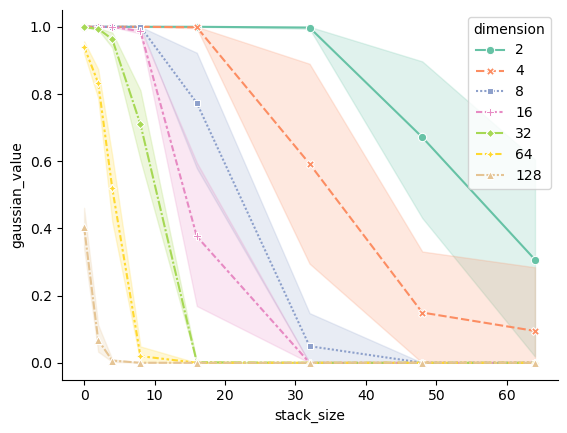

In [52]:
sns.lineplot(data=results_df, y="gaussian_value", x="stack_size", hue="dimension", style="dimension", palette="Set2", markers=True)
